# Final Project Notebook
### Data Science for Healthcare

---
## Project framework

Please read these instructions carefully before starting.

**Your role:** you are a data science team tasked with analysing a real clinical dataset. No explanation of the variables is provided: you will need to explore them, form hypotheses, and find answers.

**The instructor's role:** your instructor acts as the *clinical expert* for this project. You can (and should) consult him whenever you have questions about the clinical meaning of a variable, the plausibility of an analytical choice, or the interpretation of results. Any clinical question you bring will be answered and discussed together.

**No pre-defined path:** this dataset is huge, a lot of different analyses can be performed, so don't search for 'the right one'. Many of them can be right! Just discuss them with the instructor.

**How to document your work:**
At the end of every phase you may add a markdown cell where the team records the choices made and their clinical rationale. This is not a technical comment on the code, it is the trace of your reasoning. **This part is optional**, but it may be useful to you in the final phase of poster composition.

---

## Phase 0: Setup and dataset loading

In [1]:
"""# Install the library if needed (run once)
!pip install ucimlrepo"""

'# Install the library if needed (run once)\n!pip install ucimlrepo'

In [2]:
"""from ucimlrepo import fetch_ucirepo
import pandas as pd
import numpy as np
pd.set_option('display.max_colwidth', None)

# Load the dataset
support2 = fetch_ucirepo(id=880)

# Features and targets as separate dataframes
X = support2.data.features
y = support2.data.targets

print("Dataset loaded successfully.")
print(f"X (features) shape: {X.shape}")
print(f"y (targets)  shape: {y.shape}")"""

'from ucimlrepo import fetch_ucirepo\nimport pandas as pd\nimport numpy as np\npd.set_option(\'display.max_colwidth\', None)\n\n# Load the dataset\nsupport2 = fetch_ucirepo(id=880)\n\n# Features and targets as separate dataframes\nX = support2.data.features\ny = support2.data.targets\n\nprint("Dataset loaded successfully.")\nprint(f"X (features) shape: {X.shape}")\nprint(f"y (targets)  shape: {y.shape}")'

In [3]:
import pandas as pd
import numpy as np

pd.set_option('display.max_colwidth', None)

# Bypassiamo i server UCI/Vanderbilt che sono offline e usiamo un mirror GitHub affidabile
url_mirror = "https://raw.githubusercontent.com/MGensheimer/nnet-survival/master/data/support2.csv"

print("Scaricamento del dataset dal mirror in corso...")
try:
    df_main = pd.read_csv(url_mirror)
    df_main.insert(0, 'id', df_main.index)
    print("-" * 50)
    print(f"Dataset caricato con successo! ✅")
    print(f"Dimensioni della matrice: {df_main.shape}")
    print("-" * 50)
    display(df_main.head())
except Exception as e:
    print(f"Errore nel caricamento: {e}")

Scaricamento del dataset dal mirror in corso...
--------------------------------------------------
Dataset caricato con successo! ✅
Dimensioni della matrice: (9105, 48)
--------------------------------------------------


,id,age,death,sex,hospdead,slos,d.time,dzgroup,dzclass,num.co,...,crea,sod,ph,glucose,bun,urine,adlp,adls,sfdm2,adlsc
1,1,62.84998,0,male,0,5,2029,Lung Cancer,Cancer,0,...,1.199951,141.0,7.459961,NaN,NaN,NaN,7.0,7.0,NaN,7.0
2,2,60.33899,1,female,1,4,4,Cirrhosis,COPD/CHF/Cirrhosis,2,...,5.500000,132.0,7.250000,NaN,NaN,NaN,NaN,1.0,<2 mo. follow-up,1.0
3,3,52.74698,1,female,0,17,47,Cirrhosis,COPD/CHF/Cirrhosis,2,...,2.000000,134.0,7.459961,NaN,NaN,NaN,1.0,0.0,<2 mo. follow-up,0.0
4,4,42.38498,1,female,0,3,133,Lung Cancer,Cancer,2,...,0.799927,139.0,NaN,NaN,NaN,NaN,0.0,0.0,no(M2 and SIP pres),0.0
5,5,79.88495,0,female,0,16,2029,ARF/MOSF w/Sepsis,ARF/MOSF,1,...,0.799927,143.0,7.509766,NaN,NaN,NaN,NaN,2.0,no(M2 and SIP pres),2.0


In [4]:
"""# Dataset metadata
support2.metadata"""

'# Dataset metadata\nsupport2.metadata'

In [5]:
"""# Variable information: name, role, type
support2.variables"""

'# Variable information: name, role, type\nsupport2.variables'

In [6]:
"""df_full = support2.data.original
print("Full dataset:")
print(df_full.head())"""

'df_full = support2.data.original\nprint("Full dataset:")\nprint(df_full.head())'

---
## Phase 1: Exploration and Dataset understanding

In [7]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import numpy as np
import math
"""
#dataset che useremo, facciamo copy() per evitare problemi di puntatori
df_main = support2.data.original.copy()
print("Shape of the dataset:", df_main.shape)
display(df_main.head()) #display first 5 rows
"""
#dataset per provare modifiche più drastiche
df_prova = df_main.copy()

In [8]:
# Quick summary statistics
# .describe() computes count, mean, std, min, 25%, 50%, 75%, max for every numerical column.
# This is one of the first things you should do with any new dataset.
# It helps you spot:
# - Very different scales between features
# - Potential outliers (look at min/max vs mean)
# - Whether the data makes sense (e.g., no negative values for radius)

df_main.describe()

,id,age,death,hospdead,slos,d.time,num.co,edu,scoma,charges,...,bili,crea,sod,ph,glucose,bun,urine,adlp,adls,adlsc
count,9105.000000,9105.000000,9105.000000,9105.000000,9105.000000,9105.000000,9105.000000,7471.000000,9104.000000,8.933000e+03,...,6504.000000,9038.000000,9104.000000,6821.000000,4605.000000,4753.000000,4243.000000,3464.000000,6238.000000,9105.000000
mean,4553.000000,62.650823,0.681054,0.259198,17.863042,478.449863,1.868644,11.747691,12.058546,5.999579e+04,...,2.554463,1.770961,137.568541,7.415364,159.873398,32.349463,2191.546047,1.157910,1.637384,1.888272
std,2628.531434,15.593710,0.466094,0.438219,22.006440,560.383272,1.344409,3.447743,24.636694,1.026488e+05,...,5.318448,1.686041,6.029326,0.080563,88.391541,26.792288,1455.245777,1.739672,2.231358,2.003763
min,1.000000,18.041990,0.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,1.169000e+03,...,0.099991,0.099991,110.000000,6.829102,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2277.000000,52.797000,0.000000,0.000000,6.000000,26.000000,1.000000,10.000000,0.000000,9.740000e+03,...,0.500000,0.899902,134.000000,7.379883,103.000000,14.000000,1165.500000,0.000000,0.000000,0.000000
50%,4553.000000,64.856990,1.000000,0.000000,11.000000,233.000000,2.000000,12.000000,0.000000,2.502400e+04,...,0.899902,1.199951,137.000000,7.419922,135.000000,23.000000,1968.000000,0.000000,1.000000,1.000000
75%,6829.000000,73.998960,1.000000,1.000000,20.000000,761.000000,3.000000,14.000000,9.000000,6.459800e+04,...,1.899902,1.899902,141.000000,7.469727,188.000000,42.000000,3000.000000,2.000000,3.000000,3.000000
max,9105.000000,101.847960,1.000000,1.000000,343.000000,2029.000000,9.000000,31.000000,100.000000,1.435423e+06,...,63.000000,21.500000,181.000000,7.769531,1092.000000,300.000000,9000.000000,7.000000,7.000000,7.073242


In [9]:
df_main.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9105 entries, 1 to 9105
Data columns (total 48 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        9105 non-null   int64  
 1   age       9105 non-null   float64
 2   death     9105 non-null   int64  
 3   sex       9105 non-null   object 
 4   hospdead  9105 non-null   int64  
 5   slos      9105 non-null   int64  
 6   d.time    9105 non-null   int64  
 7   dzgroup   9105 non-null   object 
 8   dzclass   9105 non-null   object 
 9   num.co    9105 non-null   int64  
 10  edu       7471 non-null   float64
 11  income    6123 non-null   object 
 12  scoma     9104 non-null   float64
 13  charges   8933 non-null   float64
 14  totcst    8217 non-null   float64
 15  totmcst   5630 non-null   float64
 16  avtisst   9023 non-null   float64
 17  race      9063 non-null   object 
 18  sps       9104 non-null   float64
 19  aps       9104 non-null   float64
 20  surv2m    9104 non-null   float64
 

In [10]:
!pip install missingno
import missingno as msno

<Axes: >

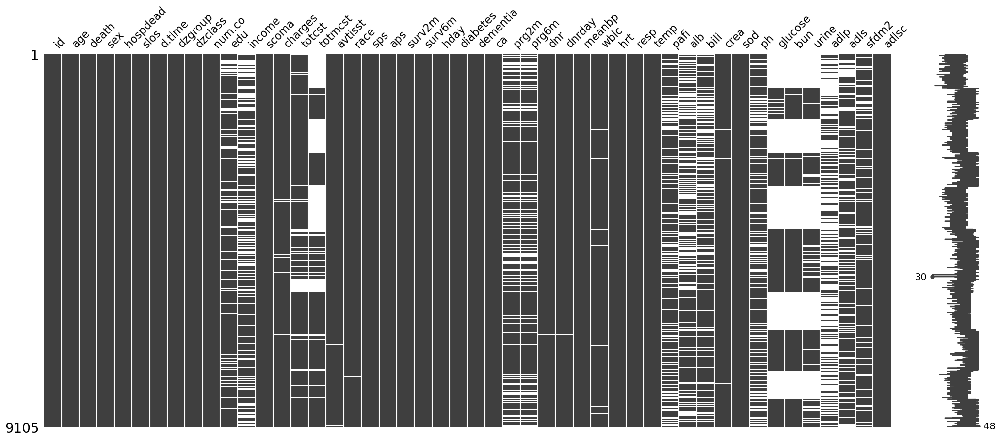

In [11]:
#matrice che ci fa vedere le variabili che hanno più missing(missing colorati di bianco)
msno.matrix(df_main)

In [12]:
#variabili con quantitità  missing values con percentuale (ordine decrescente)
missing1 = df_main.isnull().sum()
missing_pct1 = (missing1 / len(df_main)) * 100

missing_df1 = pd.DataFrame({
    'missing_count': missing1,
    'missing_pct': missing_pct1
}).sort_values('missing_pct', ascending=False)

print(missing_df1[missing_df1['missing_count'] > 0])

         missing_count  missing_pct
adlp              5641    61.954970
urine             4862    53.399231
glucose           4500    49.423394
bun               4352    47.797913
totmcst           3475    38.165843
alb               3372    37.034596
income            2982    32.751236
adls              2867    31.488193
bili              2601    28.566722
pafi              2325    25.535420
ph                2284    25.085118
prg2m             1649    18.110928
edu               1634    17.946183
prg6m             1633    17.935200
sfdm2             1400    15.376167
totcst             888     9.752883
wblc               212     2.328391
charges            172     1.889072
avtisst             82     0.900604
crea                67     0.735859
race                42     0.461285
dnrday              30     0.329489
dnr                 30     0.329489
meanbp               1     0.010983
hrt                  1     0.010983
resp                 1     0.010983
surv6m               1     0

In [13]:
#CATEGORICAL VALUES
# Classify each attribute

#  Let's see what pandas automatically detects:
print("Data types detected by pandas:\n")
print(df_main.dtypes)

# float64: pandas detected a numerical column
# object: pandas detected a text/string column (categorical)

# But pandas can't tell the difference between nominal and ordinal!
# That requires domain knowledge (understanding what the data means).

Data types detected by pandas:

id            int64
age         float64
death         int64
sex          object
hospdead      int64
slos          int64
d.time        int64
dzgroup      object
dzclass      object
num.co        int64
edu         float64
income       object
scoma       float64
charges     float64
totcst      float64
totmcst     float64
avtisst     float64
race         object
sps         float64
aps         float64
surv2m      float64
surv6m      float64
hday          int64
diabetes      int64
dementia      int64
ca           object
prg2m       float64
prg6m       float64
dnr          object
dnrday      float64
meanbp      float64
wblc        float64
hrt         float64
resp        float64
temp        float64
pafi        float64
alb         float64
bili        float64
crea        float64
sod         float64
ph          float64
glucose     float64
bun         float64
urine       float64
adlp        float64
adls        float64
sfdm2        object
adlsc       float64
dtype: o

In [14]:
# Nomi delle colonne con almeno un missing
cols_with_missing = df_main.columns[df_main.isnull().any()]
print(f"Colonne con almeno un missing: {len(cols_with_missing)}")
print(cols_with_missing.tolist())


Colonne con almeno un missing: 33
['edu', 'income', 'scoma', 'charges', 'totcst', 'totmcst', 'avtisst', 'race', 'sps', 'aps', 'surv2m', 'surv6m', 'prg2m', 'prg6m', 'dnr', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp', 'adls', 'sfdm2']


In [15]:
# Mostra solo le righe dove 'dnr' ha valori mancanti
df_dnr_mancanti=df_main[df_main["dnr"].isna()]
print(df_dnr_mancanti)

        id       age  death     sex  hospdead  slos  d.time  \
2        2  60.33899      1  female         1     4       4   
166    166  52.66800      1  female         1    13      13   
174    174  37.71899      1    male         1     7       7   
188    188  63.85999      1  female         1     5       5   
769    769  47.98099      0  female         0     4    1364   
1016  1016  55.58398      1  female         0   110     208   
1559  1559  68.34198      1    male         1    24      24   
1585  1585  59.31000      0    male         0     5     346   
3094  3094  29.29799      0    male         0    13     492   
3130  3130  75.27399      1    male         1    10      10   
4397  4397  26.04500      0    male         0    31    1029   
4460  4460  67.09094      1    male         0    10     568   
4515  4515  44.32898      1    male         0     5     864   
4538  4538  62.86398      0    male         0     5     957   
5394  5394  62.52197      1    male         1     3    

In [16]:
#cancella qualunque riga con missing values
df_prova.dropna(inplace=True)
print(f"df_prova (full dataframe) shape: {df_prova.shape}")
df_prova.info()

df_prova (full dataframe) shape: (306, 48)
<class 'pandas.core.frame.DataFrame'>
Index: 306 entries, 835 to 9092
Data columns (total 48 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        306 non-null    int64  
 1   age       306 non-null    float64
 2   death     306 non-null    int64  
 3   sex       306 non-null    object 
 4   hospdead  306 non-null    int64  
 5   slos      306 non-null    int64  
 6   d.time    306 non-null    int64  
 7   dzgroup   306 non-null    object 
 8   dzclass   306 non-null    object 
 9   num.co    306 non-null    int64  
 10  edu       306 non-null    float64
 11  income    306 non-null    object 
 12  scoma     306 non-null    float64
 13  charges   306 non-null    float64
 14  totcst    306 non-null    float64
 15  totmcst   306 non-null    float64
 16  avtisst   306 non-null    float64
 17  race      306 non-null    object 
 18  sps       306 non-null    float64
 19  aps       306 non-null    floa

In [17]:
# Checking for missing values
# Real clinical data almost always has missing values.
# .isnull().sum() counts how many NaN values each column has.
df_prova.shape
missing = df_prova.isnull().sum()
print("Missing values per column:\n")
print(missing[missing > 0] if missing.sum() > 0 else "No missing values found.")

Missing values per column:

No missing values found.


In [18]:
#panoramica completa dei tipi:
df_main.dtypes.value_counts()

float64    31
int64       9
object      8
Name: count, dtype: int64

In [19]:
#vedere i nomi delle colonne categoriche:
df_main.select_dtypes(include='object').columns

Index(['sex', 'dzgroup', 'dzclass', 'income', 'race', 'ca', 'dnr', 'sfdm2'], dtype='object')

In [20]:
#conteggio dei livelli nelle diverse colonne categoriche
#tutte le colonne categoriche hanno più di 1 sottolivello, quindi non eliminiremo nessuna(non c'è nessun valore costante)
cols_cat=['sex', 'dzgroup', 'dzclass', 'income', 'race', 'ca', 'dnr', 'sfdm2']
for col in cols_cat:
    print(f'Colonna {col}: {df_main[col].nunique()} sottolivelli')

Colonna sex: 2 sottolivelli
Colonna dzgroup: 8 sottolivelli
Colonna dzclass: 4 sottolivelli
Colonna income: 4 sottolivelli
Colonna race: 5 sottolivelli
Colonna ca: 3 sottolivelli
Colonna dnr: 3 sottolivelli
Colonna sfdm2: 5 sottolivelli


In [21]:
#conteggio dei livelli nelle diverse colonne numeriche
#tutte le colonne hanno più di 1 sottolivello, quindi non eliminiremo nessuna (non c'è nessun valore costante)

cols_num = ['id', 'age', 'death', 'hospdead', 'slos', 'd.time', 'num.co', 'edu',
       'scoma', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps',
       'surv2m', 'surv6m', 'hday', 'diabetes', 'dementia', 'prg2m', 'prg6m',
       'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb',
       'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp', 'adls',
       'adlsc']
for col in cols_num:
    print(f'Colonna {col}: {df_main[col].nunique()} sottolivelli')

Colonna id: 9105 sottolivelli
Colonna age: 7323 sottolivelli
Colonna death: 2 sottolivelli
Colonna hospdead: 2 sottolivelli
Colonna slos: 167 sottolivelli
Colonna d.time: 1724 sottolivelli
Colonna num.co: 10 sottolivelli
Colonna edu: 31 sottolivelli
Colonna scoma: 11 sottolivelli
Colonna charges: 8501 sottolivelli
Colonna totcst: 8197 sottolivelli
Colonna totmcst: 5516 sottolivelli
Colonna avtisst: 352 sottolivelli
Colonna sps: 604 sottolivelli
Colonna aps: 125 sottolivelli
Colonna surv2m: 949 sottolivelli
Colonna surv6m: 936 sottolivelli
Colonna hday: 85 sottolivelli
Colonna diabetes: 2 sottolivelli
Colonna dementia: 2 sottolivelli
Colonna prg2m: 51 sottolivelli
Colonna prg6m: 88 sottolivelli
Colonna dnrday: 177 sottolivelli
Colonna meanbp: 164 sottolivelli
Colonna wblc: 499 sottolivelli
Colonna hrt: 186 sottolivelli
Colonna resp: 66 sottolivelli
Colonna temp: 98 sottolivelli
Colonna pafi: 1457 sottolivelli
Colonna alb: 60 sottolivelli
Colonna bili: 295 sottolivelli
Colonna crea: 130 

In [22]:
#controllo std per vedere se ci sono uguali a 0, in quel caso elimino quelle colonne numeriche
df_main.describe()

,id,age,death,hospdead,slos,d.time,num.co,edu,scoma,charges,...,bili,crea,sod,ph,glucose,bun,urine,adlp,adls,adlsc
count,9105.000000,9105.000000,9105.000000,9105.000000,9105.000000,9105.000000,9105.000000,7471.000000,9104.000000,8.933000e+03,...,6504.000000,9038.000000,9104.000000,6821.000000,4605.000000,4753.000000,4243.000000,3464.000000,6238.000000,9105.000000
mean,4553.000000,62.650823,0.681054,0.259198,17.863042,478.449863,1.868644,11.747691,12.058546,5.999579e+04,...,2.554463,1.770961,137.568541,7.415364,159.873398,32.349463,2191.546047,1.157910,1.637384,1.888272
std,2628.531434,15.593710,0.466094,0.438219,22.006440,560.383272,1.344409,3.447743,24.636694,1.026488e+05,...,5.318448,1.686041,6.029326,0.080563,88.391541,26.792288,1455.245777,1.739672,2.231358,2.003763
min,1.000000,18.041990,0.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,1.169000e+03,...,0.099991,0.099991,110.000000,6.829102,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2277.000000,52.797000,0.000000,0.000000,6.000000,26.000000,1.000000,10.000000,0.000000,9.740000e+03,...,0.500000,0.899902,134.000000,7.379883,103.000000,14.000000,1165.500000,0.000000,0.000000,0.000000
50%,4553.000000,64.856990,1.000000,0.000000,11.000000,233.000000,2.000000,12.000000,0.000000,2.502400e+04,...,0.899902,1.199951,137.000000,7.419922,135.000000,23.000000,1968.000000,0.000000,1.000000,1.000000
75%,6829.000000,73.998960,1.000000,1.000000,20.000000,761.000000,3.000000,14.000000,9.000000,6.459800e+04,...,1.899902,1.899902,141.000000,7.469727,188.000000,42.000000,3000.000000,2.000000,3.000000,3.000000
max,9105.000000,101.847960,1.000000,1.000000,343.000000,2029.000000,9.000000,31.000000,100.000000,1.435423e+06,...,63.000000,21.500000,181.000000,7.769531,1092.000000,300.000000,9000.000000,7.000000,7.000000,7.073242


In [23]:
#mi restituisce colonne con std a 0 se esistono
df_main.describe().loc['std'][df_main.describe().loc['std'] == 0]
#potrei dopo controllare se esistono standard deviation molto piccole

Series([], Name: std, dtype: float64)

In [24]:
#ordine crescente in base allo standard deviation delle variabili numeriche
df_main.describe().loc['std'].sort_values(ascending=True)

ph               0.080563
dementia         0.177359
surv2m           0.248175
surv6m           0.253343
prg2m            0.298367
prg6m            0.304367
diabetes         0.396436
hospdead         0.438219
death            0.466094
alb              0.875944
temp             1.251796
num.co           1.344409
crea             1.686041
adlp             1.739672
adlsc            2.003763
adls             2.231358
edu              3.447743
bili             5.318448
sod              6.029326
hday             9.126811
wblc             9.266329
resp             9.573801
sps              9.899377
avtisst         13.233248
age             15.593710
aps             19.903852
dnrday          19.944216
slos            22.006440
scoma           24.636694
bun             26.792288
meanbp          27.687692
hrt             31.559292
glucose         88.391541
pafi           109.665593
d.time         560.383272
urine         1455.245777
id            2628.531434
totmcst      43604.261932
totcst      

In [25]:
#righe ripetute(duplicati)
print(f'Dimensione del set prima di eliminare le righe ripetute: {df_main.shape}')
df_main.drop_duplicates(inplace=True)
print(f'Dimensione del set dopo aver eliminato le righe ripetute: {df_main.shape}')

Dimensione del set prima di eliminare le righe ripetute: (9105, 48)
Dimensione del set dopo aver eliminato le righe ripetute: (9105, 48)


In [26]:
# Mostra solo le righe dove 'dnr' ha valori mancanti
df_dnr_mancanti=df_main[df_main["dnr"].isna()]
print(df_dnr_mancanti)

        id       age  death     sex  hospdead  slos  d.time  \
2        2  60.33899      1  female         1     4       4   
166    166  52.66800      1  female         1    13      13   
174    174  37.71899      1    male         1     7       7   
188    188  63.85999      1  female         1     5       5   
769    769  47.98099      0  female         0     4    1364   
1016  1016  55.58398      1  female         0   110     208   
1559  1559  68.34198      1    male         1    24      24   
1585  1585  59.31000      0    male         0     5     346   
3094  3094  29.29799      0    male         0    13     492   
3130  3130  75.27399      1    male         1    10      10   
4397  4397  26.04500      0    male         0    31    1029   
4460  4460  67.09094      1    male         0    10     568   
4515  4515  44.32898      1    male         0     5     864   
4538  4538  62.86398      0    male         0     5     957   
5394  5394  62.52197      1    male         1     3    

In [27]:
# Righe dove dnr è mancante
mask_dnr_missing = df_main['dnr'].isna()

# Quanti missing hanno le ALTRE colonne, solo nelle righe con dnr mancante
missing_nelle_righe_dnr = df_main[mask_dnr_missing].isnull().sum()
print("Missing nelle righe con dnr NaN:\n")
print(missing_nelle_righe_dnr[missing_nelle_righe_dnr > 0])

Missing nelle righe con dnr NaN:

edu         3
income      7
scoma       1
charges    26
totcst     27
totmcst    30
avtisst     1
sps         1
aps         1
surv2m      1
surv6m      1
prg2m       4
prg6m       4
dnr        30
dnrday     30
wblc        1
pafi       11
alb        15
bili        9
crea        1
ph         11
glucose     9
bun         9
urine      10
adlp       21
adls        7
dtype: int64


In [28]:
# Estrazione delle 30 righe con dnr mancante (volendo puoi decidere te da quale dataset vedere)
df_dnr_missing = df_main[df_main["dnr"].isna()].copy()

# Colonne chiave per l'analisi clinica (qua decidi tu le colonne che vuoi vedere)
cols_interest = [
    'sex', 'dzgroup', 'dzclass', 'income', 'race', 'ca', 'dnr', 'sfdm2',
    'id', 'age', 'death', 'hospdead', 'slos', 'd.time', 'num.co', 'edu',
       'scoma', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps',
       'surv2m', 'surv6m', 'hday', 'diabetes', 'dementia', 'prg2m', 'prg6m',
       'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb',
       'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp', 'adls',
       'adlsc'
]

print(f"Righe con dnr mancante: {len(df_dnr_missing)}\n")
df_dnr_missing[cols_interest]

Righe con dnr mancante: 30



,sex,dzgroup,dzclass,income,race,ca,dnr,sfdm2,id,age,...,bili,crea,sod,ph,glucose,bun,urine,adlp,adls,adlsc
2,female,Cirrhosis,COPD/CHF/Cirrhosis,$11-$25k,white,no,NaN,<2 mo. follow-up,2,60.33899,...,NaN,5.500000,132.0,7.250000,NaN,NaN,NaN,NaN,1.0,1.000000
166,female,Coma,Coma,NaN,white,no,NaN,<2 mo. follow-up,166,52.66800,...,NaN,0.500000,138.0,7.579102,NaN,NaN,NaN,NaN,NaN,2.500977
174,male,ARF/MOSF w/Sepsis,ARF/MOSF,NaN,white,no,NaN,<2 mo. follow-up,174,37.71899,...,0.799927,2.799805,148.0,7.429688,NaN,NaN,NaN,NaN,1.0,1.000000
188,female,Coma,Coma,NaN,white,no,NaN,<2 mo. follow-up,188,63.85999,...,NaN,0.699951,149.0,7.529297,NaN,NaN,NaN,NaN,NaN,2.530762
769,female,Lung Cancer,Cancer,NaN,white,metastatic,NaN,no(M2 and SIP pres),769,47.98099,...,NaN,0.799927,136.0,NaN,NaN,NaN,NaN,NaN,NaN,2.524902
1016,female,MOSF w/Malig,ARF/MOSF,$11-$25k,white,metastatic,NaN,SIP>=30,1016,55.58398,...,7.799805,0.699951,126.0,7.349609,188.0,22.0,6865.0,NaN,NaN,2.901855
1559,male,COPD,COPD/CHF/Cirrhosis,under $11k,white,no,NaN,<2 mo. follow-up,1559,68.34198,...,8.000000,5.799805,145.0,NaN,NaN,130.0,2145.0,NaN,1.0,1.000000
1585,male,Colon Cancer,Cancer,>$50k,white,metastatic,NaN,no(M2 and SIP pres),1585,59.31000,...,0.799927,1.199951,142.0,NaN,117.0,18.0,1810.0,NaN,NaN,1.873047
3094,male,ARF/MOSF w/Sepsis,ARF/MOSF,$25-$50k,white,no,NaN,no(M2 and SIP pres),3094,29.29799,...,1.099854,0.899902,150.0,7.449219,209.0,30.0,690.0,NaN,0.0,0.000000
3130,male,ARF/MOSF w/Sepsis,ARF/MOSF,$25-$50k,white,no,NaN,<2 mo. follow-up,3130,75.27399,...,1.299805,1.799805,135.0,7.409180,216.0,41.0,685.0,NaN,0.0,0.000000


# Auditing PRELIMINARE - Slos e dnrday

In [29]:
# Lavoriamo sulla copia del dataset
# Rimuoviamo i NaN solo sulle colonne del grafico per evitare che matplotlib si blocchi
df_raw_check = df_main.dropna(subset=["slos", "dnrday", "dnr"]).copy()
df_raw_check.shape

# ----------------------------------------------------
# CHECK 1: Il paradosso temporale (dnrday > slos)
# ----------------------------------------------------
# Controlliamo se qualcuno ha una data DNR successiva alla fine dello studio
violazioni_assolute = df_raw_check[df_raw_check["dnrday"] > df_raw_check["slos"]]
print(
    f"1. Casi totali in cui dnrday > slos (Errore Logico): {len(violazioni_assolute)}"
)
# ----------------------------------------------------
# CHECK 2: Coerenza del gruppo 'no dnr'
# ----------------------------------------------------
df_no_dnr = df_raw_check[df_raw_check["dnr"] == "no dnr"]
coincidenti = (df_no_dnr["dnrday"] == df_no_dnr["slos"]).sum()
non_coincidenti = (df_no_dnr["dnrday"] != df_no_dnr["slos"]).sum()

print(f"\n2. Analisi dei pazienti 'no dnr' (Totale nel dataset: {len(df_no_dnr)}):")
print(
    f"   - Casi in cui dnrday coincide con slos (Censura di default): {coincidenti}"
)
print(f"   - Casi in cui dnrday è diverso da slos: {non_coincidenti}")

1. Casi totali in cui dnrday > slos (Errore Logico): 0

2. Analisi dei pazienti 'no dnr' (Totale nel dataset: 5880):
   - Casi in cui dnrday coincide con slos (Censura di default): 5880
   - Casi in cui dnrday è diverso da slos: 0


In [30]:
non_coincidenti_dtime = (df_no_dnr["dnrday"] <= df_no_dnr["d.time"]).sum()
print(non_coincidenti_dtime)

#d.time (tempo totale dello studio è superiore o uguale sia alla degenza che a dnrday)
#Uso dnrday perché corrisponde alla degenza.
#La maggior parte solo minore 5437: usciti da ospedale, il resto morti


5880


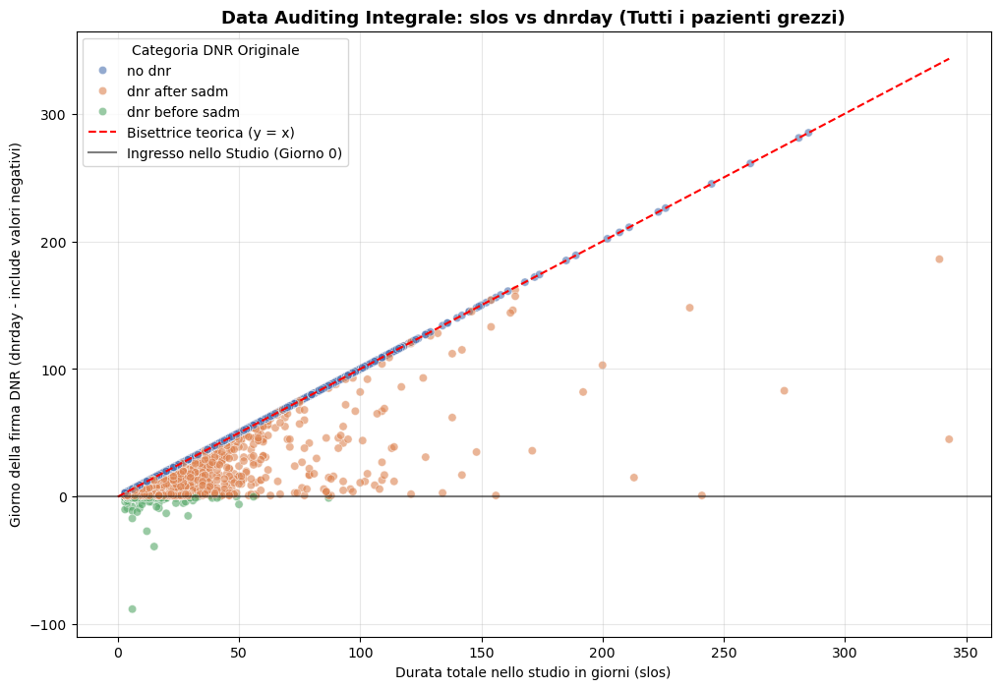

In [31]:
# ----------------------------------------------------
# VISUALIZZAZIONE GRAFICA COMPLETA (Asse Y include i negativi)
# ----------------------------------------------------
plt.figure(figsize=(12, 8))

# Mappiamo tutte e tre le categorie reali del dataset originale con tre colori distinti
sns.scatterplot(
    data=df_raw_check,
    x="slos",
    y="dnrday",
    hue="dnr",
    alpha=0.6,
    palette={
        "no dnr": "#4C72B0",  # Blu
        "dnr after sadm": "#DD8452",  # Arancione
        "dnr before sadm": "#55A868",  # Verde
    },
)

# Bisettrice teorica (y = x): il limite invalicabile per i tempi post-ingresso
max_val = max(
    df_raw_check["slos"].max(), df_raw_check["dnrday"].max()
)
plt.plot(
    [0, max_val],
    [0, max_val],
    color="red",
    linestyle="--",
    label="Bisettrice teorica (y = x)",
)

# Linea dello Zero: divide i firmatari pre-studio dai firmatari post-studio
plt.axhline(
    y=0,
    color="black",
    linestyle="-",
    alpha=0.5,
    label="Ingresso nello Studio (Giorno 0)",
)

plt.title(
    "Data Auditing Integrale: slos vs dnrday (Tutti i pazienti grezzi)",
    fontsize=13,
    fontweight="bold",
)
plt.xlabel("Durata totale nello studio in giorni (slos)")
plt.ylabel("Giorno della firma DNR (dnrday - include valori negativi)")
plt.legend(title="Categoria DNR Originale", loc="best")
plt.grid(True, alpha=0.3)
plt.show()

# Gestione dnr e dnrday

In [32]:
# 1. Isoliamo prima di tutto solo i pazienti "dnr before sadm"
df_before = df_main[df_main["dnr"] == "dnr before sadm"].copy()

# 2. Calcoliamo il giorno della firma rispetto all'ingresso in ospedale
# Ricorda: hday è il giorno di ricovero in cui il paziente entra nello studio (es. giorno 3)
# dnrday è negativo (es. -2, ovvero 2 giorni prima dello studio)
df_before["giorno_dnr_in_ospedale"] = df_before["dnrday"] + df_before["hday"]

# 3. Applichiamo la separazione logica:
# Se giorno_dnr_in_ospedale >= 0, la firma è avvenuta durante l'attuale ricovero
# Se giorno_dnr_in_ospedale < 0, la firma è antecedente al ricovero (es. testamento biologico a casa)
firme_in_ospedale = df_before[df_before["giorno_dnr_in_ospedale"] >= 0]
firme_prima_ospedale = df_before[df_before["giorno_dnr_in_ospedale"] < 0]

# 4. Calcolo dei conteggi e delle percentuali
tot_before = len(df_before)
conteggio_ospedale = len(firme_in_ospedale)
conteggio_casa = len(firme_prima_ospedale)

pct_ospedale = (conteggio_ospedale / tot_before) * 100
pct_casa = (conteggio_casa / tot_before) * 100

# ----------------------------------------------------
# STAMPA DEI RISULTATI
# ----------------------------------------------------
print(f"Totale pazienti con 'dnr before sadm': {tot_before}\n")
print(
    f"--> FIRMATO IN OSPEDALE (Pre-Studio): {conteggio_ospedale} pazienti ({pct_ospedale:.2f}%)"
)
print(
    f"    (Hanno firmato dopo il ricovero in reparto ma prima del giorno di inizio dello studio)\n"
)
print(
    f"--> FIRMATO PRIMA DEL RICOVERO (A casa): {conteggio_casa} pazienti ({pct_casa:.2f}%)"
)
print(f"    (Avevano già un documento o direttiva prima di entrare in ospedale)")


Totale pazienti con 'dnr before sadm': 239

--> FIRMATO IN OSPEDALE (Pre-Studio): 239 pazienti (100.00%)
    (Hanno firmato dopo il ricovero in reparto ma prima del giorno di inizio dello studio)

--> FIRMATO PRIMA DEL RICOVERO (A casa): 0 pazienti (0.00%)
    (Avevano già un documento o direttiva prima di entrare in ospedale)


In [33]:
if 'dnr' in df_main.columns:
    dnr_counts = df_main['dnr'].value_counts(dropna=False)
    print("Conteggio dei valori unici nella colonna 'dnr':")
    print(dnr_counts)
else:
    print("La colonna 'dnr' non è presente nel dataframe.")

Conteggio dei valori unici nella colonna 'dnr':
dnr
no dnr             5880
dnr after sadm     2956
dnr before sadm     239
NaN                  30
Name: count, dtype: int64


In [34]:
dnrday_less_than_0 = df_main[df_main['dnrday'] < 0].shape[0]
dnrday_greater_equal_0 = df_main[df_main['dnrday'] >= 0].shape[0]
#aggiunti per verifica:
dnrday_greater_0 = df_main[df_main['dnrday'] > 0].shape[0]
dnrday_equal_0 = df_main[df_main['dnrday'] == 0].shape[0]
dnrday_check = df_main[(df_main['dnrday'] >= 3) & (df_main['dnr'] != 'no dnr')].shape[0]

print(f"Numero di pazienti con dnrday minore di 0: {dnrday_less_than_0}")
print(f"Numero di pazienti con dnrday maggiore o uguale a 0: {dnrday_greater_equal_0}")

print(f"Numero di pazienti con dnrday maggiore a 0: {dnrday_greater_0}")
print(f"Numero di pazienti con dnrday uguale a 0: {dnrday_equal_0}")
print(f"Numero di pazienti con dnrday per check (firmato dnr dal terzo giorno): {dnrday_check}")

Numero di pazienti con dnrday minore di 0: 195
Numero di pazienti con dnrday maggiore o uguale a 0: 8880
Numero di pazienti con dnrday maggiore a 0: 8836
Numero di pazienti con dnrday uguale a 0: 44
Numero di pazienti con dnrday per check (firmato dnr dal terzo giorno): 1950


In [35]:
# Andiamo a cercare i 44 pazienti che si trovano nel limbo
pazienti_limbo = df_main[(df_main["dnr"] == "dnr before sadm") & (df_main["dnrday"] >= 0)]

print(f"Numero di pazienti incoerenti trovati: {len(pazienti_limbo)}")
print("Ecco la distribuzione dei loro dnrday:")
print(pazienti_limbo["dnrday"].value_counts())

Numero di pazienti incoerenti trovati: 44
Ecco la distribuzione dei loro dnrday:
dnrday
0.0    44
Name: count, dtype: int64


In [36]:
pazienti_dnr_after_sadm_day0 = df_main[(df_main['dnr'] == 'dnr after sadm') & (df_main['dnrday'] == 0)]

print(f"Numero di pazienti con 'dnr after sadm' e 'dnrday' == 0: {len(pazienti_dnr_after_sadm_day0)}")

Numero di pazienti con 'dnr after sadm' e 'dnrday' == 0: 0


In [37]:
# 1. Rimuoviamo i pochissimi casi con NaN nella colonna dnr (erano 30)
df_clean = df_main.dropna(subset=["dnr"]).copy()

# ====================================================
# LANDMARK ANALYSIS (HARD CUT 3 GIORNI)
# ====================================================
# Escludiamo i pazienti che hanno firmato o sono usciti dallo studio nei giorni 0, 1 e 2.
# Questo allinea la baseline clinica con i laboratori misurati al Giorno 3.
df_survival = df_clean[df_clean["dnrday"] >= 3].copy()

# Reset del tempo zero per il modello di Cox: il Giorno 3 diventa il nuovo "Inizio studio": per corretto rischio basale
df_survival["dnrday"] = df_survival["dnrday"] - 3

print(f"Pazienti DOPO il taglio Landmark (Giorno 3+): {df_survival.shape[0]}")
print(
    f"Minimo tempo nel dataset (deve essere == 0): {df_survival['dnrday'].min()}"
)

# 3. BINARIZZAZIONE FINALE DEL TARGET (L'EVENTO)
# 1 se ha firmato dopo (dnr after sadm), 0 se non ha mai firmato (no dnr)
df_survival["target_dnr_event"] = np.where(
    df_survival["dnr"] == "dnr after sadm", 1, 0
)

Pazienti DOPO il taglio Landmark (Giorno 3+): 7830
Minimo tempo nel dataset (deve essere == 0): 0.0


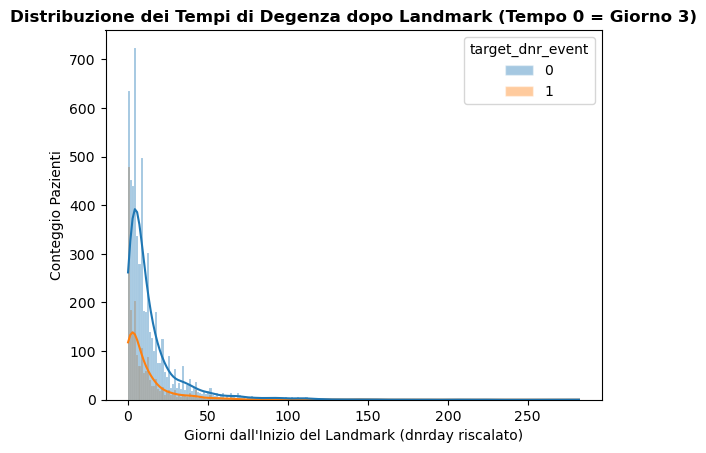

In [38]:
# 4. VISUALIZZAZIONE DELLA NUOVA DISTRIBUZIONE TEMPORALE RISCALATA
sns.histplot(
    data=df_survival,
    x="dnrday",
    kde=True,
    alpha=0.4,
    edgecolor=(1, 1, 1, 0.4),
    hue="target_dnr_event",
)
plt.title(
    "Distribuzione dei Tempi di Degenza dopo Landmark (Tempo 0 = Giorno 3)",
    fontsize=12,
    fontweight="bold",
)
plt.xlabel("Giorni dall'Inizio del Landmark (dnrday riscalato)")
plt.ylabel("Conteggio Pazienti")
plt.show()

In [39]:
nan_dnrday_survival_count = df_survival["dnrday"].isnull().sum()
print(f"Valori NaN residui in 'dnrday': {nan_dnrday_survival_count}")

Valori NaN residui in 'dnrday': 0


In [40]:
print("Conteggio pazienti per target_dnr_event:")
print(df_survival['target_dnr_event'].value_counts())

Conteggio pazienti per target_dnr_event:
target_dnr_event
0    5880
1    1950
Name: count, dtype: int64


In [41]:
# ====================================================
# AUDITING FINALE DELLE INCONGRUENZE TEMPORALI
# ====================================================
# Prima di procedere alla standardizzazione e ai modelli, verifichiamo la
# coerenza cronologica delle tempistiche rispetto alla nostra domanda clinica.

# Per fare i controlli incrociati usiamo il dataset originale 'df_main' pescando gli ID
# rimasti in 'df_survival', così da recuperare temporaneamente 'slos', 'd.time' e 'hospdead'
# Usiamo gli indici di df_survival per estrarre temporaneamente slos, d.time e hospdead dal dataset raw 'df'
df_audit = df_main[df_main.index.isin(df_survival.index)].copy()
df_audit["target_dnr_event"] = df_survival["target_dnr_event"]

# Ripristiniamo temporaneamente il dnrday originale non riscalato per l'auditing puro
df_audit["dnrday_originale"] = df_audit["dnrday"]

# 1. IL PARADOSSO DEL FUTURO POST-FOLLOW-UP
p1 = df_audit[
    (df_audit["target_dnr_event"] == 1)
    & (df_audit["dnrday_originale"] > df_audit["d.time"])
]
print(
    f"1. Firme DNR registrate DOPO la fine del follow-up (dnrday > d.time):  {len(p1)} casi"
)

# 2. VALIDITA' MATEMATICA DEL TEMPO DI OSSERVAZIONE
p2 = df_audit[df_audit["d.time"] <= 0]
print(
    f"2. Pazienti con tempo di follow-up totale non valido (d.time <= 0):    {len(p2)} casi"
)

# 3. IL PARADOSSO DELLA DEGENZA HOSP
p3 = df_audit[df_audit["d.time"] < df_audit["slos"]]
print(
    f"3. Casi in cui il follow-up totale è inferiore alla degenza (d.time < slos): {len(p3)} casi"
)

# 4. DISALLINEAMENTO DEL DECESSO IN REPARTO
p4 = df_audit[
    (df_audit["hospdead"] == 1) & (df_audit["d.time"] != df_audit["slos"])
]
print(
    f"4. Decessi intra-ospedalieri con slos e d.time disallineati: {len(p4)} casi"
)

# 5. PARADOSSO DELLA FIRMA POST-DIMISSIONE
p5 = df_audit[
    (df_audit["target_dnr_event"] == 1)
    & (df_audit["dnrday_originale"] > df_audit["slos"])
]
print(
    f"5. Firme DNR avvenute DOPO la dimissione dall'ospedale (dnrday > slos): {len(p5)} casi"
)

# 6. COERENZA DEL TEMPO DI CENSURA PER I 'NO DNR'
p6 = df_audit[
    (df_audit["target_dnr_event"] == 0)
    & (df_audit["dnrday_originale"] != df_audit["slos"])
]
print(
    f"6. Pazienti 'No DNR' con tempo dnrday non allineato alla degenza slos:  {len(p6)} casi"
)

# 7. CRITICITÃƒâ‚¬ MATEMATICA DEL NUOVO GIORNO 0 (Firme repentine al giorno 3 originale)
p7 = df_survival[(df_survival["target_dnr_event"] == 1) & (df_survival["dnrday"] == 0)]
print(
    f"7. Pazienti che hanno firmato il DNR esattamente all'inizio del Landmark (T=0): {len(p7)} casi"
)

1. Firme DNR registrate DOPO la fine del follow-up (dnrday > d.time):  0 casi
2. Pazienti con tempo di follow-up totale non valido (d.time <= 0):    0 casi
3. Casi in cui il follow-up totale è inferiore alla degenza (d.time < slos): 0 casi
4. Decessi intra-ospedalieri con slos e d.time disallineati: 0 casi
5. Firme DNR avvenute DOPO la dimissione dall'ospedale (dnrday > slos): 0 casi
6. Pazienti 'No DNR' con tempo dnrday non allineato alla degenza slos:  0 casi
7. Pazienti che hanno firmato il DNR esattamente all'inizio del Landmark (T=0): 291 casi


In [42]:
print(df_survival[df_survival["dnrday"] == 0]["target_dnr_event"].value_counts())

target_dnr_event
1    291
0    219
Name: count, dtype: int64


In [43]:
# Salviamo i 291 pazienti finiti a T=0 per evitare il crash del modello di Cox
df_survival.loc[df_survival["dnrday"] == 0, "dnrday"] = 0.5

In [44]:
#variabili con quantitità  missing values con percentuale (ordine decrescente)
missing1 = df_survival.isnull().sum()
missing_pct1 = (missing1 / len(df_survival)) * 100

missing_df1 = pd.DataFrame({
    'missing_count': missing1,
    'missing_pct': missing_pct1
}).sort_values('missing_pct', ascending=False)

print(missing_df1[missing_df1['missing_count'] > 0])

         missing_count  missing_pct
adlp              4715    60.217114
urine             4200    53.639847
glucose           3905    49.872286
bun               3769    48.135377
totmcst           3084    39.386973
alb               2910    37.164751
income            2518    32.158365
adls              2408    30.753512
bili              2224    28.403576
pafi              2011    25.683269
ph                1977    25.249042
prg2m             1415    18.071520
prg6m             1402    17.905492
edu               1338    17.088123
sfdm2             1300    16.602810
totcst             778     9.936143
wblc               168     2.145594
charges            137     1.749681
avtisst             71     0.906769
crea                49     0.625798
race                33     0.421456
resp                 1     0.012771
hrt                  1     0.012771
meanbp               1     0.012771
temp                 1     0.012771
sod                  1     0.012771


# Gestione errori con visualizzazione grafici

In [45]:
print(df_main.shape)
print(df_main.dtypes.value_counts())

(9105, 48)
float64    31
int64       9
object      8
Name: count, dtype: int64


In [46]:
print(df_survival.shape)
print(df_survival.columns.difference(df_main.columns))
print(df_survival['target_dnr_event'].dtypes)
print(df_survival['target_dnr_event'].value_counts())

(7830, 49)
Index(['target_dnr_event'], dtype='object')
int32
target_dnr_event
0    5880
1    1950
Name: count, dtype: int64


In [47]:
#panoramica completa dei tipi:
print(df_survival.dtypes.value_counts())
print(df_survival.dtypes)

float64    31
int64       9
object      8
int32       1
Name: count, dtype: int64
id                    int64
age                 float64
death                 int64
sex                  object
hospdead              int64
slos                  int64
d.time                int64
dzgroup              object
dzclass              object
num.co                int64
edu                 float64
income               object
scoma               float64
charges             float64
totcst              float64
totmcst             float64
avtisst             float64
race                 object
sps                 float64
aps                 float64
surv2m              float64
surv6m              float64
hday                  int64
diabetes              int64
dementia              int64
ca                   object
prg2m               float64
prg6m               float64
dnr                  object
dnrday              float64
meanbp              float64
wblc                float64
hrt                 fl

In [48]:
print(df_survival['race'].value_counts())

race
white       6110
black       1243
hispanic     272
other         99
asian         73
Name: count, dtype: int64


In [49]:
# conteggio dei livelli nelle diverse colonne numeriche in ordine crescente
cols_num = ['id', 'age', 'death', 'hospdead', 'slos', 'd.time', 'num.co', 'edu',
       'scoma', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps',
       'surv2m', 'surv6m', 'hday', 'diabetes', 'dementia', 'prg2m', 'prg6m',
       'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb',
       'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp', 'adls',
       'adlsc', 'target_dnr_event']

livelli = {col: df_survival[col].nunique() for col in cols_num}
for col, n in sorted(livelli.items(), key=lambda x: x[1], reverse=False):
    print(f'Colonna {col}: {n} sottolivelli')

Colonna death: 2 sottolivelli
Colonna hospdead: 2 sottolivelli
Colonna diabetes: 2 sottolivelli
Colonna dementia: 2 sottolivelli
Colonna target_dnr_event: 2 sottolivelli
Colonna adlp: 8 sottolivelli
Colonna adls: 8 sottolivelli
Colonna num.co: 10 sottolivelli
Colonna scoma: 11 sottolivelli
Colonna edu: 31 sottolivelli
Colonna prg2m: 48 sottolivelli
Colonna alb: 56 sottolivelli
Colonna sod: 58 sottolivelli
Colonna resp: 64 sottolivelli
Colonna ph: 72 sottolivelli
Colonna hday: 85 sottolivelli
Colonna prg6m: 85 sottolivelli
Colonna temp: 94 sottolivelli
Colonna aps: 124 sottolivelli
Colonna crea: 128 sottolivelli
Colonna bun: 152 sottolivelli
Colonna dnrday: 157 sottolivelli
Colonna meanbp: 159 sottolivelli
Colonna slos: 166 sottolivelli
Colonna hrt: 182 sottolivelli
Colonna bili: 283 sottolivelli
Colonna avtisst: 349 sottolivelli
Colonna glucose: 426 sottolivelli
Colonna wblc: 471 sottolivelli
Colonna sps: 572 sottolivelli
Colonna surv2m: 933 sottolivelli
Colonna surv6m: 936 sottolivell

Visualizzazione delle variabili categoriche Nominali e Ordinali:

In [50]:
#vedere i nomi delle colonne categoriche:
df_main.select_dtypes(include='object').columns

Index(['sex', 'dzgroup', 'dzclass', 'income', 'race', 'ca', 'dnr', 'sfdm2'], dtype='object')

In [51]:
# Verifica che le colonne categoriche siano effettivamente object
cols_categoriche_attese = ['sex', 'dzgroup', 'dzclass', 'income', 'race', 'ca', 'dnr', 'sfdm2']

print("=== VERIFICA DTYPE ===")
cols_object_reali = df_survival.select_dtypes(include='object').columns.tolist()

in_attese_non_trovate = [c for c in cols_categoriche_attese if c not in cols_object_reali]
trovate_non_attese    = [c for c in cols_object_reali if c not in cols_categoriche_attese]

print(f"Colonne object trovate:       {cols_object_reali}")
print(f"Attese ma non object:         {in_attese_non_trovate if in_attese_non_trovate else 'nessuna'}")
print(f"Object non attese (extra):    {trovate_non_attese if trovate_non_attese else 'nessuna'}")

# Classificazione SUPPORT2
nominali  = ['sex', 'dzgroup', 'dzclass', 'race']
ordinali  = ['income', 'dnr', 'sfdm2']
borderline = ['ca']

print("\n=== NOMINALI ===")
for col in nominali:
    if col in df_survival.columns:
        valori = df_survival[col].value_counts(dropna=False)
        na = df_survival[col].isna().sum()
        print(f"\n  {col}  (NA={na}, livelli={df_survival[col].nunique()})")
        for val, cnt in valori.items():
            print(f"    {str(val):<30} {cnt:>6}  ({100*cnt/len(df_survival):.1f}%)")

print("\n=== ORDINALI ===")
for col in ordinali:
    if col in df_survival.columns:
        valori = df_survival[col].value_counts(dropna=False)
        na = df_survival[col].isna().sum()
        print(f"\n  {col}  (NA={na}, livelli={df_survival[col].nunique()})")
        for val, cnt in valori.items():
            print(f"    {str(val):<40} {cnt:>6}  ({100*cnt/len(df_survival):.1f}%)")

print("\n=== BORDERLINE (verifica manuale) ===")
for col in borderline:
    if col in df_survival.columns:
        valori = df_survival[col].value_counts(dropna=False)
        na = df_survival[col].isna().sum()
        print(f"\n  {col}  (NA={na}, livelli={df_survival[col].nunique()})")
        for val, cnt in valori.items():
            print(f"    {str(val):<30} {cnt:>6}  ({100*cnt/len(df_survival):.1f}%)")
        print("  --> Valuta: se no < locale < metastatico ha senso nel tuo obiettivo, trattala come ordinale")


=== VERIFICA DTYPE ===
Colonne object trovate:       ['sex', 'dzgroup', 'dzclass', 'income', 'race', 'ca', 'dnr', 'sfdm2']
Attese ma non object:         nessuna
Object non attese (extra):    nessuna

=== NOMINALI ===

  sex  (NA=0, livelli=2)
    male                             4485  (57.3%)
    female                           3345  (42.7%)

  dzgroup  (NA=0, livelli=8)
    ARF/MOSF w/Sepsis                3197  (40.8%)
    CHF                              1248  (15.9%)
    COPD                              762  (9.7%)
    Lung Cancer                       712  (9.1%)
    MOSF w/Malig                      567  (7.2%)
    Cirrhosis                         473  (6.0%)
    Colon Cancer                      451  (5.8%)
    Coma                              420  (5.4%)

  dzclass  (NA=0, livelli=4)
    ARF/MOSF                         3764  (48.1%)
    COPD/CHF/Cirrhosis               2483  (31.7%)
    Cancer                           1163  (14.9%)
    Coma                              42

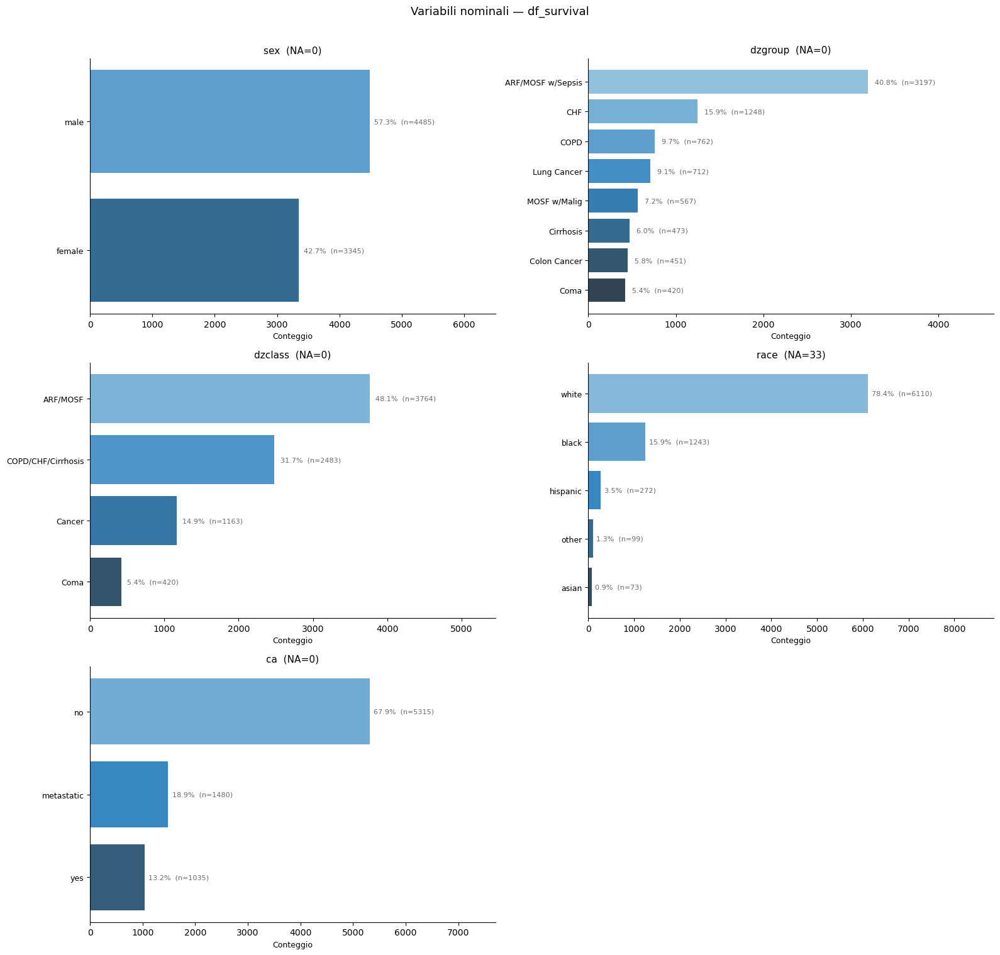

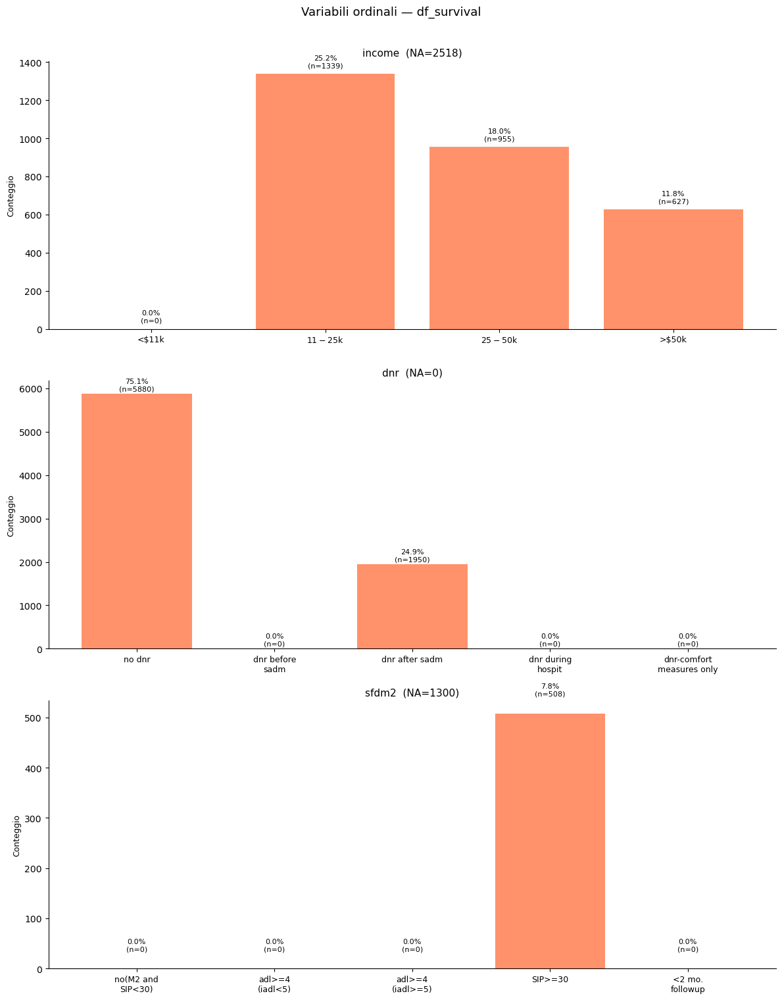

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import math
import textwrap

nominali   = ['sex', 'dzgroup', 'dzclass', 'race', 'ca']
ordinali   = ['income', 'dnr', 'sfdm2']

ordini = {
    'income': ['<$11k', '$11-$25k', '$25-$50k', '>$50k'],
    'dnr'   : ['no dnr', 'dnr before sadm', 'dnr after sadm',
               'dnr during hospit', 'dnr-comfort measures only'],
    'sfdm2' : ['no(M2 and SIP<30)', 'adl>=4 (iadl<5)', 'adl>=4 (iadl>=5)',
               'SIP>=30', '<2 mo. followup']
}

# ── NOMINALI: barre orizzontali ordinate per frequenza ──────────────────────
n_cols = 2
n_rows = math.ceil(len(nominali) / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 5))
axes = np.atleast_1d(axes).flatten()

for i, col in enumerate(nominali):
    data  = df_survival[col].dropna()
    total = len(data)
    na    = df_survival[col].isna().sum()

    # ordine per frequenza decrescente — giusto per le nominali
    order  = data.value_counts().index.tolist()
    counts = data.value_counts()

    # gradiente di blu: la barra più alta è più scura
    colors = sns.color_palette("Blues_d", len(order))
    axes[i].barh(range(len(order)), [counts[o] for o in order], color=colors)
    axes[i].set_yticks(range(len(order)))
    axes[i].set_yticklabels(order, fontsize=9)
    axes[i].invert_yaxis()  # categoria più frequente in alto

    for j, o in enumerate(order):
        cnt = counts[o]
        axes[i].text(cnt + total * 0.01, j,
                     f'{100*cnt/total:.1f}%  (n={cnt})',
                     va='center', fontsize=8, color='dimgray')

    axes[i].set_xlim(0, counts.max() * 1.45)
    axes[i].set_title(f'{col}  (NA={na})', fontsize=11)
    axes[i].set_xlabel('Conteggio', fontsize=9)
    axes[i].spines[['top', 'right']].set_visible(False)

for j in range(len(nominali), len(axes)):
    axes[j].set_visible(False)

plt.suptitle('Variabili nominali — df_survival', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

# ── ORDINALI: barre verticali ───────────────────────────────────────────────
fig, axes = plt.subplots(len(ordinali), 1, figsize=(12, len(ordinali) * 5))
axes = np.atleast_1d(axes).flatten()

for i, col in enumerate(ordinali):
    data   = df_survival[col].dropna()
    total  = len(data)
    na     = df_survival[col].isna().sum()
    order  = ordini[col]
    counts = [data.value_counts().get(o, 0) for o in order]

    x    = np.arange(len(order))
    bars = axes[i].bar(x, counts, color='coral', alpha=0.85)
    axes[i].spines[['top', 'right']].set_visible(False)

    for bar, cnt in zip(bars, counts):
        axes[i].text(bar.get_x() + bar.get_width() / 2,
                     bar.get_height() + total * 0.005,
                     f'{100*cnt/total:.1f}%\n(n={cnt})',
                     ha='center', va='bottom', fontsize=8)

    axes[i].set_xticks(x)
    axes[i].set_xticklabels([textwrap.fill(o, width=14) for o in order], fontsize=9)
    axes[i].set_title(f'{col}  (NA={na})', fontsize=11)
    axes[i].set_ylabel('Conteggio', fontsize=9)

plt.suptitle('Variabili ordinali — df_survival', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()


Visualizzazione delle variabili Numeriche Binarie e Ordinali:

In [53]:
# Classificazione basata su SUPPORT2
cols_num = ['id', 'age', 'death', 'hospdead', 'slos', 'd.time', 'num.co', 'edu',
       'scoma', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps',
       'surv2m', 'surv6m', 'hday', 'diabetes', 'dementia', 'prg2m', 'prg6m',
       'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb',
       'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp', 'adls',
       'adlsc', 'target_dnr_event']

binarie_support2   = ['death', 'hospdead', 'diabetes', 'dementia', 'target_dnr_event']
ordinali_support2  = ['adlp', 'adls', 'num.co', 'scoma']
escluse            = ['id']

# Le restanti sono continue
continue_support2 = [col for col in cols_num
                     if col not in binarie_support2 + ordinali_support2 + escluse]

# --- Verifica binarie ---
print("=== BINARIE ===")
for col in binarie_support2:
    valori = sorted(df_survival[col].dropna().unique().tolist())
    na = df_survival[col].isna().sum()
    print(f"  {col}: valori={valori}  |  NA={na}")

# --- Verifica ordinali ---
print("\n=== ORDINALI ===")
for col in ordinali_support2:
    valori = sorted(df_survival[col].dropna().unique().tolist())
    na = df_survival[col].isna().sum()
    is_int = df_survival[col].dropna().apply(lambda x: x == int(x)).all()
    print(f"  {col} ({len(valori)} livelli): {valori}")
    print(f"    NA={na}  |  tutti interi={is_int}")

# --- Verifica continue ---
print("\n=== CONTINUE ===")
desc = df_survival[continue_support2].describe().T[['min', 'max', 'mean', '50%']]
desc['NA'] = df_survival[continue_support2].isna().sum()
desc['nunique'] = df_survival[continue_support2].nunique()
desc.columns = ['min', 'max', 'mean', 'mediana', 'NA', 'n_unici']
print(desc.to_string())


=== BINARIE ===
  death: valori=[0, 1]  |  NA=0
  hospdead: valori=[0, 1]  |  NA=0
  diabetes: valori=[0, 1]  |  NA=0
  dementia: valori=[0, 1]  |  NA=0
  target_dnr_event: valori=[0, 1]  |  NA=0

=== ORDINALI ===
  adlp (8 livelli): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0]
    NA=4715  |  tutti interi=True
  adls (8 livelli): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0]
    NA=2408  |  tutti interi=True
  num.co (10 livelli): [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
    NA=0  |  tutti interi=True
  scoma (11 livelli): [0.0, 9.0, 26.0, 37.0, 41.0, 44.0, 55.0, 61.0, 89.0, 94.0, 100.0]
    NA=0  |  tutti interi=True

=== CONTINUE ===
                 min           max          mean       mediana    NA  n_unici
age        18.041990  1.008490e+02     61.224238     63.591980     0     6441
slos        3.000000  3.430000e+02     18.932184     12.000000     0      166
d.time      3.000000  2.029000e+03    522.314432    323.500000     0     1695
edu         0.000000  3.100000e+01     11.803913     12.000000

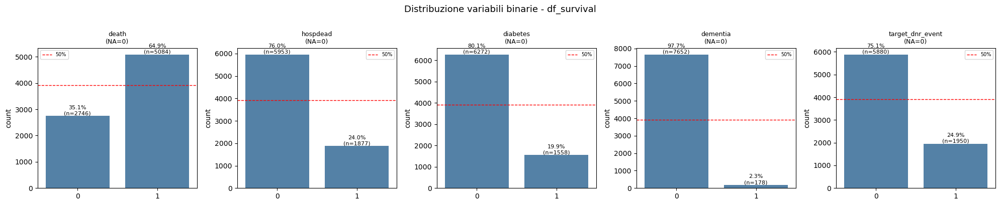

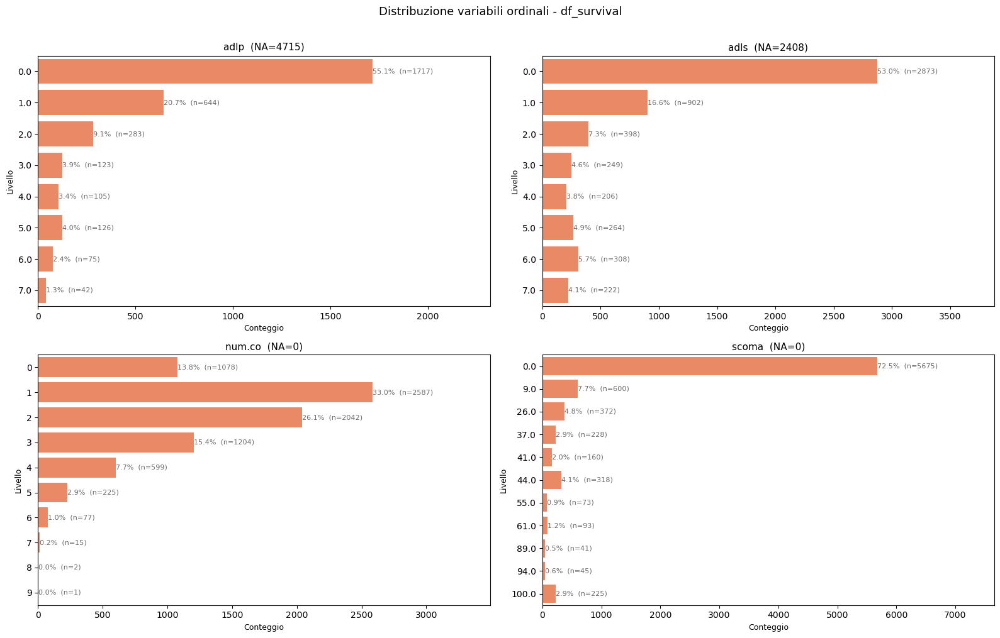

In [54]:
#Per le binarie e ordinali intere il grafico giusto è il countplot (frequenza di ogni categoria)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import math

binary_cols = [
    'death', 'hospdead', 'diabetes', 'dementia', 'target_dnr_event'
]

ordinal_cols = ['adlp', 'adls', 'num.co', 'scoma']

# --- BINARIE ---
if binary_cols:
    n_cols = 5
    n_rows = math.ceil(len(binary_cols) / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, n_rows * 4))
    axes = np.atleast_1d(axes).flatten()

    for i, col in enumerate(binary_cols):
        data = df_survival[col].dropna().astype(str)
        sns.countplot(x=data, ax=axes[i], color='steelblue', order=sorted(data.unique()))

        # Linea tratteggiata al 50% per evidenziare sbilanciamento
        total = len(data)
        axes[i].axhline(y=total * 0.5, color='red', linestyle='--', linewidth=1, label='50%')
        axes[i].legend(fontsize=7)

        na = df_survival[col].isna().sum()
        axes[i].set_title(f'{col}\n(NA={na})', fontsize=9)
        axes[i].set_xlabel('')

        for p in axes[i].patches:
            count = int(p.get_height())
            pct = f'{100 * count / total:.1f}%\n(n={count})'
            axes[i].annotate(pct, (p.get_x() + p.get_width() / 2, p.get_height()),
                             ha='center', va='bottom', fontsize=8)

    for j in range(len(binary_cols), len(axes)):
        axes[j].set_visible(False)

    plt.suptitle('Distribuzione variabili binarie - df_survival', fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()

# --- ORDINALI: barplot orizzontale ---
if ordinal_cols:
    n_cols = 2
    n_rows = math.ceil(len(ordinal_cols) / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(16, n_rows * 5))
    axes = np.atleast_1d(axes).flatten()

    for i, col in enumerate(ordinal_cols):
        data = df_survival[col].dropna()
        order = sorted(data.unique())

        sns.countplot(y=data.astype(str), ax=axes[i],
                      order=[str(o) for o in order], color='coral')

        na = df_survival[col].isna().sum()
        total = len(data)
        axes[i].set_title(f'{col}  (NA={na})', fontsize=11)
        axes[i].set_ylabel('Livello', fontsize=9)
        axes[i].set_xlabel('Conteggio', fontsize=9)

        # Percentuale a destra di ogni barra
        for p in axes[i].patches:
            count = int(p.get_width())
            pct = f'{100 * count / total:.1f}%  (n={count})'
            axes[i].annotate(pct,
                             (p.get_width(), p.get_y() + p.get_height() / 2),
                             ha='left', va='center', fontsize=8, color='dimgray')

        # Margine a destra per le etichette
        axes[i].set_xlim(0, data.value_counts().max() * 1.35)

    for j in range(len(ordinal_cols), len(axes)):
        axes[j].set_visible(False)

    plt.suptitle('Distribuzione variabili ordinali - df_survival', fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()


Visualizzazione delle variabili Numeriche Continue:

NOTA: 'dnrday' esclusa — contiene -1 per pazienti senza DNR. Analizzala separatamente.


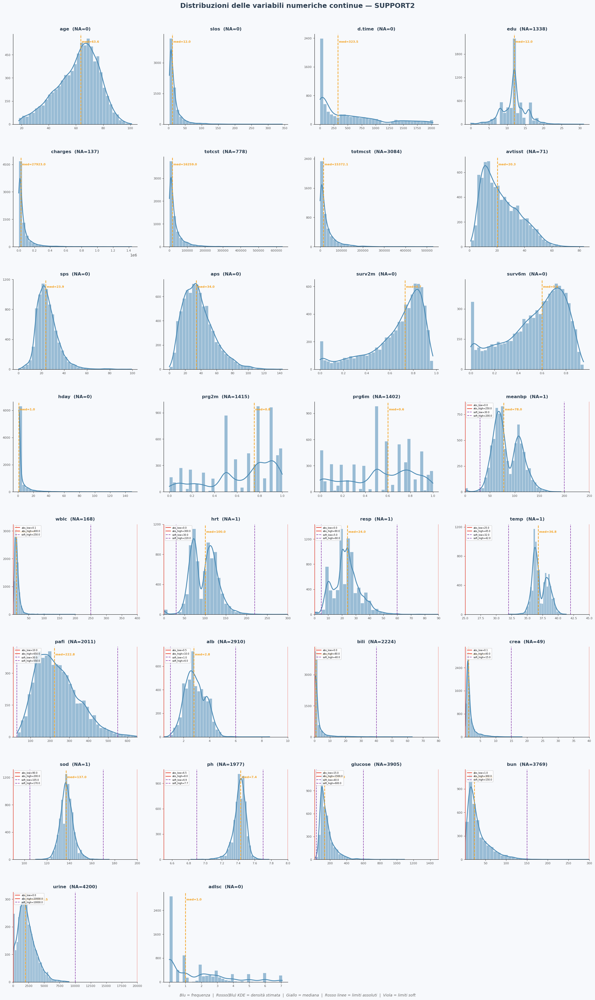

In [55]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import numpy as np

biological_rules = {
    "ph":      {"absolute_low": 6.5,  "absolute_high": 8.0,   "soft_low": 6.90,  "soft_high": 7.70},
    "glucose": {"absolute_low": 15.0, "absolute_high": 1500.0,"soft_low": 40.0,  "soft_high": 600.0},
    "crea":    {"absolute_low": 0.1,  "absolute_high": 40.0,  "soft_low": None,  "soft_high": 15.0},
    "bili":    {"absolute_low": 0.0,  "absolute_high": 80.0,  "soft_low": None,  "soft_high": 40.0},
    "bun":     {"absolute_low": 1.0,  "absolute_high": 300.0, "soft_low": None,  "soft_high": 150.0},
    "wblc":    {"absolute_low": 0.1,  "absolute_high": 400.0, "soft_low": None,  "soft_high": 250.0},
    "hrt":     {"absolute_low": 0.0,  "absolute_high": 300.0, "soft_low": 30.0,  "soft_high": 220.0},
    "temp":    {"absolute_low": 25.0, "absolute_high": 45.0,  "soft_low": 32.0,  "soft_high": 42.0},
    "resp":    {"absolute_low": 0.0,  "absolute_high": 90.0,  "soft_low": 5.0,   "soft_high": 60.0},
    "meanbp":  {"absolute_low": 0.0,  "absolute_high": 250.0, "soft_low": 30.0,  "soft_high": 200.0},
    "alb":     {"absolute_low": 0.5,  "absolute_high": 10.0,  "soft_low": 1.0,   "soft_high": 6.0},
    "pafi":    {"absolute_low": 10.0, "absolute_high": 650.0, "soft_low": 30.0,  "soft_high": 550.0},
    "sod":     {"absolute_low": 90.0, "absolute_high": 200.0, "soft_low": 105.0, "soft_high": 170.0},
    "urine":   {"absolute_low": 0.0,  "absolute_high": 20000.0,"soft_low": None, "soft_high": 10000.0}
}

plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.spines.top': False,
    'axes.spines.right': False,
})

# MIGLIORAMENTO 1: rimossa la riga commentata con il vecchio cols_exclude —
# lasciare codice commentato crea confusione su quale sia la lista attiva
cols_exclude = ['sex', 'dzgroup', 'dzclass', 'income', 'race', 'ca', 'dnr', 'sfdm2',
                'death', 'hospdead', 'diabetes', 'dementia', 'target_dnr_event',
                'adlp', 'adls', 'num.co', 'scoma', 'id']

cont_cols = [c for c in df_survival.select_dtypes(include='number').columns
             if c not in cols_exclude]

# CORREZIONE 1: dnrday in SUPPORT2 vale -1 per i pazienti senza ordine DNR —
# crea un picco artificiale a -1 che distorce l'istogramma. Va esclusa o trattata separatamente.
if 'dnrday' in cont_cols:
    cont_cols.remove('dnrday')
    print("NOTA: 'dnrday' esclusa — contiene -1 per pazienti senza DNR. Analizzala separatamente.")

n_cols = 4
n_rows = -(-len(cont_cols) // n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, n_rows * 4.5))
fig.patch.set_facecolor('#F7F9FC')
axes = axes.flatten()

FILL_COLOR = '#4C8BB5'
KDE_COLOR  = '#E05A47'
MED_COLOR  = '#F4A425'
ABS_COLOR  = '#E74C3C'
SOFT_COLOR = '#8E44AD'

for i, col in enumerate(cont_cols):
    ax = axes[i]
    ax.set_facecolor('#F7F9FC')
    data = df_survival[col].dropna()
    na   = df_survival[col].isna().sum()

    if col in biological_rules:
        rules     = biological_rules[col]
        abs_low   = rules['absolute_low']
        abs_high  = rules['absolute_high']
        soft_low  = rules['soft_low']
        soft_high = rules['soft_high']
        if abs_low  is not None: data = data[data >= abs_low]
        if abs_high is not None: data = data[data <= abs_high]
    else:
        abs_low = abs_high = soft_low = soft_high = None

    median_val = data.median()

    sns.histplot(data, ax=ax, kde=True, bins=35,
                 color=FILL_COLOR, alpha=0.55,
                 edgecolor='white', linewidth=0.5,
                 line_kws={'linewidth': 2.2, 'color': KDE_COLOR})

    x_lo = abs_low  if abs_low  is not None else ax.get_xlim()[0]
    x_hi = abs_high if abs_high is not None else ax.get_xlim()[1]
    ax.set_xlim(x_lo, x_hi)

    # Linea mediana
    ax.axvline(median_val, color=MED_COLOR, linestyle='--', linewidth=1.8, zorder=5)

    # CORREZIONE 2: ax.get_ylim()[1] * 0.92 usa coordinate dati — se il plot
    # viene ridimensionato da tight_layout il testo può uscire dall'area.
    # ax.transAxes usa coordinate relative (0-1) indipendenti dal ridimensionamento.
    ax.text(median_val, 0.93,
            f' med={median_val:.1f}',
            transform=ax.get_xaxis_transform(),  # x in dati, y in assi (0-1)
            color=MED_COLOR, fontsize=8, fontweight='bold', va='top')

    # Limiti assoluti
    if abs_low  is not None:
        ax.axvline(abs_low,  color=ABS_COLOR, linewidth=1.8, linestyle='-',
                   label=f'abs_low={abs_low}', zorder=3)
    if abs_high is not None:
        ax.axvline(abs_high, color=ABS_COLOR, linewidth=1.8, linestyle='-',
                   label=f'abs_high={abs_high}', zorder=3)

    # Limiti soft
    if soft_low  is not None:
        ax.axvline(soft_low,  color=SOFT_COLOR, linewidth=1.4, linestyle='--',
                   label=f'soft_low={soft_low}', zorder=4)
    if soft_high is not None:
        ax.axvline(soft_high, color=SOFT_COLOR, linewidth=1.4, linestyle='--',
                   label=f'soft_high={soft_high}', zorder=4)

    if any(v is not None for v in [abs_low, abs_high, soft_low, soft_high]):
        # CORREZIONE 3: la legenda in 'upper right' collideva con il testo della
        # mediana quando questa è spostata verso destra. 'upper left' evita la sovrapposizione.
        ax.legend(fontsize=6, loc='upper left')

    # MIGLIORAMENTO 2: NA count nel titolo — coerente con i grafici precedenti
    ax.set_title(f'{col}  (NA={na})', fontsize=12, fontweight='bold',
                 color='#2C3E50', pad=10)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(labelsize=8, colors='#555555')
    ax.yaxis.set_major_locator(ticker.MaxNLocator(4))

for j in range(len(cont_cols), len(axes)):
    axes[j].set_visible(False)

fig.suptitle('Distribuzioni delle variabili numeriche continue \u2014 SUPPORT2',
             fontsize=18, fontweight='bold', color='#2C3E50', y=1.01)

fig.text(0.5, -0.005,
         'Blu = frequenza  |  Rosso(Blu) KDE = densità stimata  |  Giallo = mediana  |  Rosso linee = limiti assoluti  |  Viola = limiti soft',
         ha='center', fontsize=10, color='#666666', style='italic')

plt.tight_layout(h_pad=4, w_pad=3)
plt.show()


In [56]:
import pandas as pd

# Seleziona solo colonne numeriche
df_num = df_survival.select_dtypes(include="number")

# Statistiche descrittive complete
stats = df_num.describe().T

# Aggiungi skewness e kurtosis
stats["skewness"]        = df_num.skew()
stats["kurtosis"]        = df_num.kurt() + 3  # kurtosis di Pearson (normale = 3)
stats["excess_kurtosis"] = df_num.kurt()       # kurtosis di Fisher  (normale = 0)
stats["missing"]         = df_num.isnull().sum()
stats["missing_%"]       = (df_num.isnull().sum() / len(df_num) * 100).round(2)

print(stats.to_string())


                   count          mean            std          min           25%           50%           75%           max  skewness    kurtosis  excess_kurtosis  missing  missing_%
id                7830.0   4481.229630    2601.583186     1.000000   2225.500000   4478.000000   6694.750000  9.105000e+03  0.008269    1.833594        -1.166406        0       0.00
age               7830.0     61.224238      15.430373    18.041990     51.188980     63.591980     72.355212  1.008490e+02 -0.482236    2.773524        -0.226476        0       0.00
death             7830.0      0.649298       0.477220     0.000000      0.000000      1.000000      1.000000  1.000000e+00 -0.625856    1.391285        -1.608715        0       0.00
hospdead          7830.0      0.239719       0.426939     0.000000      0.000000      0.000000      0.000000  1.000000e+00  1.219600    2.487292        -0.512708        0       0.00
slos              7830.0     18.932184      22.978637     3.000000      7.000000     12.00

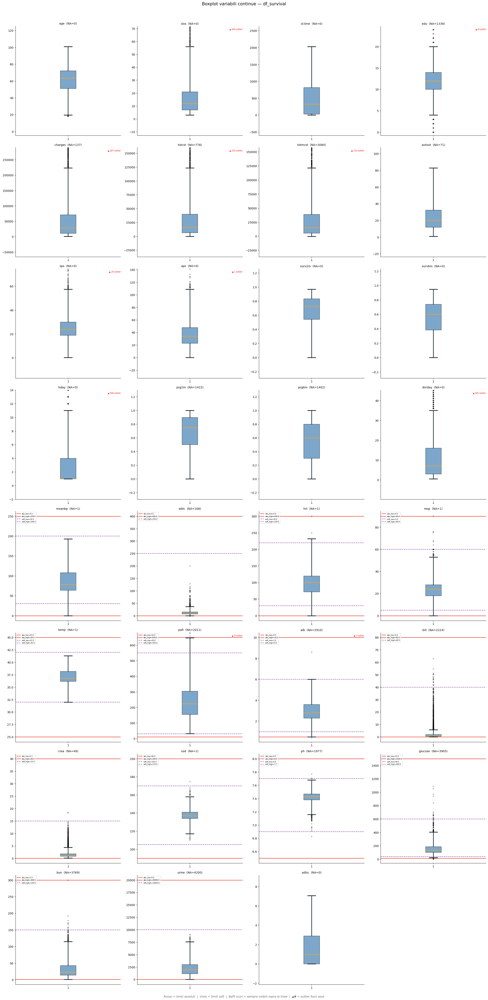

In [57]:
import matplotlib.pyplot as plt
import math
import numpy as np

cols_exclude = ['sex', 'dzgroup', 'dzclass', 'income', 'race', 'ca', 'dnr', 'sfdm2',
                'death', 'hospdead', 'diabetes', 'dementia', 'target_dnr_event',
                'adlp', 'adls', 'num.co', 'scoma', 'id']

biological_rules = {
    "ph":      {"absolute_low": 6.5,  "absolute_high": 8.0,   "soft_low": 6.90,  "soft_high": 7.70},
    "glucose": {"absolute_low": 15.0, "absolute_high": 1500.0,"soft_low": 40.0,  "soft_high": 600.0},
    "crea":    {"absolute_low": 0.1,  "absolute_high": 40.0,  "soft_low": None,  "soft_high": 15.0},
    "bili":    {"absolute_low": 0.0,  "absolute_high": 80.0,  "soft_low": None,  "soft_high": 40.0},
    "bun":     {"absolute_low": 1.0,  "absolute_high": 300.0, "soft_low": None,  "soft_high": 150.0},
    "wblc":    {"absolute_low": 0.1,  "absolute_high": 400.0, "soft_low": None,  "soft_high": 250.0},
    "hrt":     {"absolute_low": 0.0,  "absolute_high": 300.0, "soft_low": 30.0,  "soft_high": 220.0},
    "temp":    {"absolute_low": 25.0, "absolute_high": 45.0,  "soft_low": 32.0,  "soft_high": 42.0},
    "resp":    {"absolute_low": 0.0,  "absolute_high": 90.0,  "soft_low": 5.0,   "soft_high": 60.0},
    "meanbp":  {"absolute_low": 0.0,  "absolute_high": 250.0, "soft_low": 30.0,  "soft_high": 200.0},
    "alb":     {"absolute_low": 0.5,  "absolute_high": 10.0,  "soft_low": 1.0,   "soft_high": 6.0},
    "pafi":    {"absolute_low": 10.0, "absolute_high": 650.0, "soft_low": 30.0,  "soft_high": 550.0},
    "sod":     {"absolute_low": 90.0, "absolute_high": 200.0, "soft_low": 105.0, "soft_high": 170.0},
    "urine":   {"absolute_low": 0.0,  "absolute_high": 20000.0,"soft_low": None, "soft_high": 10000.0}
}

non_physiological = {
    'age':    {'lower_floor': 0, 'whis': 1.5},
    'edu':    {'lower_floor': 0, 'whis': 1.5},
    'dnrday': {'lower_floor': 0, 'whis': 1.5},
}

ABS_COLOR  = '#E74C3C'
SOFT_COLOR = '#8E44AD'
WHIS_COLOR = '#1C2833'

# CORREZIONE 1: rimosso il filtro nunique() > 10 — è ridondante (cols_exclude
# gestisce già tutte le ordinali/binarie) e potrebbe escludere per sbaglio una
# variabile continua con pochi valori unici dovuti a molti NA
continuous_cols = [
    col for col in df_survival.select_dtypes(include='number').columns
    if col not in cols_exclude
]

n_cols = 4
n_rows = math.ceil(len(continuous_cols) / n_cols)

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(24, n_rows * 6))
axes = np.atleast_1d(axes).flatten()

for i, col in enumerate(continuous_cols):
    data = df_survival[col].dropna()
    na   = df_survival[col].isna().sum()
    ax   = axes[i]

    q1  = data.quantile(0.25)
    q3  = data.quantile(0.75)
    iqr = q3 - q1

    if col in biological_rules:
        rules     = biological_rules[col]
        abs_low   = rules['absolute_low']
        abs_high  = rules['absolute_high']
        soft_low  = rules['soft_low']
        soft_high = rules['soft_high']
        lower_limit = max(q1 - 2.5 * iqr, abs_low)
        upper_limit = min(q3 + 2.5 * iqr, abs_high)

    elif col in non_physiological:
        cond = non_physiological[col]
        abs_low = abs_high = soft_low = soft_high = None
        lower_limit = max(q1 - cond['whis'] * iqr, cond['lower_floor'])
        upper_limit = q3 + cond['whis'] * iqr

    else:
        abs_low = abs_high = soft_low = soft_high = None
        lower_limit = q1 - 2.5 * iqr
        upper_limit = q3 + 2.5 * iqr

    in_range      = data[(data >= lower_limit) & (data <= upper_limit)]
    lower_whisker = in_range.min() if not in_range.empty else lower_limit
    upper_whisker = in_range.max() if not in_range.empty else upper_limit
    outliers      = data[(data < lower_whisker) | (data > upper_whisker)]

    # CORREZIONE 2: rimossa la chiave 'mean' dal dict — bxp() la ignora
    # a meno che non si passi showmeans=True. Era codice morto.
    stats = [{
        'med':    data.median(),
        'q1':     q1,
        'q3':     q3,
        'whislo': lower_whisker,
        'whishi': upper_whisker,
        'fliers': outliers.tolist(),
    }]

    if abs_low is not None:
        ax.axhline(abs_low,  color=ABS_COLOR,  linewidth=1.8, linestyle='-',
                   label=f'abs_low={abs_low}',   zorder=2)
    if abs_high is not None:
        ax.axhline(abs_high, color=ABS_COLOR,  linewidth=1.8, linestyle='-',
                   label=f'abs_high={abs_high}',  zorder=2)
    if soft_low is not None:
        ax.axhline(soft_low,  color=SOFT_COLOR, linewidth=1.4, linestyle='--',
                   label=f'soft_low={soft_low}',  zorder=2)
    if soft_high is not None:
        ax.axhline(soft_high, color=SOFT_COLOR, linewidth=1.4, linestyle='--',
                   label=f'soft_high={soft_high}', zorder=2)

    ax.bxp(
        stats,
        showfliers=True,
        patch_artist=True,
        boxprops=dict(facecolor='steelblue', alpha=0.7, zorder=3),
        medianprops=dict(color='#F4A425', linewidth=1.8, zorder=5),
        whiskerprops=dict(color=WHIS_COLOR, linewidth=2.2, zorder=6),
        capprops=dict(color=WHIS_COLOR,     linewidth=2.5, zorder=6),
        flierprops=dict(marker='o', color='red', markersize=3, alpha=0.5, zorder=5),
    )

    # CORREZIONE 3: senza set_ylim, variabili molto skewed (charges, totcst, urine)
    # hanno outlier estremi che schiacciano il box rendendolo invisibile.
    # Per le fisiologiche: clipping al range biologico (valori fuori sono già
    # implausibili). Per le altre: clipping ai baffi + margine del 30%.
    if col in biological_rules:
        margin = (abs_high - abs_low) * 0.05
        ax.set_ylim(abs_low  - margin, abs_high + margin)
    else:
        margin = (upper_whisker - lower_whisker) * 0.3
        ax.set_ylim(lower_whisker - margin, upper_whisker + margin)

    # Annotazione outlier fuori dall'asse (non più visibili dopo set_ylim)
    n_out_above = int((data > ax.get_ylim()[1]).sum())
    n_out_below = int((data < ax.get_ylim()[0]).sum())
    if n_out_above > 0:
        ax.text(1.0, 0.98, f'▲ {n_out_above} outlier',
                transform=ax.transAxes, ha='right', va='top',
                fontsize=7, color='red')
    if n_out_below > 0:
        ax.text(1.0, 0.02, f'▼ {n_out_below} outlier',
                transform=ax.transAxes, ha='right', va='bottom',
                fontsize=7, color='red')

    if any(v is not None for v in [abs_low, abs_high, soft_low, soft_high]):
        ax.legend(fontsize=6, loc='upper left')

    # CORREZIONE 4: il titolo diceva 'df_final' ma il dataframe è 'df_survival'
    # Aggiunto anche NA count per coerenza con i grafici precedenti
    ax.set_title(f'{col}  (NA={na})', fontsize=10)
    ax.set_xlabel('')

for j in range(len(continuous_cols), len(axes)):
    axes[j].set_visible(False)

# CORREZIONE 4 (continua): corretto nome dataframe nel suptitle
plt.suptitle('Boxplot variabili continue — df_survival', fontsize=15, y=1.01)
fig.text(0.5, -0.005,
         'Rosso = limiti assoluti  |  Viola = limiti soft  |  Baffi scuri = sempre visibili sopra le linee  |  ▲▼ = outlier fuori asse',
         ha='center', fontsize=10, color='#666666', style='italic')
plt.tight_layout()
plt.show()


Da questi grafici di boxplot notiamo che ci sono outliers da gestire, in particolare presteremo attenzione agli outliers delle variabili fisiologiche, poichè potrebbe includere errori più difficili da gestire

# Gestione outliers

In [58]:
missing_raw = df_main.isnull().sum()
missing_survival = df_survival.isnull().sum()

# Filtra solo le colonne con missing values > 0 per entrambi i dataframes
missing_raw_filtered = missing_raw[missing_raw > 0].rename('Missing in RAW (df_main)')
missing_survival_filtered = missing_survival[missing_survival > 0].rename('Missing in Processed (df_survival)')

# Concatena le due Serie in un DataFrame per una visualizzazione affiancata
missing_comparison = pd.concat([missing_raw_filtered, missing_survival_filtered], axis=1).fillna(0).astype(int)

print("Comparazione dei valori mancanti per colonna:")
print(missing_comparison)

Comparazione dei valori mancanti per colonna:
         Missing in RAW (df_main)  Missing in Processed (df_survival)
edu                          1634                                1338
income                       2982                                2518
scoma                           1                                   0
charges                       172                                 137
totcst                        888                                 778
totmcst                      3475                                3084
avtisst                        82                                  71
race                           42                                  33
sps                             1                                   0
aps                             1                                   0
surv2m                          1                                   0
surv6m                          1                                   0
prg2m                        1649           

In [59]:
# ----------------------------------------------------
# PROVA DEL NOVE: VERIFICA TOTALE DEL DATASET
# ----------------------------------------------------
tot_nan_residual = df_survival.isnull().sum().sum()
print(
    f"Valori mancanti rimasti in TUTTO il dataframe: {tot_nan_residual}"
)

Valori mancanti rimasti in TUTTO il dataframe: 40417


In [60]:
# ═══════════════════════════════════════════════════════════════════════════════
# CONFIGURAZIONE INIZIALE
# ═══════════════════════════════════════════════════════════════════════════════
# Assicurati di avere il dataset originale caricato nella variabile 'df_main'
df_cleaned = df_survival.copy()

# 1. Zeri Strumentali Puri (Variabili chimico-biologiche: lo zero è SEMPRE un errore di macchina)
zero_strumentali_puri = ["alb", "bun", "crea", "wblc", "temp"]

# 2. Zeri Vitali Terminali (Parametri di funzionalità cardiopolmonare: lo zero indica arresto)
zero_vitali_terminali = ["meanbp", "hrt", "resp", "pafi"]

# STADIO 1b: Variabili per cui calcoleremo il limite inferiore statistico (Q1 - 3*IQR) per patologia
low_stat_vars = ["alb", "bili", "bun", "crea", "pafi", "urine", "wblc"]

# STADIO 2: Mappatura della gravità clinica attesa per le 8 categorie esatte di 'dzgroup' in SUPPORT2
dzgroup_expected = {
    "ARF/MOSF w/Sepsis":  {"high": ["bili", "crea", "bun", "wblc", "glucose", "hrt", "temp", "resp"],
                           "low":  ["meanbp", "ph", "alb", "pafi", "urine"]},
    "MOSF w/Malignancy":  {"high": ["bili", "crea", "bun", "wblc", "glucose"],
                           "low":  ["meanbp", "ph", "alb", "pafi"]},
    "Cirrhosis":          {"high": ["bili", "bun", "crea"], # Aggiunta creatinina/BUN per Sindrome Epatorenale
                           "low":  ["alb", "sod", "meanbp"]},
    "CHF":                {"high": ["bun", "crea", "resp"],
                           "low":  ["meanbp", "sod", "pafi"]},
    "COPD":               {"high": ["bun", "resp"],
                           "low":  ["pafi", "ph"]}, # Il pH basso (acidosi respiratoria) è il marker di riacutizzazione
    "Coma":               {"high": ["glucose", "bun", "bili"], # Gestito sia l'asse iper- che ipo-glicemico
                           "low":  ["ph", "meanbp", "glucose", "sod"]},
    "Lung Cancer":        {"high": ["bili", "crea", "bun"],
                           "low":  ["alb", "pafi"]},
    "Colon Cancer":       {"high": ["bili", "bun"],
                           "low":  ["alb"]},
}

# ═══════════════════════════════════════════════════════════════════════════════
# REGOLE BIOLOGICHE: Limiti Assoluti (Errore) vs Soft (Clinica estrema / Capping)
# Soglie validate su scale ICU (APACHE III, SOFA, limiti fisiologici umani)
# ═══════════════════════════════════════════════════════════════════════════════
biological_rules = {
    "ph":      {"absolute_low": 6.5,  "absolute_high": 8.0,   "soft_low": 6.90,  "soft_high": 7.70},
    "glucose": {"absolute_low": 15.0, "absolute_high": 1500.0,"soft_low": 40.0,  "soft_high": 600.0},
    "crea":    {"absolute_low": 0.1,  "absolute_high": 40.0,  "soft_low": None,  "soft_high": 15.0},
    "bili":    {"absolute_low": 0.0,  "absolute_high": 80.0,  "soft_low": None,  "soft_high": 40.0},
    "bun":     {"absolute_low": 1.0,  "absolute_high": 300.0, "soft_low": None,  "soft_high": 150.0},
    "wblc":    {"absolute_low": 0.1,  "absolute_high": 400.0, "soft_low": None,  "soft_high": 250.0},
    "hrt":     {"absolute_low": 0.0, "absolute_high": 300.0, "soft_low": 30.0,  "soft_high": 220.0},
    "temp":    {"absolute_low": 25.0, "absolute_high": 45.0,  "soft_low": 32.0,  "soft_high": 42.0},
    "resp":    {"absolute_low": 0.0,  "absolute_high": 90.0,  "soft_low": 5.0,   "soft_high": 60.0},
    "meanbp":  {"absolute_low": 0.0, "absolute_high": 250.0, "soft_low": 30.0,  "soft_high": 200.0},
    "alb":     {"absolute_low": 0.5,  "absolute_high": 10.0,  "soft_low": 1.0,   "soft_high": 6.0},
    "pafi":    {"absolute_low": 10.0, "absolute_high": 650.0,"soft_low": 30.0,  "soft_high": 550.0},
    "sod":     {"absolute_low": 90.0, "absolute_high": 200.0, "soft_low": 105.0, "soft_high": 170.0},
    "urine":   {"absolute_low": 0.0,  "absolute_high": 20000.0,"soft_low": None, "soft_high": 10000.0}
}

# ═══════════════════════════════════════════════════════════════════════════════
# FUNZIONE DI COERENZA CLINICA (Versione Ottimizzata)
# ═══════════════════════════════════════════════════════════════════════════════
def score_coherence(row, var, direction):
    """
    Calcola il punteggio clinico (0-3) per validare un outlier.
    Ottimizzato con criteri di coerenza fisiopatologica e selettività metabolica.
    """
    score = 0
    dz = row.get("dzgroup")

    # -------------------------------------------------------------------------
    # CRITERIO 1: La malattia principale o lo shock sistemico giustificano l'outlier?
    # -------------------------------------------------------------------------
    # Segni universali di collasso emodinamico/respiratorio in ICU
    universal_shock_vars = {
        "high": ["hrt", "resp", "wblc"],
        "low":  ["meanbp", "pafi"]
    }

    if dz in dzgroup_expected:
        # Se la variabile è attesa per la specifica patologia d'ingresso
        if var in dzgroup_expected[dz].get(direction, []):
            score += 1
        # Oppure se è una risposta universale allo shock sistemico
        elif var in universal_shock_vars.get(direction, []):
            score += 1

    # -------------------------------------------------------------------------
    # CRITERIO 2: Compromissione neurologica selettiva (Coerenza Metabolica)
    # -------------------------------------------------------------------------
    scoma_val = row.get("scoma")
    neuro_active_vars = ["glucose", "sod", "ph", "meanbp", "pafi"]

    if pd.notna(scoma_val):
        # Se il paziente ha un'alterazione dello stato di coscienza (scoma >= 50)
        if scoma_val >= 50:
            if var in neuro_active_vars:
                score += 1
            # Il coma profondissimo convalida anomalie estreme dei centri di controllo bulbari
            elif var in ["resp", "temp"] and scoma_val >= 80:
                score += 1
    else:
        # PARACADUTE CLINICO: Nel dataset SUPPORT2 molti dati scoma sono mancanti.
        # Se mancano, usiamo un collasso pressorio estremo o una tachicardia fulminante
        # come prova proxy che il paziente è neurologicamente e clinicamente instabile.
        mbp_val = row.get("meanbp")
        hrt_val = row.get("hrt")
        if (pd.notna(mbp_val) and mbp_val < 45) or (pd.notna(hrt_val) and hrt_val > 140):
            if var in neuro_active_vars:
                score += 1

    return score

# ═══════════════════════════════════════════════════════════════════════════════
# ESECUZIONE DELLA PIPELINE DI PREPROCESSING
# ═══════════════════════════════════════════════════════════════════════════════

print("AVVIO PREPROCESSING BIOLOGICO-STATISTICO...\n" + "═" * 70)

# -------------------------------------------------------------------------------
# STADIO 0: Rimozione Zeri Impossibili
# -------------------------------------------------------------------------------
# --- ESECUZIONE STADIO 0a: Cancellazione immediata errori di macchina ---
for var in zero_strumentali_puri:
    if var in df_cleaned.columns:
        n_zeros = (df_cleaned[var] == 0).sum()
        if n_zeros > 0:
            df_cleaned.loc[df_cleaned[var] == 0, var] = np.nan
            print(
                f"   [Stadio 0a] {var:7s} : {n_zeros} zeri strumentali puri convertiti in NaN"
            )

# --- ESECUZIONE STADIO 0b: Sospensione e tracciamento zeri vitali ---
# Non li cancelliamo: li lasciamo intatti affinché gli stadi successivi li interroghino
# tramite la funzione score_coerenza().
for var in zero_vitali_terminali:
    if var in df_cleaned.columns:
        n_zeros = (df_cleaned[var] == 0).sum()
        if n_zeros > 0:
            print(
                f"   [Stadio 0b] {var:7s} : {n_zeros} casi di arresto/collasso a ZERO congelati per verifica clinica"
            )

print("-" * 70)

# -------------------------------------------------------------------------------
# STADIO 1b: Calcolo Soglie Statistiche Armonizzate (Fix Medico Applicato)
# Calcola Q1 - 3*IQR assicurandosi che la soglia sia biologicamente sensata
# -------------------------------------------------------------------------------
stat_low_thresholds = {}
stat_high_thresholds = {}

for var in low_stat_vars:
    if var in df_cleaned.columns:
        stat_low_thresholds[var] = {}
        stat_high_thresholds[var] = {}

        # Recuperiamo i limite assoluti inferiori e superiori dalle nostre regole biologiche (default 0.0)
        bio_absolute_low = biological_rules.get(var, {}).get("absolute_low", 0.0)
        bio_absolute_high = biological_rules.get(var, {}).get("absolute_high", float('inf'))

        for group in df_cleaned["dzgroup"].dropna().unique():
            subset = df_cleaned[df_cleaned["dzgroup"] == group][var].dropna()

            if len(subset) >= 10:
                Q1, Q3 = subset.quantile(0.25), subset.quantile(0.75)
                iqr = Q3 - Q1

                # -----------------------------------------------------------------
                # GESTIONE LOWER BOUND (Soglia Inferiore)
                # -----------------------------------------------------------------
                calculated_low = Q1 - 3 * iqr

                # CORREZIONE MEDICA: Se la soglia statistica cade sotto il minimo biologico o lo 0,
                # la clipiamo al valore minimo reale patologico. Significa che in questo
                # gruppo non possono esserci outlier inferiori oltre ai limiti biologici già noti.
                if calculated_low < bio_absolute_low:
                    stat_low_thresholds[var][group] = bio_absolute_low
                else:
                    stat_low_thresholds[var][group] = calculated_low

                # -----------------------------------------------------------------
                # GESTIONE UPPER BOUND (Soglia Superiore) - LA PARTE MANCANTE
                # -----------------------------------------------------------------
                # Upper Bound: Evitiamo che una forte varianza generi soglie superiori incompatibili con la biologia
                calculated_high = Q3 + 3 * iqr
                if calculated_high > bio_absolute_high:
                    stat_high_thresholds[var][group] = bio_absolute_high
                else:
                    stat_high_thresholds[var][group] = calculated_high

print("   [Stadio 1b] Soglie statistiche condizionate calcolate e armonizzate con i limiti ICU.")
print("-" * 70)

# -------------------------------------------------------------------------------
# STADI 1a & 2: LOOP PRINCIPALE DI TRIAGE (Outlier Detection & Capping)
# -------------------------------------------------------------------------------

# Inizializziamo i contatori globali per il report finale di auditing
global_nan, global_capped, global_kept = 0, 0, 0
grey_cases = []  # Ospedalizzerà i record "grigi" (coerenza parziale, score == 1) per tracciabilità

# Iteriamo su ogni variabile configurata nelle regole biologiche
for var, rules in biological_rules.items():
    if var not in df_cleaned.columns:
        continue

    # Contatori locali per la singola variabile (servono per i log di riga)
    var_nan, var_capped, var_kept = 0, 0, 0

    # Iteriamo riga per riga sul DataFrame
    for idx, row in df_cleaned.iterrows():
        val = row[var]
        if pd.isna(val): # Salta i dati già mancanti in partenza
            continue

        # Verifica se il record corrente è uno zero vitale congelato allo Stadio 0b
        is_arresto_zero = (var in zero_vitali_terminali) and (val <= rules["absolute_low"])

        # ─── AZIONE 1: CONTROLLO DEI LIMITI BIOLOGICI ASSOLUTI ───
        is_abs_high = (rules["absolute_high"] is not None and val > rules["absolute_high"])
        is_abs_low  = (rules["absolute_low"] is not None and val < rules["absolute_low"])

        # 🚨 INTERCETTATORE CLINICO: Se il dato è uno zero vitale, disattiviamo il drop automatico
        # inferiore e forziamo il sistema a mandarlo al controllo di coerenza soft.
        if is_arresto_zero:
            is_abs_low = False
            is_soft_low = True
            is_soft_high = False
        else:
            # Recuperiamo le soglie statistiche locali per questo paziente
            group = row.get("dzgroup")
            stat_low = stat_low_thresholds.get(var, {}).get(group, None)
            stat_high = stat_high_thresholds.get(var, {}).get(group, None)

            # L'alert scatta se viene superata la soglia clinica (soft) o quella statistica (stat)
            is_soft_low = (rules["soft_low"] is not None and val < rules["soft_low"]) or \
                          (stat_low is not None and val < stat_low)
            is_soft_high = (rules["soft_high"] is not None and val > rules["soft_high"]) or \
                           (stat_high is not None and val > stat_high)


        # AZIONE IMMEDIATA: Se supera i limiti della biologia assoluti (es. pH a 12), è un errore certo -> Diventa NaN
        if is_abs_high or is_abs_low:
            df_cleaned.at[idx, var] = np.nan
            var_nan += 1
            global_nan += 1
            continue # Interrompe il controllo per questa cella e passa alla successiva

        # AZIONE DI TRIAGE: Se entra nell'area degli "outlier soft", attiviamo lo scoring clinico
        if is_soft_high or is_soft_low:
            direction = "high" if is_soft_high else "low"
            score = score_coherence(row, var, direction)

            # ════════════════════════════════════════════════════════════════════
            # STRADA A: OUTLIER CLINICAMENTE GIUSTIFICATO (SCORE >= 1)
            # Il dato, pur essendo estremo, è supportato dalla diagnosi del paziente.
            # ════════════════════════════════════════════════════════════════════

            if score >= 1:
                # Se lo score è esattamente 1, lo tracciamo come caso "grigio" (coerenza parziale)
                if score == 1:
                    grey_cases.append({"idx": idx, "var": var, "val": val})

                # Se è uno zero giustificato (o un valore reale estremo) lo proteggiamo e basta
                var_kept += 1
                global_kept += 1

            # ════════════════════════════════════════════════════════════════════
            # STRADA B: OUTLIER NON GIUSTIFICATO (RUMORE O ERRORE, SCORE == 0)
            # Il dato è anomalo e la cartella clinica non lo supporta.
            # ════════════════════════════════════════════════════════════════════
            else:
                if is_arresto_zero:
                    # Finto Arresto: Il paziente sta bene ma lo strumento segna zero.
                    # È un errore del sensore -> Convertiamo rigorosamente in NaN per il MICE.
                    df_cleaned.at[idx, var] = np.nan
                    var_nan += 1
                    global_nan += 1
                    continue # FIX CRITICO: blocca il flusso ed evita che il NaN venga sovrascritto sotto!
                else:
                    # Rumore di fondo: Applichiamo il Capping Adattivo (Winsorizzazione).
                    var_capped += 1
                    global_capped += 1

                    if direction == "high":
                        # Selezioniamo in modo dinamico la barriera più severa (la più bassa) tra clinica e statistica
                        active_highs = [v for v in [rules["soft_high"], stat_high] if v is not None]
                        if active_highs:
                            df_cleaned.at[idx, var] = min(active_highs)
                        else:
                            df_cleaned.at[idx, var] = np.nan
                    else:
                        # Selezioniamo la barriera più protettiva (la più alta) tra clinica e statistica
                        active_lows = [v for v in [rules["soft_low"], stat_low] if v is not None]
                        if active_lows:
                            df_cleaned.at[idx, var] = max(active_lows)
                        else:
                            df_cleaned.at[idx, var] = np.nan

    # Stampiamo il log riassuntivo per la variabile corrente se ci sono stati interventi
    if (var_nan + var_capped + var_kept) > 0:
        print(f"   {var.upper():7s} -> Eliminati (NaN): {var_nan:<4d} | Cappati/Stabilizzati: {var_capped:<4d} | Protetti Reali: {var_kept:<4d}")

# ═══════════════════════════════════════════════════════════════════════════════
# 4. REPORT CONCLUSIVO DI AUDITING
# ═══════════════════════════════════════════════════════════════════════════════
print("═" * 70)
print(f"RIEPILOGO FINALE PREPROCESSING CLINICO AVANZATO")
print("═" * 70)
print(f" • Errori certi eliminati (diventati NaN)             : {global_nan}")
print(f" • Anomalie isolate o zeri vitali forzati (Capping)   : {global_capped}")
print(f" • Quadri clinici critici reali salvati (Score >= 1)  : {global_kept}\n")
print(f" * Nota di auditing: {len(grey_cases)} record clinici 'grigi' (Score=1) sono stati protetti grazie alla coerenza parziale alla baseline.")
print("Il dataset 'df_cleaned' è validato e pronto per il modello MICE")
print("═" * 70)

AVVIO PREPROCESSING BIOLOGICO-STATISTICO...
══════════════════════════════════════════════════════════════════════
   [Stadio 0a] wblc    : 9 zeri strumentali puri convertiti in NaN
   [Stadio 0b] meanbp  : 37 casi di arresto/collasso a ZERO congelati per verifica clinica
   [Stadio 0b] hrt     : 64 casi di arresto/collasso a ZERO congelati per verifica clinica
   [Stadio 0b] resp    : 48 casi di arresto/collasso a ZERO congelati per verifica clinica
----------------------------------------------------------------------
   [Stadio 1b] Soglie statistiche condizionate calcolate e armonizzate con i limiti ICU.
----------------------------------------------------------------------
   PH      -> Eliminati (NaN): 0    | Cappati/Stabilizzati: 2    | Protetti Reali: 1   
   GLUCOSE -> Eliminati (NaN): 7    | Cappati/Stabilizzati: 12   | Protetti Reali: 12  
   CREA    -> Eliminati (NaN): 1    | Cappati/Stabilizzati: 114  | Protetti Reali: 279 
   BILI    -> Eliminati (NaN): 0    | Cappati/Stab

In [61]:
print(df_cleaned.columns.tolist())

['id', 'age', 'death', 'sex', 'hospdead', 'slos', 'd.time', 'dzgroup', 'dzclass', 'num.co', 'edu', 'income', 'scoma', 'charges', 'totcst', 'totmcst', 'avtisst', 'race', 'sps', 'aps', 'surv2m', 'surv6m', 'hday', 'diabetes', 'dementia', 'ca', 'prg2m', 'prg6m', 'dnr', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp', 'adls', 'sfdm2', 'adlsc', 'target_dnr_event']


In [62]:
#Usa la maschera notna() per applicare la trasformazione solo ai valori non mancanti:

# Applico log a 6 variabili con skewness > 1

# =============================================================================
# 1. PREPARAZIONE DEL DATAFRAME
# =============================================================================

# Lista delle 6 variabili di laboratorio con Skewness > 1 estratte da EDA
cols_to_log = ["bili", "wblc", "glucose", "crea", "bun"]

# =============================================================================
# 2. APPLICAZIONE DELLA TRASFORMAZIONE LOGARITMICA
# =============================================================================

# NOTA: Usiamo 'df_cleaned' (il dataset prima imputatazione fatta dal MICE).
df_source = df_cleaned.copy()

# Usiamo np.log1p che calcola matematicamente ln(x + 1).
# NOTA METODOLOGICA: È fondamentale perché la tua variabile 'urine' ha un valore
# minimo pari a 0.0. Il logaritmo di 0 non esiste (-infinito), mentre log(0 + 1) = 0.
for col in cols_to_log:
    mask = df_source[col].notna()
    df_source.loc[mask, col] = np.log1p(df_source.loc[mask, col])

# =============================================================================
# 4. VERIFICA DEL RISULTATO
# =============================================================================
print("=== SKEWNESS DOPO LA TRASFORMAZIONE ===")
print(df_source[cols_to_log].skew())
print("=" * 50)

# Ora il dataframe 'df_source' ha le 6 variabili perfettamente linearizzate
# ed è pronto per essere passato allo step successivo dello StandardScaler.

=== SKEWNESS DOPO LA TRASFORMAZIONE ===
bili       1.786617
wblc      -0.543104
glucose    0.534329
crea       1.451376
bun        0.031207
dtype: float64


# Imputazione MICE

In [63]:
print(df_main['income'].value_counts())

income
under $11k    2855
$11-$25k      1527
$25-$50k      1057
>$50k          684
Name: count, dtype: int64


In [64]:
from sklearn.experimental import enable_iterative_imputer # Obbligatorio per sbloccare l'IterativeImputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import ExtraTreesRegressor

# ═══════════════════════════════════════════════════════════════════════════════
# PREPARAZIONE DEL DATASET E VARIABILI BINARIE
# ═══════════════════════════════════════════════════════════════════════════════
df_source['sex'] = df_source['sex'].map({'female': 0, 'male': 1})

df_source = df_source.drop(columns=['adlp', 'adls', 'dnr'], errors='ignore')
df_source = df_source.reset_index(drop=True)
print("Variabile 'sex' trasformata in binaria.")

# ═══════════════════════════════════════════════════════════════════════════════
# ONE-HOT ENCODING E GESTIONE BASELINE
# ═══════════════════════════════════════════════════════════════════════════════
colonne_da_trasformare = ['ca', 'race', 'income', 'dzclass', 'dzgroup', 'sfdm2']
colonne_presenti = [col for col in colonne_da_trasformare if col in df_source.columns]

# Generiamo le dummy come FLOAT per permettere l'inserimento dei NaN
df_encoded = pd.get_dummies(
    df_source,
    columns=colonne_presenti,
    drop_first=False,
    dtype=float
)

# -------------------------------------------------------------------------------
# PATCH DI SICUREZZA NAN: Il salvataggio dei valori mancanti categorici
# -------------------------------------------------------------------------------
# Re-iniettiamo i NaN nelle colonne dummy per i pazienti di cui ignoravamo il dato,
# altrimenti il MICE li considererebbe appartenenti alla categoria di baseline.
for col in colonne_presenti:
    is_missing = df_source[col].isnull()
    if is_missing.any():
        # Troviamo tutte le colonne dummy generate per questa specifica categoria
        dummy_cols = [c for c in df_encoded.columns if c.startswith(f"{col}_")]
        # Forziamo a NaN le righe mancanti
        df_encoded.loc[is_missing, dummy_cols] = np.nan

print("\n Encoding completato. Patch per i NaN categorici applicata con successo.")
print(f" -> Variabili prima dell'encoding: {df_source.shape[1]}")
print(f" -> Variabili dopo l'encoding (Matrice MICE): {df_encoded.shape[1]}")

# ═══════════════════════════════════════════════════════════════════════════════
# IMPUTAZIONE MICE NON LINEARE (CON PROTEZIONE DELL'ID)
# ═══════════════════════════════════════════════════════════════════════════════
# Estraiamo l'ID e lo salviamo al sicuro per non sporcare il modello
if 'id' in df_encoded.columns:
    colonna_id = df_encoded['id'].copy()
    df_encoded = df_encoded.drop(columns=['id'])
else:
    colonna_id = None

mice_non_lineare = IterativeImputer(
    estimator=ExtraTreesRegressor(n_estimators=30, max_features=0.4, min_samples_leaf=5, random_state=42, n_jobs=-1),
    max_iter=10,
    imputation_order='ascending',
    random_state=42
)

print("-" * 70)
print("AVVIO ESECUZIONE MICE...")
imputed_array = mice_non_lineare.fit_transform(df_encoded)

# Ricreiamo il dataframe
df_imputed_full = pd.DataFrame(imputed_array, columns=df_encoded.columns, index=df_encoded.index)

# RI-INSERIAMO L'ID IN TESTA AL DATASET IMPUTATO
if colonna_id is not None:
    df_imputed_full.insert(0, 'id', colonna_id)
    print("Colonna 'id' protetta durante il MICE e ri-inserita con successo.")

# Verifica Finale
missing = df_imputed_full.isnull().sum()
print("\nValori mancanti residui post-MICE:")
print(missing[missing > 0] if missing.sum() > 0 else "Nessun valore mancante!")

Variabile 'sex' trasformata in binaria.

 Encoding completato. Patch per i NaN categorici applicata con successo.
 -> Variabili prima dell'encoding: 46
 -> Variabili dopo l'encoding (Matrice MICE): 69
----------------------------------------------------------------------
AVVIO ESECUZIONE MICE...
Colonna 'id' protetta durante il MICE e ri-inserita con successo.

Valori mancanti residui post-MICE:
Nessun valore mancante!


c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\impute\_iterative.py:825: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


<Axes: >

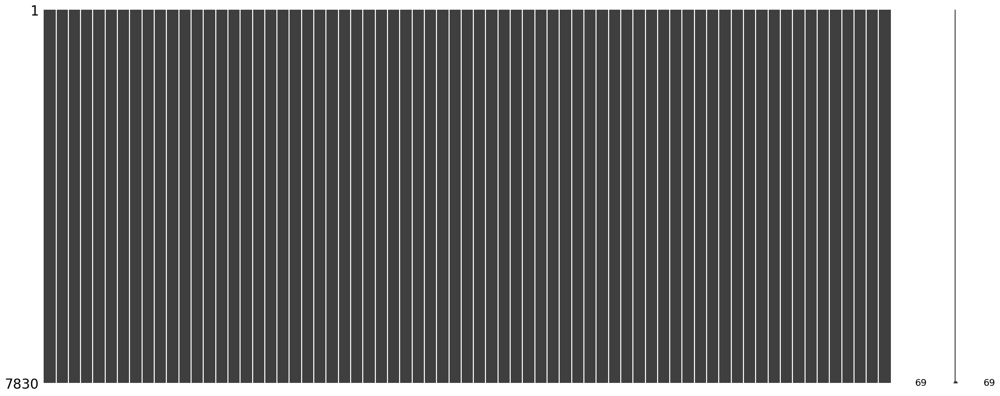

In [65]:
msno.matrix(df_imputed_full)

# Rimozione colonne

In [66]:
print(df_imputed_full.columns.tolist())

['id', 'age', 'death', 'sex', 'hospdead', 'slos', 'd.time', 'num.co', 'edu', 'scoma', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps', 'surv2m', 'surv6m', 'hday', 'diabetes', 'dementia', 'prg2m', 'prg6m', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc', 'target_dnr_event', 'ca_metastatic', 'ca_no', 'ca_yes', 'race_asian', 'race_black', 'race_hispanic', 'race_other', 'race_white', 'income_$11-$25k', 'income_$25-$50k', 'income_>$50k', 'income_under $11k', 'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma', 'dzgroup_ARF/MOSF w/Sepsis', 'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis', 'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer', 'dzgroup_MOSF w/Malig', 'sfdm2_<2 mo. follow-up', 'sfdm2_Coma or Intub', 'sfdm2_SIP>=30', 'sfdm2_adl>=4 (>=5 if sur)', 'sfdm2_no(M2 and SIP pres)']


In [67]:
# Eliminazione di colonne non necessarie all'analisi
columns_to_drop = ['death', 'hospdead', 'slos', 'd.time', 'charges',
                   'totcst', 'totmcst', 'avtisst', 'sps', 'aps',
                   'surv2m', 'surv6m', 'hday', 'prg2m', 'prg6m']
df_imputed_full = df_imputed_full.drop(columns=columns_to_drop, axis=1, errors="ignore")

# IL TRUCCO PER LE VARIABILI DUMMY (es. sfdm2, dzgroup)
# Dato che sfdm2 è stata esplosa dal One-Hot Encoding, ora si chiama "sfdm2_..."
# Troviamo tutte le colonne che iniziano con quel nome e le radiamo al suolo.
sfdm2_dummies = [col for col in df_imputed_full.columns if col.startswith('sfdm2_')]
df_imputed_full = df_imputed_full.drop(columns=sfdm2_dummies)

dxgroup_dummies = [col for col in df_imputed_full.columns if col.startswith('dzgroup')]
df_imputed_full = df_imputed_full.drop(columns=dxgroup_dummies)

print(f"df (full dataframe) shape after dropping columns: {df_imputed_full.shape}")
display(df_imputed_full.head())

df_imputed_full.columns

df (full dataframe) shape after dropping columns: (7830, 41)


,id,age,sex,num.co,edu,scoma,diabetes,dementia,dnrday,meanbp,...,race_other,race_white,income_$11-$25k,income_$25-$50k,income_>$50k,income_under $11k,dzclass_ARF/MOSF,dzclass_COPD/CHF/Cirrhosis,dzclass_Cancer,dzclass_Coma
0,1,62.84998,1.0,0.0,11.000000,0.0,0.0,0.0,2.0,97.0,...,1.0,0.0,1.000000,0.000000,0.000000,0.000000,0.0,0.0,1.0,0.0
1,3,52.74698,0.0,2.0,12.000000,0.0,0.0,0.0,14.0,70.0,...,0.0,1.0,0.000000,0.000000,0.000000,1.000000,0.0,1.0,0.0,0.0
2,4,42.38498,0.0,2.0,11.000000,0.0,0.0,0.0,0.5,75.0,...,0.0,1.0,0.000000,0.000000,0.000000,1.000000,0.0,0.0,1.0,0.0
3,5,79.88495,0.0,1.0,9.887804,26.0,0.0,0.0,13.0,59.0,...,0.0,1.0,0.433333,0.200000,0.266667,0.300000,1.0,0.0,0.0,0.0
4,6,93.01599,1.0,1.0,14.000000,55.0,0.0,0.0,1.0,110.0,...,0.0,1.0,0.400000,0.266667,0.350000,0.333333,0.0,0.0,0.0,1.0


Index(['id', 'age', 'sex', 'num.co', 'edu', 'scoma', 'diabetes', 'dementia',
       'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb',
       'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc',
       'target_dnr_event', 'ca_metastatic', 'ca_no', 'ca_yes', 'race_asian',
       'race_black', 'race_hispanic', 'race_other', 'race_white',
       'income_$11-$25k', 'income_$25-$50k', 'income_>$50k',
       'income_under $11k', 'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis',
       'dzclass_Cancer', 'dzclass_Coma'],
      dtype='object')

In [68]:
#variabili con quantitità  missing values con percentuale (ordine decrescente)
missing1 = df_cleaned.isnull().sum()
missing_pct1 = (missing1 / len(df_cleaned)) * 100

missing_df1 = pd.DataFrame({
    'missing_count': missing1,
    'missing_pct': missing_pct1
}).sort_values('missing_pct', ascending=False)

print(missing_df1[missing_df1['missing_count'] > 0])

         missing_count  missing_pct
adlp              4715    60.217114
urine             4200    53.639847
glucose           3912    49.961686
bun               3769    48.135377
totmcst           3084    39.386973
alb               2912    37.190294
income            2518    32.158365
adls              2408    30.753512
bili              2224    28.403576
pafi              2023    25.836526
ph                1977    25.249042
prg2m             1415    18.071520
prg6m             1402    17.905492
edu               1338    17.088123
sfdm2             1300    16.602810
totcst             778     9.936143
wblc               243     3.103448
charges            137     1.749681
avtisst             71     0.906769
hrt                 65     0.830140
crea                50     0.638570
resp                41     0.523627
race                33     0.421456
meanbp               3     0.038314
temp                 1     0.012771
sod                  1     0.012771


In [69]:
#variabili con quantitità  missing values con percentuale (ordine decrescente)
missing1 = df_imputed_full.isnull().sum()
missing_pct1 = (missing1 / len(df_imputed_full)) * 100

missing_df1 = pd.DataFrame({
    'missing_count': missing1,
    'missing_pct': missing_pct1
}).sort_values('missing_pct', ascending=False)

print(missing_df1[missing_df1['missing_count'] > 0])

Empty DataFrame
Columns: [missing_count, missing_pct]
Index: []


# Auditing di VALIDAZIONE

In [70]:
#panoramica completa dei tipi:
print(df_imputed_full.shape)
print(df_imputed_full.dtypes.value_counts())
print(df_imputed_full.dtypes)

(7830, 41)
float64    40
int64       1
Name: count, dtype: int64
id                              int64
age                           float64
sex                           float64
num.co                        float64
edu                           float64
scoma                         float64
diabetes                      float64
dementia                      float64
dnrday                        float64
meanbp                        float64
wblc                          float64
hrt                           float64
resp                          float64
temp                          float64
pafi                          float64
alb                           float64
bili                          float64
crea                          float64
sod                           float64
ph                            float64
glucose                       float64
bun                           float64
urine                         float64
adlsc                         float64
target_dnr_event       

In [71]:
#Contare le colonne numeriche:
print(df_imputed_full.select_dtypes(include='number').shape)
#vedere i nome delle colonne numeriche:
print(df_imputed_full.select_dtypes(include='number').columns)

(7830, 41)
Index(['id', 'age', 'sex', 'num.co', 'edu', 'scoma', 'diabetes', 'dementia',
       'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb',
       'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc',
       'target_dnr_event', 'ca_metastatic', 'ca_no', 'ca_yes', 'race_asian',
       'race_black', 'race_hispanic', 'race_other', 'race_white',
       'income_$11-$25k', 'income_$25-$50k', 'income_>$50k',
       'income_under $11k', 'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis',
       'dzclass_Cancer', 'dzclass_Coma'],
      dtype='object')


In [72]:
# conteggio dei livelli nelle diverse colonne numeriche in ordine crescente
cols_num = ['id', 'age', 'sex', 'num.co', 'edu', 'scoma', 'diabetes', 'dementia',
       'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb',
       'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc',
       'target_dnr_event', 'ca_metastatic', 'ca_no', 'ca_yes', 'race_asian',
       'race_black', 'race_hispanic', 'race_other', 'race_white',
       'income_$11-$25k', 'income_$25-$50k', 'income_>$50k',
       'income_under $11k', 'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis',
       'dzclass_Cancer', 'dzclass_Coma']

livelli = {col: df_imputed_full[col].nunique() for col in cols_num}
for col, n in sorted(livelli.items(), key=lambda x: x[1], reverse=False):
    print(f'Colonna {col}: {n} sottolivelli')

Colonna sex: 2 sottolivelli
Colonna diabetes: 2 sottolivelli
Colonna dementia: 2 sottolivelli
Colonna target_dnr_event: 2 sottolivelli
Colonna ca_metastatic: 2 sottolivelli
Colonna ca_no: 2 sottolivelli
Colonna ca_yes: 2 sottolivelli
Colonna dzclass_ARF/MOSF: 2 sottolivelli
Colonna dzclass_COPD/CHF/Cirrhosis: 2 sottolivelli
Colonna dzclass_Cancer: 2 sottolivelli
Colonna dzclass_Coma: 2 sottolivelli
Colonna num.co: 10 sottolivelli
Colonna scoma: 11 sottolivelli
Colonna race_white: 14 sottolivelli
Colonna race_hispanic: 27 sottolivelli
Colonna race_black: 30 sottolivelli
Colonna race_asian: 34 sottolivelli
Colonna race_other: 35 sottolivelli
Colonna sod: 59 sottolivelli
Colonna temp: 95 sottolivelli
Colonna resp: 103 sottolivelli
Colonna dnrday: 157 sottolivelli
Colonna meanbp: 161 sottolivelli
Colonna crea: 178 sottolivelli
Colonna income_$25-$50k: 221 sottolivelli
Colonna hrt: 234 sottolivelli
Colonna income_under $11k: 241 sottolivelli
Colonna income_>$50k: 373 sottolivelli
Colonna in

In [73]:
n_binarie, n_ordinali, n_continue = [], [], []

for col in cols_num:
    n = df_imputed_full[col].nunique()
    is_integer = df_imputed_full[col].dropna().apply(lambda x: x == int(x)).all()
    
    if n == 2:
        n_binarie.append((col, n))
    elif n <= 15 and is_integer:
        n_ordinali.append((col, n))
    else:
        n_continue.append((col, n))

print("=== BINARIE ===")
for col, n in n_binarie:
    print(f"  {col}: {sorted(df_imputed_full[col].dropna().unique().tolist())}")

print("\n=== ORDINALI (candidati) ===")
for col, n in n_ordinali:
    print(f"  {col} ({n} livelli): {sorted(df_imputed_full[col].dropna().unique().tolist())}")

print("\n=== CONTINUE ===")
for col, n in n_continue:
    print(f"  {col}: {n} valori unici")


=== BINARIE ===
  sex: [0.0, 1.0]
  diabetes: [0.0, 1.0]
  dementia: [0.0, 1.0]
  target_dnr_event: [0.0, 1.0]
  ca_metastatic: [0.0, 1.0]
  ca_no: [0.0, 1.0]
  ca_yes: [0.0, 1.0]
  dzclass_ARF/MOSF: [0.0, 1.0]
  dzclass_COPD/CHF/Cirrhosis: [0.0, 1.0]
  dzclass_Cancer: [0.0, 1.0]
  dzclass_Coma: [0.0, 1.0]

=== ORDINALI (candidati) ===
  num.co (10 livelli): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0]
  scoma (11 livelli): [0.0, 9.0, 26.0, 37.0, 41.0, 44.0, 55.0, 61.0, 89.0, 94.0, 100.0]

=== CONTINUE ===
  id: 7830 valori unici
  age: 6441 valori unici
  edu: 1369 valori unici
  dnrday: 157 valori unici
  meanbp: 161 valori unici
  wblc: 705 valori unici
  hrt: 234 valori unici
  resp: 103 valori unici
  temp: 95 valori unici
  pafi: 3332 valori unici
  alb: 2965 valori unici
  bili: 2490 valori unici
  crea: 178 valori unici
  sod: 59 valori unici
  ph: 2048 valori unici
  glucose: 4323 valori unici
  bun: 3920 valori unici
  urine: 5582 valori unici
  adlsc: 1454 valori unici

In [74]:
#Verifichiamo che i valori di razza siano coerenti con quelli attesi (0/1 per ogni categoria), e  vediamo che ci sono valori strani nelle variabili di 'df_imputed_full' rispetto a 'df_cleaned'
print(df_imputed_full['race_asian'].value_counts())
print(df_imputed_full['race_black'].value_counts())
print(df_imputed_full['race_hispanic'].value_counts())
print(df_imputed_full['race_other'].value_counts())
print(df_imputed_full['race_white'].value_counts())

race_asian
0.000000    7724
1.000000      73
0.143651       2
0.218585       1
0.261892       1
0.223333       1
0.238889       1
0.212222       1
0.208095       1
0.274762       1
0.267460       1
0.108889       1
0.182540       1
0.192222       1
0.156667       1
0.292222       1
0.189167       1
0.215238       1
0.293638       1
0.235000       1
0.121429       1
0.215833       1
0.234722       1
0.195833       1
0.247315       1
0.229167       1
0.205926       1
0.184974       1
0.245833       1
0.199259       1
0.171111       1
0.303810       1
0.322500       1
0.266667       1
Name: count, dtype: int64
race_black
0.000000    6554
1.000000    1243
0.400000       4
0.266667       2
0.340741       2
0.433333       1
0.240741       1
0.458333       1
0.255556       1
0.406296       1
0.268981       1
0.258249       1
0.263492       1
0.300000       1
0.233333       1
0.490476       1
0.222222       1
0.247138       1
0.374074       1
0.333333       1
0.406878       1
0.281481       1


In [75]:
#vediamo che ci sono valori strani nelle variabili di 'df_imputed_full' rispetto a 'df_cleaned' (che era il dataset prima del MICE, con i NaN originali)
print(df_imputed_full['income_$11-$25k'].value_counts())
print(df_imputed_full['income_$25-$50k'].value_counts())
print(df_imputed_full['income_>$50k'].value_counts())
print(df_imputed_full['income_under $11k'].value_counts())

income_$11-$25k
0.000000    3973
1.000000    1339
0.366667     341
0.333333     284
0.400000     277
            ... 
0.441376       1
0.435476       1
0.429365       1
0.451587       1
0.330370       1
Name: count, Length: 378, dtype: int64
income_$25-$50k
0.000000    4357
1.000000     955
0.200000     474
0.233333     431
0.166667     303
            ... 
0.245791       1
0.280952       1
0.148413       1
0.309259       1
0.344444       1
Name: count, Length: 221, dtype: int64
income_>$50k
0.000000    4685
1.000000     627
0.300000     462
0.266667     343
0.333333     325
            ... 
0.244762       1
0.247407       1
0.271650       1
0.248611       1
0.311481       1
Name: count, Length: 373, dtype: int64
income_under $11k
0.000000    2921
1.000000    2391
0.333333     457
0.300000     414
0.366667     263
            ... 
0.326768       1
0.272778       1
0.427778       1
0.327778       1
0.212121       1
Name: count, Length: 241, dtype: int64


In [76]:
#vediamo che ci sono valori strani nelle variabili di 'df_imputed_full' rispetto a 'df_cleaned'
print(df_imputed_full['edu'].value_counts())
#per fare un esempio di confronto, vediamo i valori di 'edu' in df_cleaned (prima del MICE)
print(df_cleaned['edu'].value_counts())

edu
12.000000    2201
8.000000      569
14.000000     564
16.000000     563
10.000000     440
             ... 
12.010073       1
11.845902       1
11.969087       1
10.492275       1
9.374378        1
Name: count, Length: 1369, dtype: int64
edu
12.0    2201
8.0      569
14.0     564
16.0     563
10.0     440
11.0     423
9.0      299
13.0     290
15.0     174
7.0      169
18.0     163
6.0      134
17.0      99
5.0       69
3.0       62
20.0      59
4.0       52
19.0      46
0.0       36
2.0       20
21.0      17
22.0      14
24.0      10
1.0        8
23.0       3
27.0       2
26.0       2
30.0       1
31.0       1
25.0       1
28.0       1
Name: count, dtype: int64


In [77]:
#vediamo che ci sono valori strani nelle variabili di 'df_imputed_full' rispetto a 'df_cleaned'
print(df_imputed_full['meanbp'].value_counts())

meanbp
63.00000     244
73.00000     234
67.00000     200
65.00000     199
77.00000     185
            ... 
78.07414       1
171.00000      1
172.00000      1
193.00000      1
178.00000      1
Name: count, Length: 161, dtype: int64


In [78]:
#vediamo che ci sono valori strani nelle variabili di 'df_imputed_full' rispetto a 'df_cleaned'
print(df_imputed_full['hrt'].value_counts())

hrt
80.000000     389
120.000000    320
110.000000    319
70.000000     310
100.000000    259
             ... 
104.786706      1
107.147553      1
224.000000      1
206.000000      1
99.254431       1
Name: count, Length: 234, dtype: int64


In [79]:
#vediamo che ci sono valori strani nelle variabili di 'df_imputed_full' rispetto a 'df_cleaned'
print(df_imputed_full['resp'].value_counts())

resp
20.000000    1211
24.000000    1034
28.000000     607
22.000000     440
10.000000     425
             ... 
24.088545       1
21.854034       1
21.424537       1
67.000000       1
24.170132       1
Name: count, Length: 103, dtype: int64


In [80]:
#vediamo che ci sono valori strani nelle variabili di 'df_imputed_full' rispetto a 'df_cleaned' (il dataset prima del MICE)
print(df_imputed_full['glucose'].value_counts())

glucose
4.584967    48
4.644391    48
4.595120    46
4.691348    45
4.564348    43
            ..
5.123565     1
4.952106     1
4.952518     1
5.000495     1
4.909861     1
Name: count, Length: 4323, dtype: int64


In [81]:
#vediamo che ci sono valori strani nelle variabili di 'df_imputed_full' rispetto a 'df_cleaned'
print(df_imputed_full['urine'].value_counts())

urine
0.000000       77
1100.000000    24
1200.000000    23
1400.000000    22
2250.000000    22
               ..
2384.705623     1
505.000000      1
2571.863016     1
1541.571036     1
2207.879987     1
Name: count, Length: 5582, dtype: int64


Abbiamo controllato le altre variabili di 'df_imputed_full'  confrontandolo con 'df_cleaned'. concludendo che sono SIMILI

# EDA:

Convertiamo il dataset 'df_imputed_full' per fare l'EDA

In [82]:
df_eda = df_imputed_full.copy()

In [83]:
import numpy as np

cols_to_round = [
    'race_asian', 'race_black', 'race_hispanic', 'race_other', 'race_white',
    'income_$11-$25k', 'income_$25-$50k', 'income_>$50k', 'income_under $11k',
    'edu', 'meanbp', 'hrt', 'resp', 'glucose', 'urine'
]

# floor(x + 0.5) implementa il round-half-up classico
for col in cols_to_round:
    df_eda[col] = np.floor(df_eda[col] + 0.5)
print("Colonne arrotondate per EDA:")
print(cols_to_round)

Colonne arrotondate per EDA:
['race_asian', 'race_black', 'race_hispanic', 'race_other', 'race_white', 'income_$11-$25k', 'income_$25-$50k', 'income_>$50k', 'income_under $11k', 'edu', 'meanbp', 'hrt', 'resp', 'glucose', 'urine']


In [84]:
# conteggio dei livelli nelle diverse colonne numeriche in ordine crescente
cols_num = ['id', 'age', 'sex', 'num.co', 'edu', 'scoma', 'diabetes', 'dementia',
       'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb',
       'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc',
       'target_dnr_event', 'ca_metastatic', 'ca_no', 'ca_yes', 'race_asian',
       'race_black', 'race_hispanic', 'race_other', 'race_white',
       'income_$11-$25k', 'income_$25-$50k', 'income_>$50k',
       'income_under $11k', 'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis',
       'dzclass_Cancer', 'dzclass_Coma']

livelli = {col: df_eda[col].nunique() for col in cols_num}
for col, n in sorted(livelli.items(), key=lambda x: x[1], reverse=False):
    print(f'Colonna {col}: {n} sottolivelli')

Colonna sex: 2 sottolivelli
Colonna diabetes: 2 sottolivelli
Colonna dementia: 2 sottolivelli
Colonna target_dnr_event: 2 sottolivelli
Colonna ca_metastatic: 2 sottolivelli
Colonna ca_no: 2 sottolivelli
Colonna ca_yes: 2 sottolivelli
Colonna race_asian: 2 sottolivelli
Colonna race_black: 2 sottolivelli
Colonna race_hispanic: 2 sottolivelli
Colonna race_other: 2 sottolivelli
Colonna race_white: 2 sottolivelli
Colonna income_$11-$25k: 2 sottolivelli
Colonna income_$25-$50k: 2 sottolivelli
Colonna income_>$50k: 2 sottolivelli
Colonna income_under $11k: 2 sottolivelli
Colonna dzclass_ARF/MOSF: 2 sottolivelli
Colonna dzclass_COPD/CHF/Cirrhosis: 2 sottolivelli
Colonna dzclass_Cancer: 2 sottolivelli
Colonna dzclass_Coma: 2 sottolivelli
Colonna glucose: 5 sottolivelli
Colonna num.co: 10 sottolivelli
Colonna scoma: 11 sottolivelli
Colonna edu: 31 sottolivelli
Colonna sod: 59 sottolivelli
Colonna resp: 62 sottolivelli
Colonna temp: 95 sottolivelli
Colonna dnrday: 157 sottolivelli
Colonna meanbp:

In [85]:
print(df_eda.shape)
print(df_eda.columns)
df_eda

(7830, 41)
Index(['id', 'age', 'sex', 'num.co', 'edu', 'scoma', 'diabetes', 'dementia',
       'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb',
       'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc',
       'target_dnr_event', 'ca_metastatic', 'ca_no', 'ca_yes', 'race_asian',
       'race_black', 'race_hispanic', 'race_other', 'race_white',
       'income_$11-$25k', 'income_$25-$50k', 'income_>$50k',
       'income_under $11k', 'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis',
       'dzclass_Cancer', 'dzclass_Coma'],
      dtype='object')


,id,age,sex,num.co,edu,scoma,diabetes,dementia,dnrday,meanbp,...,race_other,race_white,income_$11-$25k,income_$25-$50k,income_>$50k,income_under $11k,dzclass_ARF/MOSF,dzclass_COPD/CHF/Cirrhosis,dzclass_Cancer,dzclass_Coma
0,1,62.84998,1.0,0.0,11.0,0.0,0.0,0.0,2.0,97.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,3,52.74698,0.0,2.0,12.0,0.0,0.0,0.0,14.0,70.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
2,4,42.38498,0.0,2.0,11.0,0.0,0.0,0.0,0.5,75.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,5,79.88495,0.0,1.0,10.0,26.0,0.0,0.0,13.0,59.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,6,93.01599,1.0,1.0,14.0,55.0,0.0,0.0,1.0,110.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7825,9101,66.07300,1.0,1.0,8.0,0.0,0.0,0.0,20.0,109.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7826,9102,55.15399,0.0,1.0,11.0,41.0,0.0,0.0,26.0,43.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
7827,9103,70.38196,1.0,1.0,9.0,0.0,0.0,0.0,5.0,111.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7828,9104,47.01999,1.0,1.0,13.0,0.0,0.0,0.0,2.0,99.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


Per fare l'EDA dobbiamo usare strumenti statistici e di visualizzazione dei dati per i seguenti motivi:

1.Capire i dati per avere una mappa mentale su come si comportano questi dati e quali caratteristiche hanno.

2.con questi dati dell'EDA cominciamo a estrarre la loro informazione nascosta, che risponda alla domanda(problema) clinica fatta inizialmente.

Dividiamo questo EDA in 3 fasi:

1.Analizziamo ogni colonna/variabile, tranne quella target(target_dnr_event) (o la categoria alla quale appartiene ogni registro); quindi analizzeremo ogni colonna in maniera individuale senza stabilire (per ora) una relazione con la variabile che vogliamo predirre(target_event_dnr), con l'obiettivo per capire che dati abbiamo in mano.

2.Analisi univariato: cominciare a stabilire relazioni tra quelle variabili, che chiamiamo predittive e la variabile che vogliamo predirre; con questo possiamo identificare quali sono le variabili che hanno il potenziale di generare predizioni o di determinare l'impatto che ha quella variabile.

3.Analisi bivariata: fare un'analisi simile alla prima, ma con coppie di variabili.

In EDA possiamo eliminare piano piano le colonne che non ci servono per la domanda clinica.

1.Analisi delle variabili in maniera individuale:

In [86]:
#con info() posso vedere il tipo di variabili delle colonne
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7830 entries, 0 to 7829
Data columns (total 41 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          7830 non-null   int64  
 1   age                         7830 non-null   float64
 2   sex                         7830 non-null   float64
 3   num.co                      7830 non-null   float64
 4   edu                         7830 non-null   float64
 5   scoma                       7830 non-null   float64
 6   diabetes                    7830 non-null   float64
 7   dementia                    7830 non-null   float64
 8   dnrday                      7830 non-null   float64
 9   meanbp                      7830 non-null   float64
 10  wblc                        7830 non-null   float64
 11  hrt                         7830 non-null   float64
 12  resp                        7830 non-null   float64
 13  temp                        7830 

In [87]:
#Ci sono solo variabili numeriche
print(df_eda.dtypes.value_counts())

float64    40
int64       1
Name: count, dtype: int64


In [88]:
#Tutte le variabili di 'df_eda' sono numeriche, dove alcune sono binarie, altre ordinali e altre continue. Per l'EDA, è utile classificarle in queste categorie per scegliere le visualizzazioni più appropriate.
n_binarie, n_ordinali, n_continue = [], [], []

for col in cols_num:
    n = df_eda[col].nunique()
    is_integer = df_eda[col].dropna().apply(lambda x: x == int(x)).all()
    
    if n == 2:
        n_binarie.append((col, n))
    elif n <= 15 and is_integer:
        n_ordinali.append((col, n))
    else:
        n_continue.append((col, n))

print("=== BINARIE ===")
for col, n in n_binarie:
    print(f"  {col}: {sorted(df_eda[col].dropna().unique().tolist())}")

print("\n=== ORDINALI (candidati) ===")
for col, n in n_ordinali:
    print(f"  {col} ({n} livelli): {sorted(df_eda[col].dropna().unique().tolist())}")

print("\n=== CONTINUE ===")
for col, n in n_continue:
    print(f"  {col}: {n} valori unici")


=== BINARIE ===
  sex: [0.0, 1.0]
  diabetes: [0.0, 1.0]
  dementia: [0.0, 1.0]
  target_dnr_event: [0.0, 1.0]
  ca_metastatic: [0.0, 1.0]
  ca_no: [0.0, 1.0]
  ca_yes: [0.0, 1.0]
  race_asian: [0.0, 1.0]
  race_black: [0.0, 1.0]
  race_hispanic: [0.0, 1.0]
  race_other: [0.0, 1.0]
  race_white: [0.0, 1.0]
  income_$11-$25k: [0.0, 1.0]
  income_$25-$50k: [0.0, 1.0]
  income_>$50k: [0.0, 1.0]
  income_under $11k: [0.0, 1.0]
  dzclass_ARF/MOSF: [0.0, 1.0]
  dzclass_COPD/CHF/Cirrhosis: [0.0, 1.0]
  dzclass_Cancer: [0.0, 1.0]
  dzclass_Coma: [0.0, 1.0]

=== ORDINALI (candidati) ===
  num.co (10 livelli): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0]
  scoma (11 livelli): [0.0, 9.0, 26.0, 37.0, 41.0, 44.0, 55.0, 61.0, 89.0, 94.0, 100.0]
  glucose (5 livelli): [3.0, 4.0, 5.0, 6.0, 7.0]

=== CONTINUE ===
  id: 7830 valori unici
  age: 6441 valori unici
  edu: 31 valori unici
  dnrday: 157 valori unici
  meanbp: 158 valori unici
  wblc: 705 valori unici
  hrt: 169 valori unici
  resp: 62 

In [89]:
#vediamo le statistiche descrittive di queste variabili numeriche
import pandas as pd

# Seleziona solo colonne numeriche
df_num = df_eda.select_dtypes(include="number")

# Statistiche descrittive complete
stats = df_num.describe().T

# Aggiungi skewness e kurtosis
stats["skewness"]        = df_num.skew()
stats["kurtosis"]        = df_num.kurt() + 3  # kurtosis di Pearson (normale = 3)
stats["excess_kurtosis"] = df_num.kurt()       # kurtosis di Fisher  (normale = 0)
stats["missing"]         = df_num.isnull().sum()
stats["missing_%"]       = (df_num.isnull().sum() / len(df_num) * 100).round(2)

print(stats.to_string())


                             count         mean          std         min          25%          50%          75%          max   skewness    kurtosis  excess_kurtosis  missing  missing_%
id                          7830.0  4481.229630  2601.583186    1.000000  2225.500000  4478.000000  6694.750000  9105.000000   0.008269    1.833594        -1.166406        0        0.0
age                         7830.0    61.224238    15.430373   18.041990    51.188980    63.591980    72.355212   100.849000  -0.482236    2.773524        -0.226476        0        0.0
sex                         7830.0     0.572797     0.494704    0.000000     0.000000     1.000000     1.000000     1.000000  -0.294380    1.086171        -1.913829        0        0.0
num.co                      7830.0     1.838570     1.339533    0.000000     1.000000     2.000000     3.000000     9.000000   0.811903    3.595423         0.595423        0        0.0
edu                         7830.0    11.717497     3.203075    0.000000   

NOTA: 'dnrday' esclusa — contiene -1 per pazienti senza DNR. Analizzala separatamente.


posx and posy should be finite values
posx and posy should be finite values


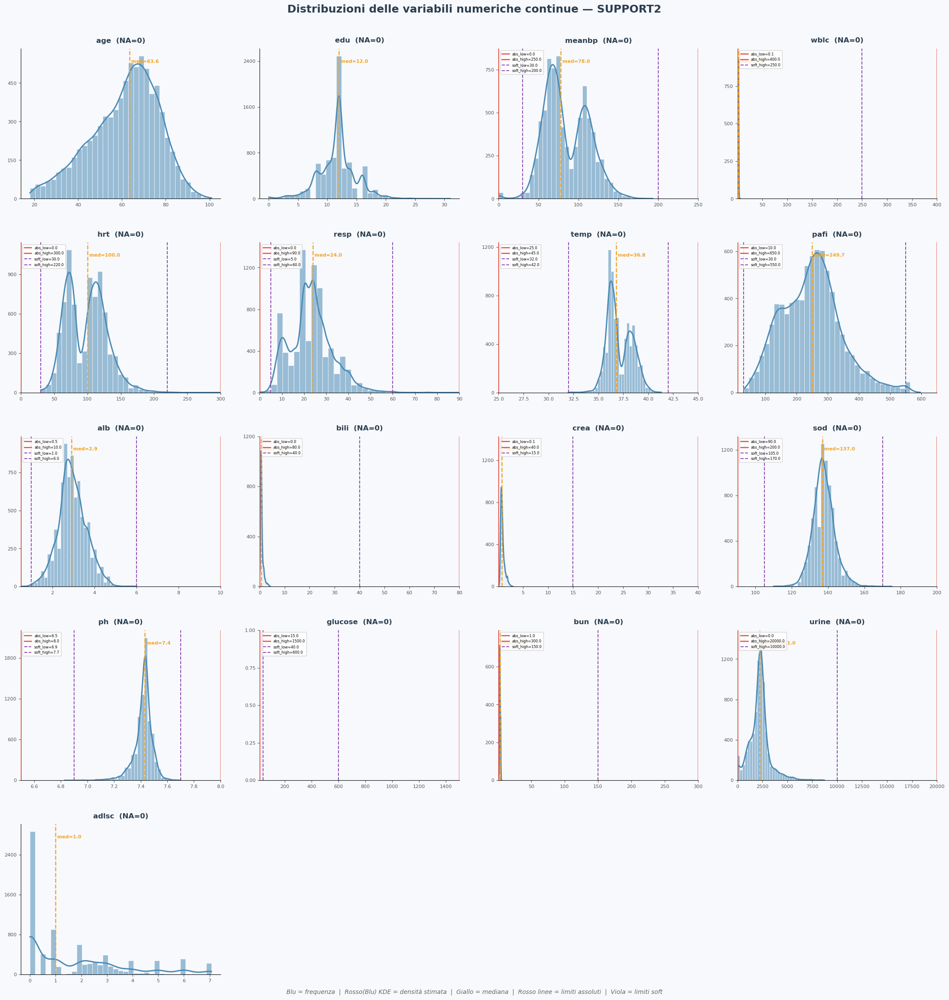

In [90]:
#vediamo le distribuzioni delle variabili
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import numpy as np

biological_rules = {
    "ph":      {"absolute_low": 6.5,  "absolute_high": 8.0,   "soft_low": 6.90,  "soft_high": 7.70},
    "glucose": {"absolute_low": 15.0, "absolute_high": 1500.0,"soft_low": 40.0,  "soft_high": 600.0},
    "crea":    {"absolute_low": 0.1,  "absolute_high": 40.0,  "soft_low": None,  "soft_high": 15.0},
    "bili":    {"absolute_low": 0.0,  "absolute_high": 80.0,  "soft_low": None,  "soft_high": 40.0},
    "bun":     {"absolute_low": 1.0,  "absolute_high": 300.0, "soft_low": None,  "soft_high": 150.0},
    "wblc":    {"absolute_low": 0.1,  "absolute_high": 400.0, "soft_low": None,  "soft_high": 250.0},
    "hrt":     {"absolute_low": 0.0,  "absolute_high": 300.0, "soft_low": 30.0,  "soft_high": 220.0},
    "temp":    {"absolute_low": 25.0, "absolute_high": 45.0,  "soft_low": 32.0,  "soft_high": 42.0},
    "resp":    {"absolute_low": 0.0,  "absolute_high": 90.0,  "soft_low": 5.0,   "soft_high": 60.0},
    "meanbp":  {"absolute_low": 0.0,  "absolute_high": 250.0, "soft_low": 30.0,  "soft_high": 200.0},
    "alb":     {"absolute_low": 0.5,  "absolute_high": 10.0,  "soft_low": 1.0,   "soft_high": 6.0},
    "pafi":    {"absolute_low": 10.0, "absolute_high": 650.0, "soft_low": 30.0,  "soft_high": 550.0},
    "sod":     {"absolute_low": 90.0, "absolute_high": 200.0, "soft_low": 105.0, "soft_high": 170.0},
    "urine":   {"absolute_low": 0.0,  "absolute_high": 20000.0,"soft_low": None, "soft_high": 10000.0}
}

plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.spines.top': False,
    'axes.spines.right': False,
})

# MIGLIORAMENTO 1: rimossa la riga commentata con il vecchio cols_exclude —
# lasciare codice commentato crea confusione su quale sia la lista attiva
cols_exclude = ['sex', 'diabetes', 'dementia', 'target_dnr_event', 
                'ca_metastatic', 'ca_no', 'ca_yes', 
                'race_asian', 'race_black', 'race_hispanic', 'race_other', 'race_white',
                'income_$11-$25k', 'income_$25-$50k', 'income_>$50k', 'income_under $11k',
                'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma',
                'num.co', 'scoma', 'id']

cont_cols = [c for c in df_eda.select_dtypes(include='number').columns
             if c not in cols_exclude]

# CORREZIONE 1: dnrday in SUPPORT2 vale -1 per i pazienti senza ordine DNR —
# crea un picco artificiale a -1 che distorce l'istogramma. Va esclusa o trattata separatamente.
if 'dnrday' in cont_cols:
    cont_cols.remove('dnrday')
    print("NOTA: 'dnrday' esclusa — contiene -1 per pazienti senza DNR. Analizzala separatamente.")

n_cols = 4
n_rows = -(-len(cont_cols) // n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, n_rows * 4.5))
fig.patch.set_facecolor('#F7F9FC')
axes = axes.flatten()

FILL_COLOR = '#4C8BB5'
KDE_COLOR  = '#E05A47'
MED_COLOR  = '#F4A425'
ABS_COLOR  = '#E74C3C'
SOFT_COLOR = '#8E44AD'

for i, col in enumerate(cont_cols):
    ax = axes[i]
    ax.set_facecolor('#F7F9FC')
    data = df_eda[col].dropna()
    na   = df_eda[col].isna().sum()

    if col in biological_rules:
        rules     = biological_rules[col]
        abs_low   = rules['absolute_low']
        abs_high  = rules['absolute_high']
        soft_low  = rules['soft_low']
        soft_high = rules['soft_high']
        if abs_low  is not None: data = data[data >= abs_low]
        if abs_high is not None: data = data[data <= abs_high]
    else:
        abs_low = abs_high = soft_low = soft_high = None

    median_val = data.median()

    sns.histplot(data, ax=ax, kde=True, bins=35,
                 color=FILL_COLOR, alpha=0.55,
                 edgecolor='white', linewidth=0.5,
                 line_kws={'linewidth': 2.2, 'color': KDE_COLOR})

    x_lo = abs_low  if abs_low  is not None else ax.get_xlim()[0]
    x_hi = abs_high if abs_high is not None else ax.get_xlim()[1]
    ax.set_xlim(x_lo, x_hi)

    # Linea mediana
    ax.axvline(median_val, color=MED_COLOR, linestyle='--', linewidth=1.8, zorder=5)

    # CORREZIONE 2: ax.get_ylim()[1] * 0.92 usa coordinate dati — se il plot
    # viene ridimensionato da tight_layout il testo può uscire dall'area.
    # ax.transAxes usa coordinate relative (0-1) indipendenti dal ridimensionamento.
    ax.text(median_val, 0.93,
            f' med={median_val:.1f}',
            transform=ax.get_xaxis_transform(),  # x in dati, y in assi (0-1)
            color=MED_COLOR, fontsize=8, fontweight='bold', va='top')

    # Limiti assoluti
    if abs_low  is not None:
        ax.axvline(abs_low,  color=ABS_COLOR, linewidth=1.8, linestyle='-',
                   label=f'abs_low={abs_low}', zorder=3)
    if abs_high is not None:
        ax.axvline(abs_high, color=ABS_COLOR, linewidth=1.8, linestyle='-',
                   label=f'abs_high={abs_high}', zorder=3)

    # Limiti soft
    if soft_low  is not None:
        ax.axvline(soft_low,  color=SOFT_COLOR, linewidth=1.4, linestyle='--',
                   label=f'soft_low={soft_low}', zorder=4)
    if soft_high is not None:
        ax.axvline(soft_high, color=SOFT_COLOR, linewidth=1.4, linestyle='--',
                   label=f'soft_high={soft_high}', zorder=4)

    if any(v is not None for v in [abs_low, abs_high, soft_low, soft_high]):
        # CORREZIONE 3: la legenda in 'upper right' collideva con il testo della
        # mediana quando questa è spostata verso destra. 'upper left' evita la sovrapposizione.
        ax.legend(fontsize=6, loc='upper left')

    # MIGLIORAMENTO 2: NA count nel titolo — coerente con i grafici precedenti
    ax.set_title(f'{col}  (NA={na})', fontsize=12, fontweight='bold',
                 color='#2C3E50', pad=10)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(labelsize=8, colors='#555555')
    ax.yaxis.set_major_locator(ticker.MaxNLocator(4))

for j in range(len(cont_cols), len(axes)):
    axes[j].set_visible(False)

fig.suptitle('Distribuzioni delle variabili numeriche continue \u2014 SUPPORT2',
             fontsize=18, fontweight='bold', color='#2C3E50', y=1.01)

fig.text(0.5, -0.005,
         'Blu = frequenza  |  Rosso(Blu) KDE = densità stimata  |  Giallo = mediana  |  Rosso linee = limiti assoluti  |  Viola = limiti soft',
         ha='center', fontsize=10, color='#666666', style='italic')

plt.tight_layout(h_pad=4, w_pad=3)
plt.show()


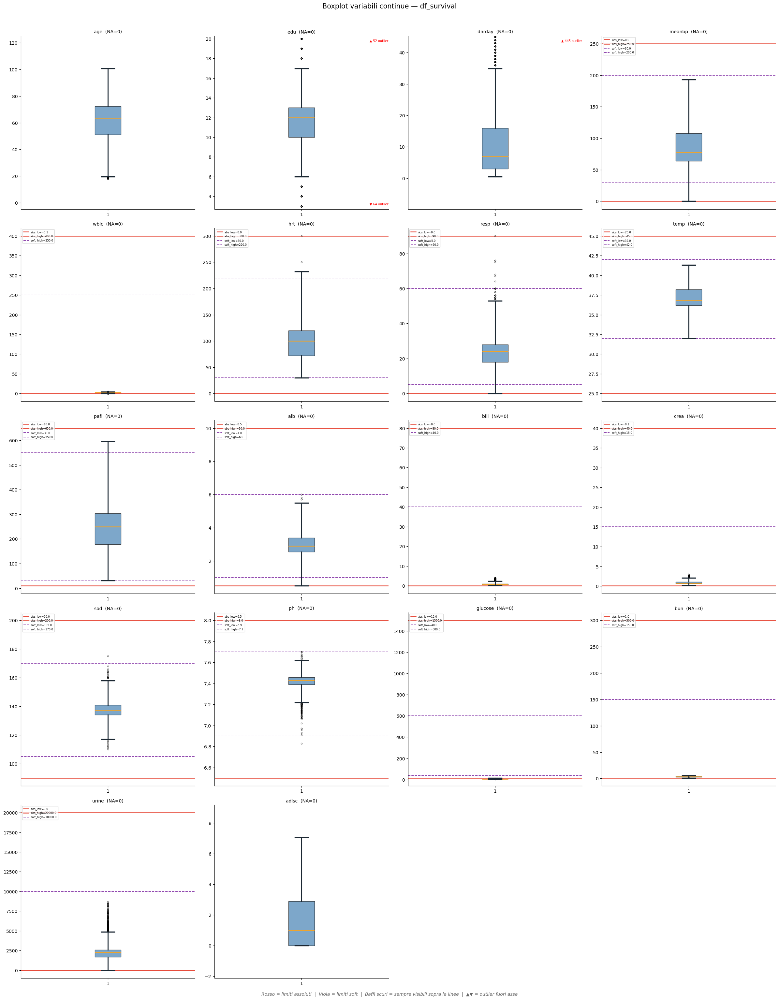

In [91]:
import matplotlib.pyplot as plt
import math
import numpy as np

cols_exclude = ['sex', 'diabetes', 'dementia', 'target_dnr_event', 
                'ca_metastatic', 'ca_no', 'ca_yes', 
                'race_asian', 'race_black', 'race_hispanic', 'race_other', 'race_white',
                'income_$11-$25k', 'income_$25-$50k', 'income_>$50k', 'income_under $11k',
                'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma',
                'num.co', 'scoma', 'id']

biological_rules = {
    "ph":      {"absolute_low": 6.5,  "absolute_high": 8.0,   "soft_low": 6.90,  "soft_high": 7.70},
    "glucose": {"absolute_low": 15.0, "absolute_high": 1500.0,"soft_low": 40.0,  "soft_high": 600.0},
    "crea":    {"absolute_low": 0.1,  "absolute_high": 40.0,  "soft_low": None,  "soft_high": 15.0},
    "bili":    {"absolute_low": 0.0,  "absolute_high": 80.0,  "soft_low": None,  "soft_high": 40.0},
    "bun":     {"absolute_low": 1.0,  "absolute_high": 300.0, "soft_low": None,  "soft_high": 150.0},
    "wblc":    {"absolute_low": 0.1,  "absolute_high": 400.0, "soft_low": None,  "soft_high": 250.0},
    "hrt":     {"absolute_low": 0.0,  "absolute_high": 300.0, "soft_low": 30.0,  "soft_high": 220.0},
    "temp":    {"absolute_low": 25.0, "absolute_high": 45.0,  "soft_low": 32.0,  "soft_high": 42.0},
    "resp":    {"absolute_low": 0.0,  "absolute_high": 90.0,  "soft_low": 5.0,   "soft_high": 60.0},
    "meanbp":  {"absolute_low": 0.0,  "absolute_high": 250.0, "soft_low": 30.0,  "soft_high": 200.0},
    "alb":     {"absolute_low": 0.5,  "absolute_high": 10.0,  "soft_low": 1.0,   "soft_high": 6.0},
    "pafi":    {"absolute_low": 10.0, "absolute_high": 650.0, "soft_low": 30.0,  "soft_high": 550.0},
    "sod":     {"absolute_low": 90.0, "absolute_high": 200.0, "soft_low": 105.0, "soft_high": 170.0},
    "urine":   {"absolute_low": 0.0,  "absolute_high": 20000.0,"soft_low": None, "soft_high": 10000.0}
}

non_physiological = {
    'age':    {'lower_floor': 0, 'whis': 1.5},
    'edu':    {'lower_floor': 0, 'whis': 1.5},
    'dnrday': {'lower_floor': 0, 'whis': 1.5},
}

ABS_COLOR  = '#E74C3C'
SOFT_COLOR = '#8E44AD'
WHIS_COLOR = '#1C2833'

# CORREZIONE 1: rimosso il filtro nunique() > 10 — è ridondante (cols_exclude
# gestisce già tutte le ordinali/binarie) e potrebbe escludere per sbaglio una
# variabile continua con pochi valori unici dovuti a molti NA
continuous_cols = [
    col for col in df_eda.select_dtypes(include='number').columns
    if col not in cols_exclude
]

n_cols = 4
n_rows = math.ceil(len(continuous_cols) / n_cols)

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(24, n_rows * 6))
axes = np.atleast_1d(axes).flatten()

for i, col in enumerate(continuous_cols):
    data = df_eda[col].dropna()
    na   = df_eda[col].isna().sum()
    ax   = axes[i]

    q1  = data.quantile(0.25)
    q3  = data.quantile(0.75)
    iqr = q3 - q1

    if col in biological_rules:
        rules     = biological_rules[col]
        abs_low   = rules['absolute_low']
        abs_high  = rules['absolute_high']
        soft_low  = rules['soft_low']
        soft_high = rules['soft_high']
        lower_limit = max(q1 - 2.5 * iqr, abs_low)
        upper_limit = min(q3 + 2.5 * iqr, abs_high)

    elif col in non_physiological:
        cond = non_physiological[col]
        abs_low = abs_high = soft_low = soft_high = None
        lower_limit = max(q1 - cond['whis'] * iqr, cond['lower_floor'])
        upper_limit = q3 + cond['whis'] * iqr

    else:
        abs_low = abs_high = soft_low = soft_high = None
        lower_limit = q1 - 2.5 * iqr
        upper_limit = q3 + 2.5 * iqr

    in_range      = data[(data >= lower_limit) & (data <= upper_limit)]
    lower_whisker = in_range.min() if not in_range.empty else lower_limit
    upper_whisker = in_range.max() if not in_range.empty else upper_limit
    outliers      = data[(data < lower_whisker) | (data > upper_whisker)]

    # CORREZIONE 2: rimossa la chiave 'mean' dal dict — bxp() la ignora
    # a meno che non si passi showmeans=True. Era codice morto.
    stats = [{
        'med':    data.median(),
        'q1':     q1,
        'q3':     q3,
        'whislo': lower_whisker,
        'whishi': upper_whisker,
        'fliers': outliers.tolist(),
    }]

    if abs_low is not None:
        ax.axhline(abs_low,  color=ABS_COLOR,  linewidth=1.8, linestyle='-',
                   label=f'abs_low={abs_low}',   zorder=2)
    if abs_high is not None:
        ax.axhline(abs_high, color=ABS_COLOR,  linewidth=1.8, linestyle='-',
                   label=f'abs_high={abs_high}',  zorder=2)
    if soft_low is not None:
        ax.axhline(soft_low,  color=SOFT_COLOR, linewidth=1.4, linestyle='--',
                   label=f'soft_low={soft_low}',  zorder=2)
    if soft_high is not None:
        ax.axhline(soft_high, color=SOFT_COLOR, linewidth=1.4, linestyle='--',
                   label=f'soft_high={soft_high}', zorder=2)

    ax.bxp(
        stats,
        showfliers=True,
        patch_artist=True,
        boxprops=dict(facecolor='steelblue', alpha=0.7, zorder=3),
        medianprops=dict(color='#F4A425', linewidth=1.8, zorder=5),
        whiskerprops=dict(color=WHIS_COLOR, linewidth=2.2, zorder=6),
        capprops=dict(color=WHIS_COLOR,     linewidth=2.5, zorder=6),
        flierprops=dict(marker='o', color='red', markersize=3, alpha=0.5, zorder=5),
    )

    # CORREZIONE 3: senza set_ylim, variabili molto skewed (charges, totcst, urine)
    # hanno outlier estremi che schiacciano il box rendendolo invisibile.
    # Per le fisiologiche: clipping al range biologico (valori fuori sono già
    # implausibili). Per le altre: clipping ai baffi + margine del 30%.
    if col in biological_rules:
        margin = (abs_high - abs_low) * 0.05
        ax.set_ylim(abs_low  - margin, abs_high + margin)
    else:
        margin = (upper_whisker - lower_whisker) * 0.3
        ax.set_ylim(lower_whisker - margin, upper_whisker + margin)

    # Annotazione outlier fuori dall'asse (non più visibili dopo set_ylim)
    n_out_above = int((data > ax.get_ylim()[1]).sum())
    n_out_below = int((data < ax.get_ylim()[0]).sum())
    if n_out_above > 0:
        ax.text(1.0, 0.98, f'▲ {n_out_above} outlier',
                transform=ax.transAxes, ha='right', va='top',
                fontsize=7, color='red')
    if n_out_below > 0:
        ax.text(1.0, 0.02, f'▼ {n_out_below} outlier',
                transform=ax.transAxes, ha='right', va='bottom',
                fontsize=7, color='red')

    if any(v is not None for v in [abs_low, abs_high, soft_low, soft_high]):
        ax.legend(fontsize=6, loc='upper left')

    # CORREZIONE 4: il titolo diceva 'df_final' ma il dataframe è 'df_survival'
    # Aggiunto anche NA count per coerenza con i grafici precedenti
    ax.set_title(f'{col}  (NA={na})', fontsize=10)
    ax.set_xlabel('')

for j in range(len(continuous_cols), len(axes)):
    axes[j].set_visible(False)

# CORREZIONE 4 (continua): corretto nome dataframe nel suptitle
plt.suptitle('Boxplot variabili continue — df_survival', fontsize=15, y=1.01)
fig.text(0.5, -0.005,
         'Rosso = limiti assoluti  |  Viola = limiti soft  |  Baffi scuri = sempre visibili sopra le linee  |  ▲▼ = outlier fuori asse',
         ha='center', fontsize=10, color='#666666', style='italic')
plt.tight_layout()
plt.show()


Gli outliers sono stati gestiti prima, quelli attualmente presenti non rappresentano errori di dati

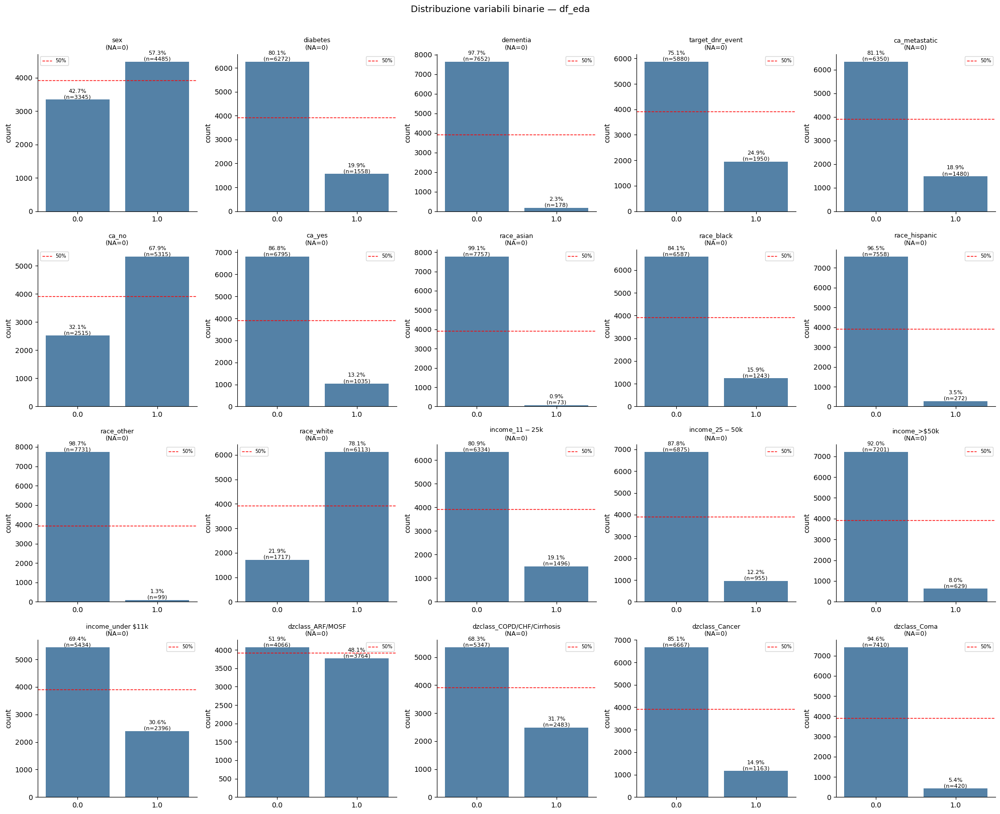

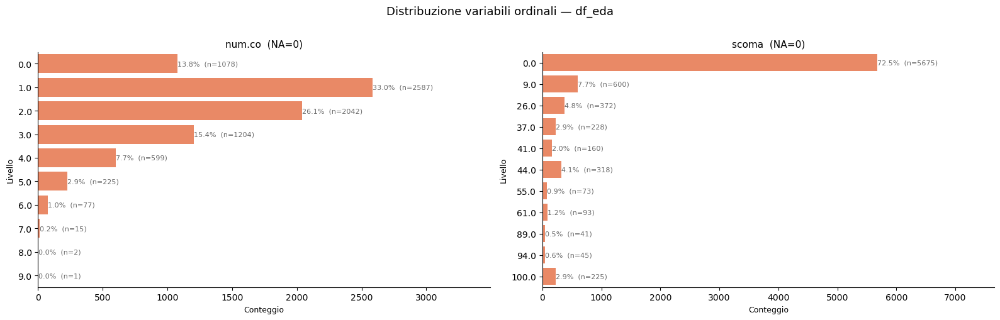

In [92]:
#Per le binarie e ordinali intere il grafico giusto è il countplot (frequenza di ogni categoria)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import math

binary_cols = [
    'sex', 'diabetes', 'dementia', 'target_dnr_event',
    'ca_metastatic', 'ca_no', 'ca_yes',
    'race_asian', 'race_black', 'race_hispanic', 'race_other', 'race_white',
    'income_$11-$25k', 'income_$25-$50k', 'income_>$50k', 'income_under $11k',
    'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma'
]

ordinal_cols = ['num.co', 'scoma']

# --- BINARIE ---
if binary_cols:
    n_cols = 5
    n_rows = math.ceil(len(binary_cols) / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, n_rows * 4))
    axes = np.atleast_1d(axes).flatten()

    for i, col in enumerate(binary_cols):
        data  = df_eda[col].dropna().astype(str)
        total = len(data)
        sns.countplot(x=data, ax=axes[i], color='steelblue', order=sorted(data.unique()))

        axes[i].axhline(y=total * 0.5, color='red', linestyle='--', linewidth=1, label='50%')
        axes[i].legend(fontsize=7)

        na = df_eda[col].isna().sum()
        axes[i].set_title(f'{col}\n(NA={na})', fontsize=9)
        axes[i].set_xlabel('')

        for p in axes[i].patches:
            count = int(p.get_height())
            pct = f'{100 * count / total:.1f}%\n(n={count})'
            axes[i].annotate(pct, (p.get_x() + p.get_width() / 2, p.get_height()),
                             ha='center', va='bottom', fontsize=8)

    for j in range(len(binary_cols), len(axes)):
        axes[j].set_visible(False)

    plt.suptitle('Distribuzione variabili binarie — df_eda', fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()

# --- ORDINALI ---
if ordinal_cols:
    n_cols = 2
    n_rows = math.ceil(len(ordinal_cols) / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(16, n_rows * 5))
    axes = np.atleast_1d(axes).flatten()

    for i, col in enumerate(ordinal_cols):
        data  = df_eda[col].dropna()
        order = sorted(data.unique())
        total = len(data)
        na    = df_eda[col].isna().sum()

        sns.countplot(y=data.astype(str), ax=axes[i],
                      order=[str(o) for o in order], color='coral')

        axes[i].set_title(f'{col}  (NA={na})', fontsize=11)
        axes[i].set_ylabel('Livello', fontsize=9)
        axes[i].set_xlabel('Conteggio', fontsize=9)

        for p in axes[i].patches:
            count = int(p.get_width())
            pct = f'{100 * count / total:.1f}%  (n={count})'
            axes[i].annotate(pct,
                             (p.get_width(), p.get_y() + p.get_height() / 2),
                             ha='left', va='center', fontsize=8, color='dimgray')

        axes[i].set_xlim(0, data.value_counts().max() * 1.35)

    for j in range(len(ordinal_cols), len(axes)):
        axes[j].set_visible(False)

    plt.suptitle('Distribuzione variabili ordinali — df_eda', fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()


2.ANALISI UNIVARIATO:

Come queste variabili sono relazionati con la domanda clinica che voglio risolvere? Quanto potenziale hanno i pazienti di firmare il dnr?

Analizzeremo una variabile alla volta, però ci potrebbe essere differenti interazioni tra variabili, cioè ci potrebbe essere 2 o più variabili che al combinarle, ci generino una migliore predizione, questa è una limitazione dell'analisi univariato, però lasciando stare questo, ci permetterà di avere una immagine più chiara di quali sono quelle variabili che hanno quella potenzialià di generare buone predizioni.

Dato che vogliamo rispondere alla domanda di quel tasso di conversione, cioè quali pazienti hanno il potenziale di firmare il dnr, allora calcoleremo il tasso di conversione; dove il tasso di conversione è quanti pazienti hanno firmato il dnr sul totale di pazienti che abbiamo.

Per calcolare questo tasso, utilizzeremo la variabile 'target_dnr_event'.

Questa colonna 'target_dnr_event' ci permetterà di misurare il tasso di conversione quando analizzeremo una variabile in particolare(dopo analizzeremo le variabili numeriche e la variabile da predire).

In [93]:
print(df_eda.shape)
print(df_eda['target_dnr_event'].describe())
print(df_eda['target_dnr_event'].value_counts())
print(df_eda['target_dnr_event'].value_counts(normalize=True).mul(100).round(2))

(7830, 41)
count    7830.000000
mean        0.249042
std         0.432486
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: target_dnr_event, dtype: float64
target_dnr_event
0.0    5880
1.0    1950
Name: count, dtype: int64
target_dnr_event
0.0    75.1
1.0    24.9
Name: proportion, dtype: float64


Analizzeremo prima le variabili numeriche, quindi la relazione tra le variabili numeriche e la variabile target 'target_dnr_event'.

Genereremo dei grafici che ci mostreranno per ogni variabile, quali persone con certe caratteristiche(di quelle variabili) hanno deciso di firmare il dnr(faremo dei boxplot)

C:\Users\renzo\AppData\Local\Temp\ipykernel_23988\3893372743.py:87: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_plot, x='target_dnr_event', y=col,
C:\Users\renzo\AppData\Local\Temp\ipykernel_23988\3893372743.py:126: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([f'No DNR (0)\nn={n0}', f'DNR (1)\nn={n1}'], fontsize=9)
C:\Users\renzo\AppData\Local\Temp\ipykernel_23988\3893372743.py:87: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_plot, x='target_dnr_event', y=col,
C:\Users\renzo\AppData\Local\Temp\ipykernel_23988\3893372743.py:126: UserWarning: set_ticklabels() should onl

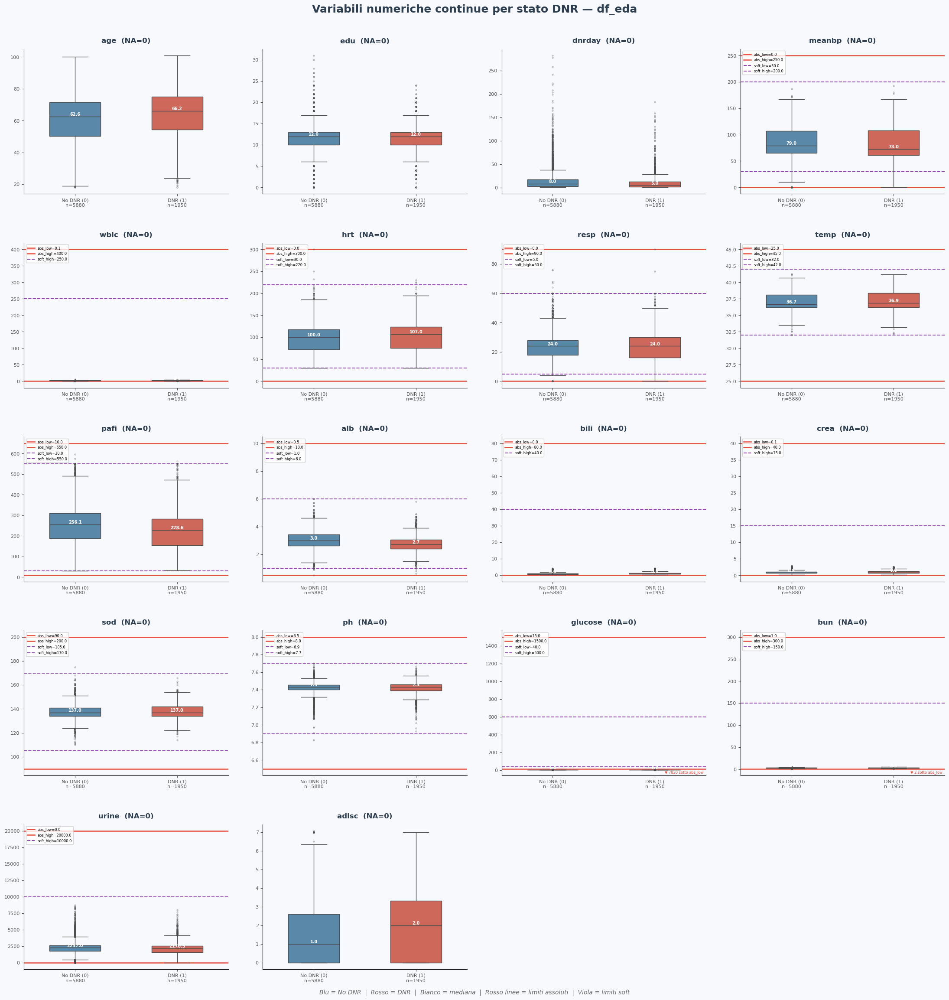

In [94]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math

plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.spines.top': False,
    'axes.spines.right': False,
})

biological_rules = {
    "ph":      {"absolute_low": 6.5,  "absolute_high": 8.0,    "soft_low": 6.90,  "soft_high": 7.70},
    "glucose": {"absolute_low": 15.0, "absolute_high": 1500.0, "soft_low": 40.0,  "soft_high": 600.0},
    "crea":    {"absolute_low": 0.1,  "absolute_high": 40.0,   "soft_low": None,  "soft_high": 15.0},
    "bili":    {"absolute_low": 0.0,  "absolute_high": 80.0,   "soft_low": None,  "soft_high": 40.0},
    "bun":     {"absolute_low": 1.0,  "absolute_high": 300.0,  "soft_low": None,  "soft_high": 150.0},
    "wblc":    {"absolute_low": 0.1,  "absolute_high": 400.0,  "soft_low": None,  "soft_high": 250.0},
    "hrt":     {"absolute_low": 0.0,  "absolute_high": 300.0,  "soft_low": 30.0,  "soft_high": 220.0},
    "temp":    {"absolute_low": 25.0, "absolute_high": 45.0,   "soft_low": 32.0,  "soft_high": 42.0},
    "resp":    {"absolute_low": 0.0,  "absolute_high": 90.0,   "soft_low": 5.0,   "soft_high": 60.0},
    "meanbp":  {"absolute_low": 0.0,  "absolute_high": 250.0,  "soft_low": 30.0,  "soft_high": 200.0},
    "alb":     {"absolute_low": 0.5,  "absolute_high": 10.0,   "soft_low": 1.0,   "soft_high": 6.0},
    "pafi":    {"absolute_low": 10.0, "absolute_high": 650.0,  "soft_low": 30.0,  "soft_high": 550.0},
    "sod":     {"absolute_low": 90.0, "absolute_high": 200.0,  "soft_low": 105.0, "soft_high": 170.0},
    "urine":   {"absolute_low": 0.0,  "absolute_high": 20000.0,"soft_low": None,  "soft_high": 10000.0}
}

ABS_COLOR  = '#E74C3C'
SOFT_COLOR = '#8E44AD'

cols_exclude = ['sex', 'diabetes', 'dementia', 'target_dnr_event',
                'ca_metastatic', 'ca_no', 'ca_yes',
                'race_asian', 'race_black', 'race_hispanic', 'race_other', 'race_white',
                'income_$11-$25k', 'income_$25-$50k', 'income_>$50k', 'income_under $11k',
                'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma',
                'num.co', 'scoma', 'id']

cont_cols = [c for c in df_eda.select_dtypes(include='number').columns
             if c not in cols_exclude]

n_cols = 4
n_rows = -(-len(cont_cols) // n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, n_rows * 4.5))
fig.patch.set_facecolor('#F7F9FC')
axes = np.atleast_1d(axes).flatten()

n0 = int((df_eda['target_dnr_event'] == 0).sum())
n1 = int((df_eda['target_dnr_event'] == 1).sum())

df_plot = df_eda.copy()
df_plot['target_dnr_event'] = df_eda['target_dnr_event'].map(
    {0: '0', 1: '1', 0.0: '0', 1.0: '1'}
)

palette = {'0': '#4C8BB5', '1': '#E05A47'}

for i, col in enumerate(cont_cols):
    ax = axes[i]
    ax.set_facecolor('#F7F9FC')

    # Limiti biologici — linee PRIMA del boxplot (zorder basso)
    if col in biological_rules:
        rules     = biological_rules[col]
        abs_low   = rules['absolute_low']
        abs_high  = rules['absolute_high']
        soft_low  = rules['soft_low']
        soft_high = rules['soft_high']

        if abs_low is not None:
            ax.axhline(abs_low,  color=ABS_COLOR,  linewidth=1.8, linestyle='-',
                       label=f'abs_low={abs_low}',   zorder=2)
        if abs_high is not None:
            ax.axhline(abs_high, color=ABS_COLOR,  linewidth=1.8, linestyle='-',
                       label=f'abs_high={abs_high}',  zorder=2)
        if soft_low is not None:
            ax.axhline(soft_low,  color=SOFT_COLOR, linewidth=1.4, linestyle='--',
                       label=f'soft_low={soft_low}',  zorder=2)
        if soft_high is not None:
            ax.axhline(soft_high, color=SOFT_COLOR, linewidth=1.4, linestyle='--',
                       label=f'soft_high={soft_high}', zorder=2)
    else:
        abs_low = abs_high = soft_low = soft_high = None

    # Boxplot sopra le linee
    sns.boxplot(data=df_plot, x='target_dnr_event', y=col,
                order=['0', '1'],
                palette=palette, ax=ax, width=0.5, zorder=3,
                flierprops=dict(marker='o', markersize=2, alpha=0.4, color='gray'))

    # Mediana per gruppo annotata sul box
    for j, grp in enumerate(['0', '1']):
        subset = df_plot[df_plot['target_dnr_event'] == grp][col].dropna()
        if not subset.empty:
            med = subset.median()
            ax.text(j, med, f'{med:.1f}',
                    ha='center', va='bottom', fontsize=7,
                    color='white', fontweight='bold', zorder=5)

    # Clipping asse y al range biologico per variabili fisiologiche
    # (evita che outliers estremi schiaccino il box rendendolo invisibile)
    if col in biological_rules:
        margin = (abs_high - abs_low) * 0.05
        ax.set_ylim(abs_low - margin, abs_high + margin)

        # Conta outlier tagliati dall'asse e annotali
        n_above = int((df_eda[col].dropna() > abs_high).sum())
        n_below = int((df_eda[col].dropna() < abs_low).sum())
        if n_above > 0:
            ax.text(0.99, 0.99, f'▲ {n_above} oltre abs_high',
                    transform=ax.transAxes, ha='right', va='top',
                    fontsize=6, color=ABS_COLOR)
        if n_below > 0:
            ax.text(0.99, 0.01, f'▼ {n_below} sotto abs_low',
                    transform=ax.transAxes, ha='right', va='bottom',
                    fontsize=6, color=ABS_COLOR)

        ax.legend(fontsize=6, loc='upper left')

    na = df_eda[col].isna().sum()
    ax.set_title(f'{col}  (NA={na})', fontsize=12, fontweight='bold',
                 color='#2C3E50', pad=10)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_xticklabels([f'No DNR (0)\nn={n0}', f'DNR (1)\nn={n1}'], fontsize=9)
    ax.tick_params(labelsize=8, colors='#555555')

for j in range(len(cont_cols), len(axes)):
    axes[j].set_visible(False)

fig.suptitle('Variabili numeriche continue per stato DNR — df_eda',
             fontsize=18, fontweight='bold', color='#2C3E50', y=1.01)

fig.text(0.5, -0.005,
         'Blu = No DNR  |  Rosso = DNR  |  Bianco = mediana  |  Rosso linee = limiti assoluti  |  Viola = limiti soft',
         ha='center', fontsize=10, color='#666666', style='italic')

plt.tight_layout(h_pad=4, w_pad=3)
plt.show()


Posssiamo definire una funzione che ci permetta di definire il tasso di conversione:

In [95]:
def graficare_tasso_di_conversione(var_predittiva, var_target,
                                   plot_type='line', order=None, df=df_eda):
    # CORREZIONE 1: rinominato 'type' → 'plot_type' — 'type' è una funzione
    # built-in di Python, usarla come nome parametro la sovrascrive nel contesto
    # della funzione, potenzialmente causando errori difficili da tracciare

    # CORREZIONE 2: aggiunto parametro 'df=df_eda' invece di usare df_eda
    # hardcoded — così la funzione è riusabile con altri dataframe senza
    # modificare il codice interno

    x, y = var_predittiva, var_target
    gruppo = df.groupby(x)[y].mean().mul(100).rename('tasso_conv').reset_index()

    # MIGLIORAMENTO 1: linea di riferimento al tasso medio globale —
    # permette di vedere subito quali livelli sono sopra/sotto la media
    tasso_globale = df[y].mean() * 100

    if plot_type == 'line': #utile per range continui
        plt.figure(figsize=(10, 6))
        sns.lineplot(x=var_predittiva, y='tasso_conv', data=gruppo)
        plt.axhline(tasso_globale, color='red', linestyle='--', linewidth=1,
                    label=f'media globale: {tasso_globale:.1f}%')
        plt.legend(fontsize=9)
        plt.grid(alpha=0.4)

    elif plot_type == 'bar': #utile se i dati si dividono in range o sono categorici
        plt.figure(figsize=(14, 6))
        ax = sns.barplot(x=var_predittiva, y='tasso_conv', data=gruppo, order=order)
        plt.axhline(tasso_globale, color='red', linestyle='--', linewidth=1,
                    label=f'media globale: {tasso_globale:.1f}%')
        plt.legend(fontsize=9)

        # MIGLIORAMENTO 2: annotazione percentuale sopra ogni barra —
        # con barplot non si legge il valore esatto senza guardare l'asse y
        for p in ax.patches:
            ax.annotate(f'{p.get_height():.1f}%',
                        (p.get_x() + p.get_width() / 2, p.get_height()),
                        ha='center', va='bottom', fontsize=9)

    elif plot_type == 'scatter': #utile se i dati si dividono in range o sono categorici
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x=var_predittiva, y='tasso_conv', data=gruppo)
        plt.axhline(tasso_globale, color='red', linestyle='--', linewidth=1,
                    label=f'media globale: {tasso_globale:.1f}%')
        plt.legend(fontsize=9)
        plt.grid(alpha=0.4)

    # CORREZIONE 3: aggiunti titolo, label assi e plt.show() — mancavano
    # in tutte e tre le versioni. Senza titolo il grafico non è auto-esplicativo,
    # e plt.show() garantisce la visualizzazione anche fuori da Jupyter
    plt.title(f'Tasso di conversione di [{var_target}]\nper [{var_predittiva}]',
              fontsize=13, fontweight='bold')
    plt.ylabel('Tasso di conversione (%)', fontsize=11)
    plt.xlabel(var_predittiva, fontsize=11)
    plt.tight_layout()
    plt.show()


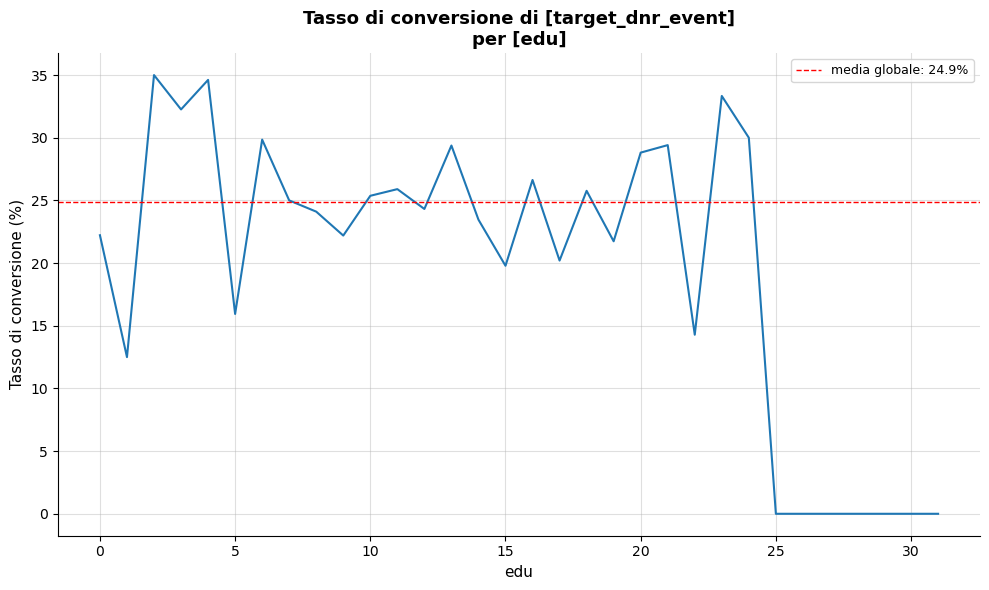

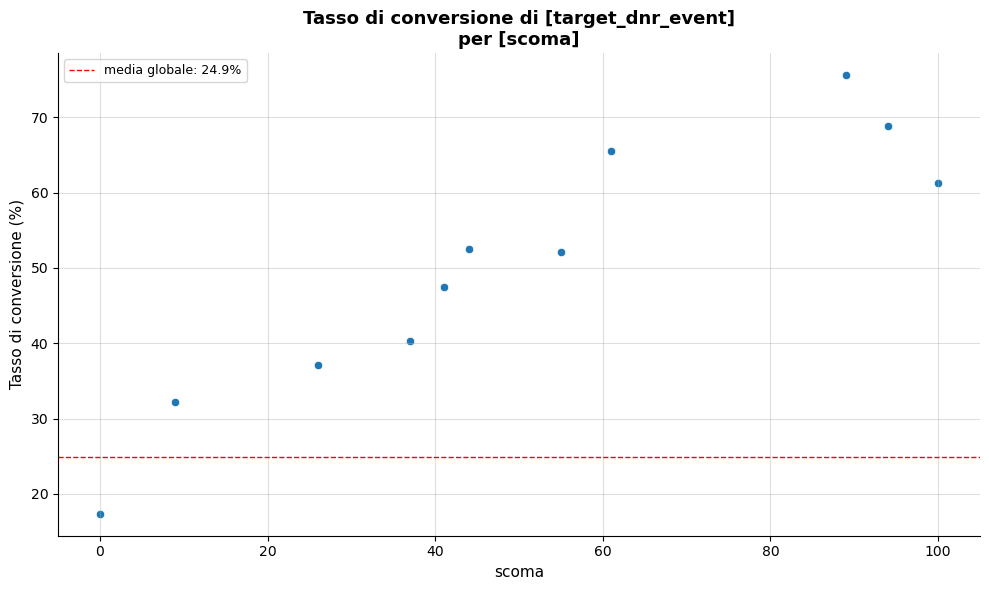

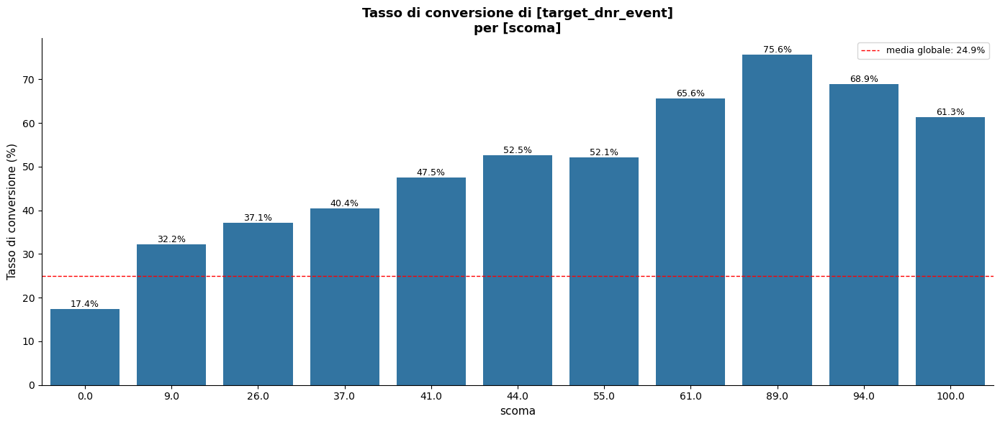

In [96]:
graficare_tasso_di_conversione('edu', 'target_dnr_event')
graficare_tasso_di_conversione('scoma','target_dnr_event',plot_type='scatter')
graficare_tasso_di_conversione('scoma','target_dnr_event',plot_type='bar')

Se non si capisce nulla dal grafico, allora possiamo suddividere una variabile e  creare dei sottogruppi (es. 'age' lo faccio diventare in categorico in 'range_eta', quindi da 30 anni passiamo al range di 20-30 anni)e capire come sono relazionati rispetto al tasso di conversione (volendo potremmo eliminare la colonna originale, però quello è a scelta del data scientist).

Lo stesso vale se ci sono troppi gruppi(nelle variabili categoriche), alcuni li potremmo raggruppare
e possiamo semplificare i nuovi gruppi creati al posto della colona originale, quindi eliminando la colonna originale

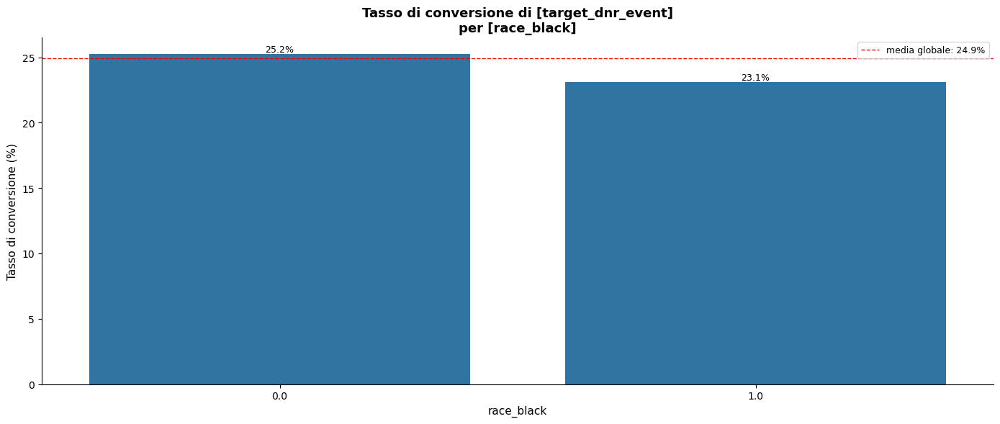

In [97]:
graficare_tasso_di_conversione('race_black', 'target_dnr_event', plot_type='bar')

2.ANALISI BIVARIATO:

Vediamo coppie di variabili predittive e le loro probabilità assieme di avere tassi di conversione

In [98]:
def graficare_tc_bivariate(col_list, order=None, hue_order=None,
                            target_var='target_dnr_event',
                            bins=None, min_n=10, df=df_eda):
    if len(col_list) != 2:
        raise ValueError("col_list deve contenere esattamente 2 colonne")

    df_work = df.copy()
    bins = bins or {}

    for col in col_list:
        n = df_work[col].nunique()
        if col in bins:
            df_work[col] = pd.qcut(df_work[col], q=bins[col], duplicates='drop')
            print(f"INFO: '{col}' divisa in {bins[col]} fasce (quantili)")
        elif n > 20:
            # MIGLIORAMENTO 1: auto-binning automatico invece di solo avvertire —
            # prima stampava un warning e produceva un grafico inutilizzabile.
            # pd.qcut crea fasce con uguale numero di pazienti (più equilibrate
            # di pd.cut che crea fasce di uguale ampiezza)
            df_work[col] = pd.qcut(df_work[col], q=8, duplicates='drop')
            print(f"INFO: '{col}' ({n} livelli) → binnarizzata in 8 fasce "
                  f"di uguale frequenza. Usa bins={{'{col}': N}} per N diverso.")

    tc = (df_work.groupby(col_list, observed=True)[target_var]
                 .mean().mul(100).rename('tasso_conv').reset_index())
    counts = df_work.groupby(col_list, observed=True).size().reset_index(name='n')
    tc = tc.merge(counts, on=col_list)

    # MIGLIORAMENTO 2: filtro min_n — rimuove combinazioni con pochi pazienti
    # che danno tassi 0% o 100% artificiali (es. 1 paziente con DNR=1 → 100%)
    n_removed = (tc['n'] < min_n).sum()
    tc_filtered = tc[tc['n'] >= min_n].copy()
    if n_removed > 0:
        print(f"INFO: {n_removed} combinazioni escluse con n < {min_n} "
              f"(tasso inaffidabile). Usa min_n=N per cambiare soglia.")
    if tc_filtered.empty:
        print("ERRORE: nessuna combinazione ha n >= min_n. Riduci min_n.")
        return tc

    y_categories = order if order else sorted(tc_filtered[col_list[0]].unique(), key=str)
    hue_categories = hue_order if hue_order else sorted(tc_filtered[col_list[1]].unique(), key=str)
    y_pos_map = {cat: idx for idx, cat in enumerate(y_categories)}
    n_hue = len(hue_categories)
    dodge_step = 0.25
    colors = sns.color_palette("tab10", n_hue)

    # MIGLIORAMENTO 3: sfondo bianco e stile pulito
    fig, ax = plt.subplots(figsize=(14, max(6, len(y_categories) * 0.5 + 2)))
    ax.set_facecolor('white')
    fig.patch.set_facecolor('white')
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)

    for j, hue_val in enumerate(hue_categories):
        sub = tc_filtered[tc_filtered[col_list[1]] == hue_val]
        y_positions = [y_pos_map[v] + (j - (n_hue - 1) / 2) * dodge_step
                       for v in sub[col_list[0]]]
        sizes = (sub['n'] / tc_filtered['n'].max() * 300).clip(lower=40)
        ax.scatter(sub['tasso_conv'], y_positions,
                   color=colors[j], label=str(hue_val),
                   s=sizes, alpha=0.85, zorder=3, edgecolors='white', linewidths=0.5)

        # MIGLIORAMENTO 4: annotazione n vicino a ogni punto —
        # mostra direttamente il numero di pazienti senza dover guardare
        # la legenda della dimensione
        for _, row in sub.iterrows():
            y_p = y_pos_map[row[col_list[0]]] + (j - (n_hue - 1) / 2) * dodge_step
            ax.text(row['tasso_conv'] + 1, y_p, f"n={row['n']}",
                    va='center', fontsize=7, color=colors[j], alpha=0.8)

    ax.set_yticks(range(len(y_categories)))
    ax.set_yticklabels(y_categories, fontsize=9)
    ax.set_xlim(0, 105)
    ax.set_xticks(range(0, 101, 10))
    ax.set_xticklabels([f'{v}%' for v in range(0, 101, 10)], fontsize=9)
    ax.yaxis.grid(True, alpha=0.3, linestyle='--')
    ax.xaxis.grid(True, alpha=0.3, linestyle='--')

    tasso_globale = df[target_var].mean() * 100
    ax.axvline(tasso_globale, color='red', linestyle='--', linewidth=1.2,
               label=f'media globale: {tasso_globale:.1f}%')

    ax.legend(title=col_list[1], fontsize=9, framealpha=0.9)
    ax.set_xlabel('Tasso di conversione (%)', fontsize=11)
    ax.set_ylabel(col_list[0], fontsize=11)
    plt.title(f'Tasso di conversione per [{col_list[0]}] e [{col_list[1]}]',
              fontsize=13, fontweight='bold', pad=15)
    fig.text(0.5, -0.02,
             f'Dimensione punto ∝ n osservazioni  |  Escluse combinazioni con n < {min_n}',
             ha='center', fontsize=9, color='gray', style='italic')
    plt.tight_layout()
    plt.show()
    
    #n è il numero di osservazioni (pazienti) in quella combinazione specifica.
    # #Esempio concreto:
    # #Se hai scoma=5 e race_black=1, n=12 significa che ci sono 12 pazienti 
    # nel dataset con quella combinazione. Il tasso di conversione di quel punto 
    # è calcolato su quei 12 pazienti.
    return tc_filtered[col_list + ['tasso_conv', 'n']]


INFO: 2 combinazioni escluse con n < 10 (tasso inaffidabile). Usa min_n=N per cambiare soglia.


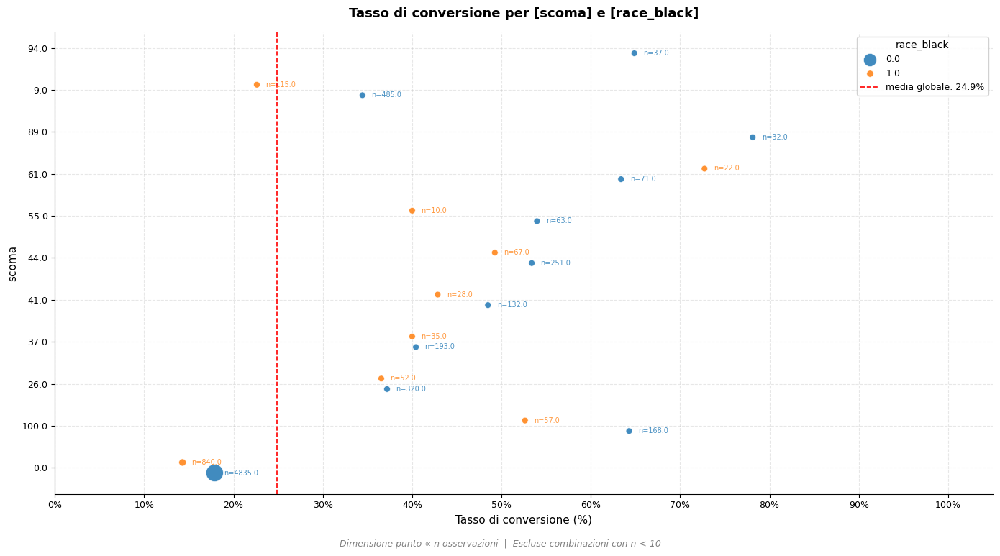

,scoma,race_black,tasso_conv,n
0,0.0,0.0,17.890383,4835
1,0.0,1.0,14.285714,840
2,9.0,0.0,34.432990,485
3,9.0,1.0,22.608696,115
4,26.0,0.0,37.187500,320
5,26.0,1.0,36.538462,52
6,37.0,0.0,40.414508,193
7,37.0,1.0,40.000000,35
8,41.0,0.0,48.484848,132
9,41.0,1.0,42.857143,28


In [99]:
graficare_tc_bivariate(['scoma', 'race_black'], target_var='target_dnr_event', df=df_eda)

INFO: 'age' (6441 livelli) → binnarizzata in 8 fasce di uguale frequenza. Usa bins={'age': N} per N diverso.


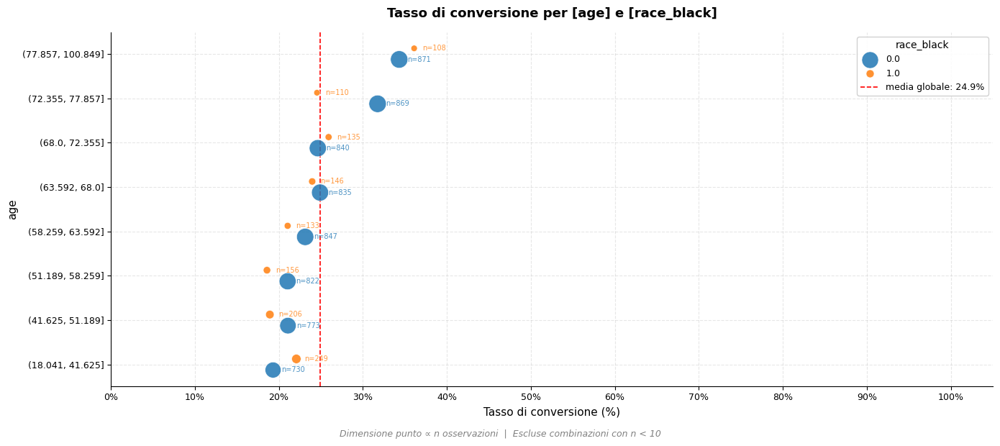

,age,race_black,tasso_conv,n
0,"(18.041, 41.625]",0.0,19.315068,730
1,"(18.041, 41.625]",1.0,22.088353,249
2,"(41.625, 51.189]",0.0,21.086675,773
3,"(41.625, 51.189]",1.0,18.932039,206
4,"(51.189, 58.259]",0.0,21.046229,822
5,"(51.189, 58.259]",1.0,18.589744,156
6,"(58.259, 63.592]",0.0,23.140496,847
7,"(58.259, 63.592]",1.0,21.052632,133
8,"(63.592, 68.0]",0.0,24.910180,835
9,"(63.592, 68.0]",1.0,23.972603,146


In [100]:
#la funzione divide le variabili in fasce (se sono continue per evitare problemi computazionali) e poi calcola il tasso di conversione per ogni combinazione di fasce e categorie. Se una combinazione ha meno di min_n pazienti, viene esclusa dal grafico per evitare tassi poco affidabili. Il grafico mostra il tasso di conversione con punti colorati per la seconda variabile (hue) e dimensioni proporzionali al numero di pazienti in quella combinazione. Viene anche tracciata una linea verticale per il tasso medio globale, permettendo di vedere subito quali combinazioni sono sopra o sotto la media.
graficare_tc_bivariate(['age', 'race_black'], target_var='target_dnr_event', df=df_eda)

ANALISI MULTIVARIATA

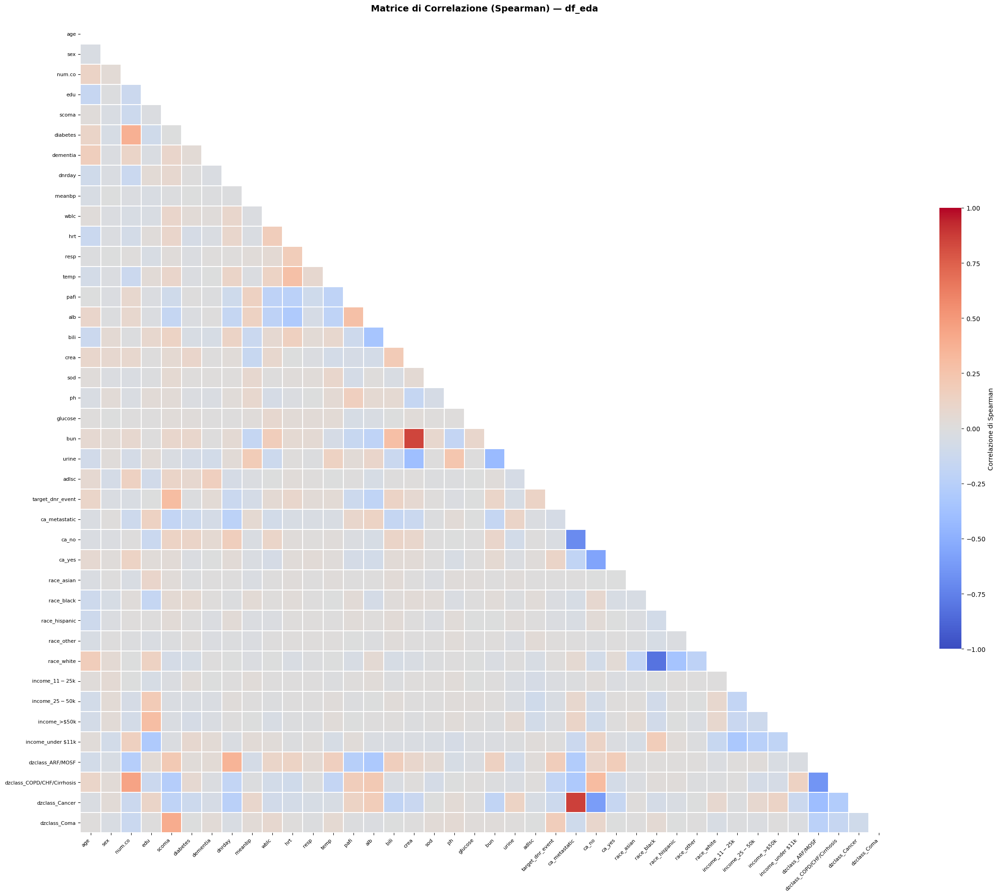

In [101]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# CORREZIONE 1: escludi 'id' — è un identificativo, la sua correlazione
# con le altre variabili non ha significato
cols_corr = [c for c in df_eda.select_dtypes(include="number").columns
             if c != 'id']

# CORREZIONE 2: usa Spearman invece di Pearson (default) —
# il dataset ha variabili binarie (0/1) e ordinali miste a continue.
# Spearman è più robusto per questi tipi di variabili perché non assume
# linearità e funziona su scale diverse
corr_matrix = df_eda[cols_corr].corr(method='spearman')

# MIGLIORAMENTO 1: maschera il triangolo superiore + diagonale —
# la matrice è simmetrica, mostrare entrambi i triangoli è ridondante
# e raddoppia il disordine visivo
mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=0)

# MIGLIORAMENTO 2: dimensione figura dinamica in base al numero di variabili
n = len(corr_matrix)
fig_size = max(18, n * 0.6)

fig, ax = plt.subplots(figsize=(fig_size, fig_size * 0.85))

sns.heatmap(
    corr_matrix,
    mask=mask,
    # CORREZIONE 3: rimosso annot=True — con 40+ variabili i numeri si
    # sovrappongono e rendono il grafico illeggibile (come si vede nell'output).
    # Il colore da solo comunica la correlazione in modo più immediato.
    annot=False,
    cmap="coolwarm",
    center=0,
    # CORREZIONE 4: aggiunti vmin/vmax espliciti — senza di essi la scala
    # colore si adatta al range effettivo dei dati, rendendo difficile
    # confrontare visivamente correlazioni deboli vs forti
    vmin=-1, vmax=1,
    linewidths=0.3,
    linecolor='white',
    square=True,           # celle quadrate — più leggibile
    ax=ax,
    cbar_kws={"shrink": 0.5, "label": "Correlazione di Spearman"}
)

# MIGLIORAMENTO 3: etichette angolate sull'asse x per evitare sovrapposizione
ax.set_xticklabels(ax.get_xticklabels(), fontsize=8, rotation=45, ha='right')
ax.set_yticklabels(ax.get_yticklabels(), fontsize=8, rotation=0)
ax.set_title("Matrice di Correlazione (Spearman) — df_eda",
             fontsize=14, fontweight='bold', pad=20)

plt.tight_layout()
plt.show()


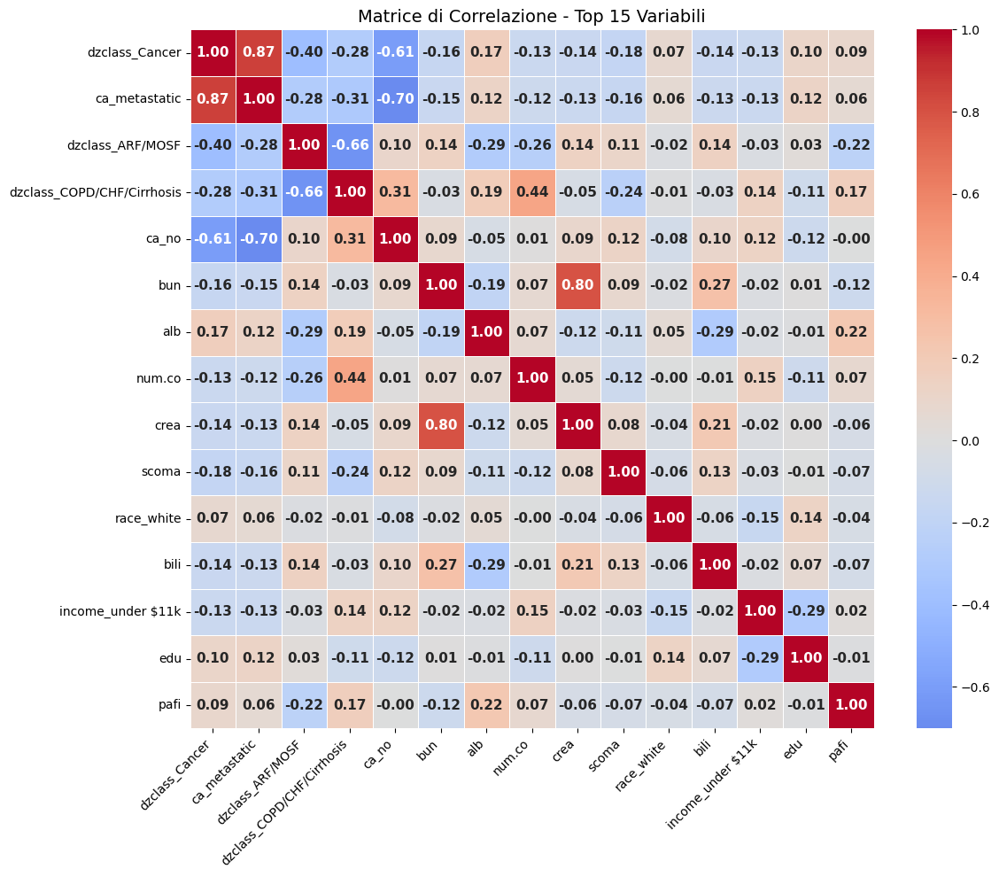

Top 15 variabili più correlate:
dzclass_Cancer                0.148623
ca_metastatic                 0.140341
dzclass_ARF/MOSF              0.140168
dzclass_COPD/CHF/Cirrhosis    0.133472
ca_no                         0.125479
bun                           0.117887
alb                           0.110718
num.co                        0.108455
crea                          0.106315
scoma                         0.102966
race_white                    0.102627
bili                          0.101335
income_under $11k             0.099479
edu                           0.091411
pafi                          0.090795
dtype: float64


In [102]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

corr_matrix = df_eda.select_dtypes(include="number").corr()

# Seleziona le 10 variabili con correlazione media assoluta più alta
mean_abs_corr = corr_matrix.abs().mean().sort_values(ascending=False)
top15_vars = mean_abs_corr.head(15).index

corr_top15 = corr_matrix.loc[top15_vars, top15_vars]

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_top15,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    annot_kws={"size": 11, "weight": "bold"}
)
plt.title("Matrice di Correlazione - Top 15 Variabili", fontsize=14)
plt.xticks(fontsize=10, rotation=45, ha="right")
plt.yticks(fontsize=10, rotation=0)
plt.tight_layout()
plt.show()

print("Top 15 variabili più correlate:")
print(mean_abs_corr.head(15))


In [103]:
df_provetta = df_imputed_full.copy()

Per un'analisi multivariata semplice ed efficace con target binario, faremo 3 approcci in ordine di priorità:

1.Feature Importance con Random Forest: mostra quali variabili predicono meglio target_dnr_event e quanto.

2.Pairplot sulle top-5 variabili più correlate con il target: visualizza le relazioni tra le variabili più rilevanti, colorate per DNR.

Righe usate: 7830/7830 (100.0%)

Distribuzione target: {0.0: 0.751, 1.0: 0.249}


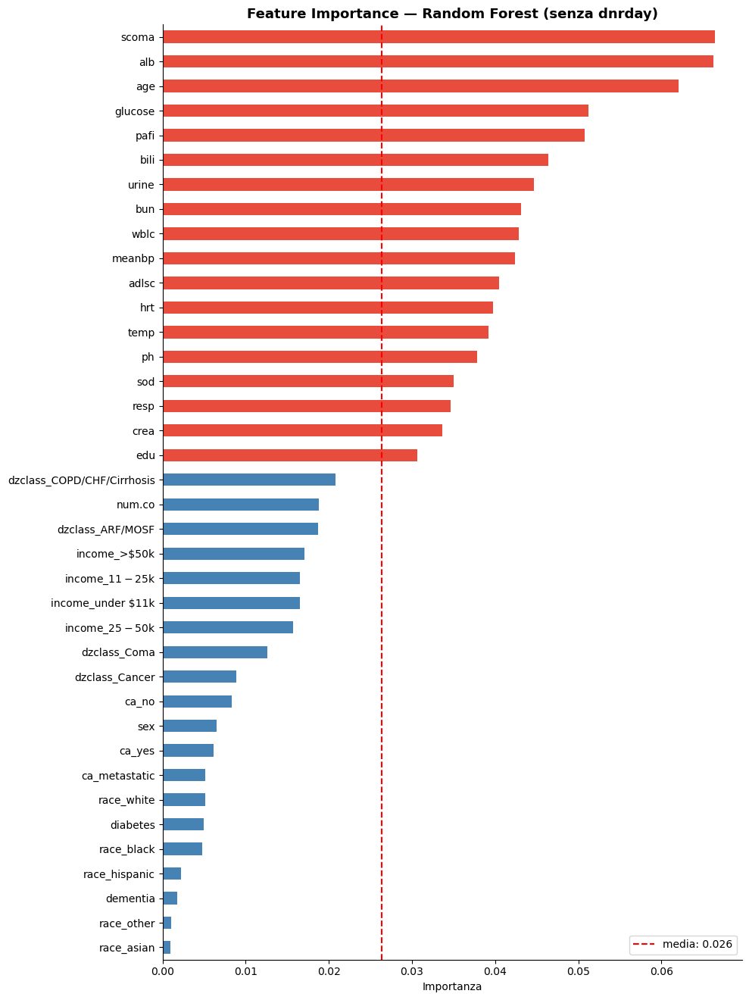

In [104]:
#1.Feature Importance con Random Forest (escludendo dnrday per data leakage)

from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# CORREZIONE GLOBALE: escludi dnrday (data leakage) e id
cols_exclude_rf = ['id', 'target_dnr_event', 'dnrday']
# Prepara dati (solo numeriche, senza NA)
X = df_provetta.select_dtypes(include='number').drop(columns=cols_exclude_rf, errors='ignore')
y = df_provetta['target_dnr_event']

# MIGLIORAMENTO: controlla quante righe sopravvivono alla rimozione NA
n_prima = len(X)
mask = X.notna().all(axis=1) & y.notna()
n_dopo = mask.sum()
print(f"Righe usate: {n_dopo}/{n_prima} ({100*n_dopo/n_prima:.1f}%)")
if n_dopo / n_prima < 0.5:
    print("ATTENZIONE: più del 50% delle righe eliminate per NA — "
          "considera un'imputazione prima di questa analisi")

X_clean, y_clean = X[mask], y[mask]

# MIGLIORAMENTO: class_weight='balanced' per target sbilanciato
print(f"\nDistribuzione target: {y_clean.value_counts(normalize=True).round(3).to_dict()}")
rf = RandomForestClassifier(n_estimators=200, class_weight='balanced', random_state=42)
rf.fit(X_clean, y_clean)

importance = (pd.Series(rf.feature_importances_, index=X_clean.columns)
                .sort_values(ascending=True))

fig, ax = plt.subplots(figsize=(10, len(importance) * 0.35))
colors = ['#E74C3C' if v >= importance.mean() else 'steelblue'
          for v in importance]
importance.plot(kind='barh', ax=ax, color=colors)
ax.axvline(importance.mean(), color='red', linestyle='--',
           label=f'media: {importance.mean():.3f}')
ax.set_title('Feature Importance — Random Forest (senza dnrday)',
             fontsize=13, fontweight='bold')
ax.set_xlabel('Importanza')
ax.legend()
plt.tight_layout()
plt.show()


Feature Importance (senza dnrday):

Senza dnrday è corretto e clinicamente sensato.

Le barre rosse (sopra la media) sono tutte variabili fisiologiche/lab: scoma, alb, age, glucose, pafi, bili — sono i marker di gravità clinica che guidano le decisioni DNR.

Le barre blu (sotto la media) sono variabili demografiche/categoriche (race_*, sex, diabetes) — contano poco, coerente con la clinica.

adlsc compare tra le importanti — è la scala di disabilità funzionale calibrata, clinicamente rilevante

Top 5 variabili continue per correlazione con target: ['scoma', 'alb', 'adlsc', 'bili', 'pafi']


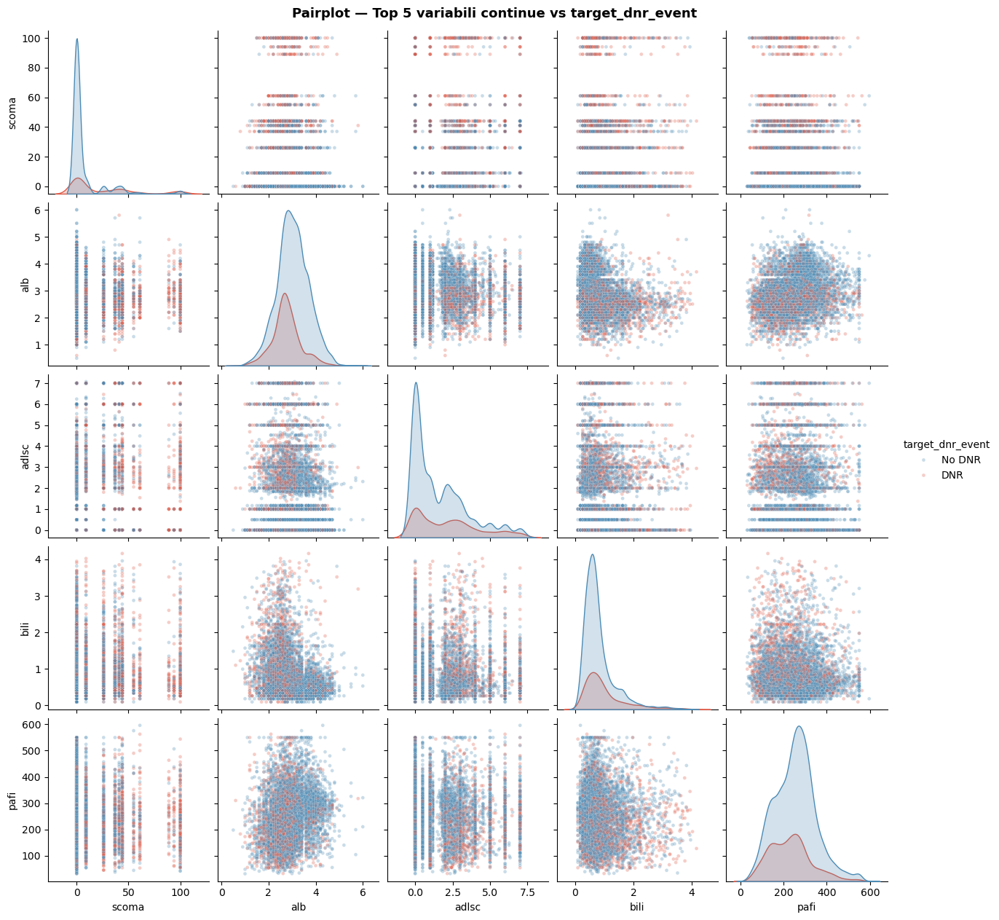

In [105]:
#2. Pairplot sulle top-5 variabili più correlate con il target

# ── PAIRPLOT: solo variabili continue dalla top-5 ───────────────────────────

# CORREZIONE: filtra solo continue (nunique > 10) tra le top correlate
top_corr = (df_eda[X_clean.columns.tolist() + ['target_dnr_event']]
            .corr(method='spearman')['target_dnr_event']
            .drop('target_dnr_event').abs()
            .sort_values(ascending=False))

# MIGLIORAMENTO: prendi top-5 solo tra le variabili continue
# Top 5 variabili più correlate col target
top5_cont = [col for col in top_corr.index
             if df_eda[col].nunique() > 10][:5]
print(f"Top 5 variabili continue per correlazione con target: {top5_cont}")

plot_df = df_eda[top5_cont + ['target_dnr_event']].dropna()
plot_df['target_dnr_event'] = plot_df['target_dnr_event'].map({0: 'No DNR', 1: 'DNR'})

sns.pairplot(plot_df,
             hue='target_dnr_event',
             palette={'No DNR': '#4C8BB5', 'DNR': '#E05A47'},
             plot_kws={'alpha': 0.3, 's': 12},
             diag_kind='kde')
plt.suptitle('Pairplot — Top 5 variabili continue vs target_dnr_event',
             y=1.01, fontsize=13, fontweight='bold')
plt.show()


Pairplot:

alb: i pazienti DNR hanno albumina più bassa → più malnutriti/gravi ✓
pafi: i pazienti DNR hanno PaO2/FiO2 più basso → peggiore funzione respiratoria ✓
adlsc: piccola separazione — DNR tendono ad avere disabilità funzionale maggiore ✓
scoma: mostra pattern a strisce — conferma che è discreta/ordinale, non ideale per pairplot
I gruppi si sovrappongono molto → la separazione non è netta, serve un modello non lineare

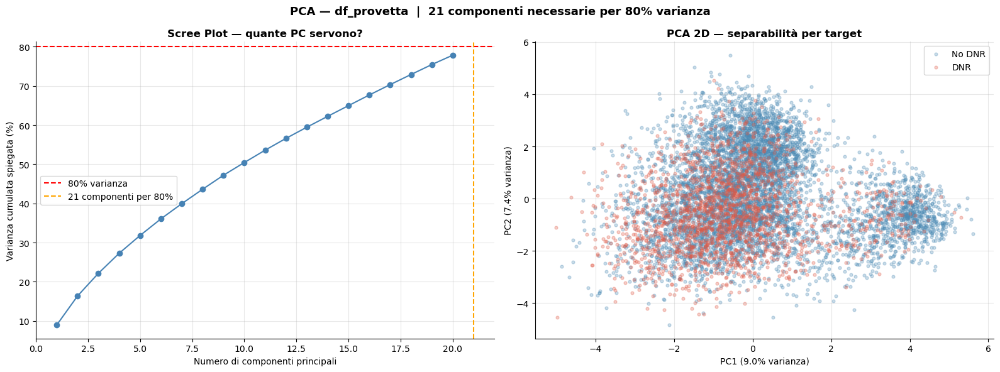

In [106]:
#3. PCA colorato per target_dnr_event

# ── PCA ─────────────────────────────────────────────────────────────────────

X_scaled = StandardScaler().fit_transform(X_clean)

# MIGLIORAMENTO: scree plot per vedere quante componenti servono
pca_full = PCA().fit(X_scaled)
varianza_cumulata = np.cumsum(pca_full.explained_variance_ratio_) * 100

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Scree plot
axes[0].plot(range(1, 21), varianza_cumulata[:20], marker='o', color='steelblue')
axes[0].axhline(80, color='red', linestyle='--', label='80% varianza')
n_comp_80 = np.argmax(varianza_cumulata >= 80) + 1
axes[0].axvline(n_comp_80, color='orange', linestyle='--',
                label=f'{n_comp_80} componenti per 80%')
axes[0].set_xlabel('Numero di componenti principali')
axes[0].set_ylabel('Varianza cumulata spiegata (%)')
axes[0].set_title('Scree Plot — quante PC servono?', fontweight='bold')
axes[0].legend()
axes[0].grid(alpha=0.3)

# PCA 2D
pca2 = PCA(n_components=2)
X_pca = pca2.fit_transform(X_scaled)
for val, color, label in [(0, '#4C8BB5', 'No DNR'), (1, '#E05A47', 'DNR')]:
    m = y_clean == val
    axes[1].scatter(X_pca[m, 0], X_pca[m, 1],
                    c=color, label=label, alpha=0.3, s=12)
axes[1].set_xlabel(f'PC1 ({pca2.explained_variance_ratio_[0]*100:.1f}% varianza)')
axes[1].set_ylabel(f'PC2 ({pca2.explained_variance_ratio_[1]*100:.1f}% varianza)')
axes[1].set_title('PCA 2D — separabilità per target', fontweight='bold')
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.suptitle(f'PCA — df_provetta  |  {n_comp_80} componenti necessarie per 80% varianza',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


PCA:

22 componenti per 80% varianza → le feature sono molto indipendenti tra loro, difficile comprimere.

PC1 = 8.8%, PC2 = 7.4% → solo 16.2% della varianza totale spiegata da 2 componenti(in 2D, quasi impossibile separare i gruppi visivamente) — il dataset ha molte dimensioni indipendenti.
I due gruppi si sovrappongono completamente → il target non è linearmente separabile in 2D.
Questo è un risultato importante: servono modelli non lineari o più feature.
La sovrapposizione totale nel 2D conferma che la relazione target-feature è non lineare → Random Forest potrebbe essere la scelta giusta per predirre l'eventuale 'target_dnr_event', ma questo non basterebbe, poichè vorremmo tenere conto di altre cose per rispondere alla vera domanda clinica, che è più complessa.

Il codice attuale di '' elimina tutte le righe con almeno un NA (notna().all(axis=1)). Con molte colonne questo può buttare via troppi dati. Aggiungi il seguente controllo e usa permutation importance per una stima più stabile:

In [107]:
# Controlla quante righe sopravvivono
print(f"Righe totali: {len(X)}")
print(f"Righe senza nessun NA: {mask.sum()} ({100*mask.sum()/len(X):.1f}%)")
print(f"\nNA per colonna (top 10):")
print(X.isna().sum().sort_values(ascending=False).head(10))


Righe totali: 7830
Righe senza nessun NA: 7830 (100.0%)

NA per colonna (top 10):
age              0
race_other       0
adlsc            0
ca_metastatic    0
ca_no            0
ca_yes           0
race_asian       0
race_black       0
race_hispanic    0
race_white       0
dtype: int64


Sopravvive il 100% delle righe, dato che non ci sono NaN(sono stati gestiti e imputati nelle fasi precedenti).

Se sopravvive meno del 60% delle righe, prima di fare feature importance dovresti imputare i NA . Quindi l'ordine corretto è:

1.Imputa i NA  →  2. Feature Importance  →  3. Modello finale
(Questi 3 passi sono stati eseguiti correttamente)

# CONTROLLI

In [108]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

meanbp_zero = df_main[df_main['meanbp'] == 0.0]
print(f"Righe con meanbp == 0.0: {len(meanbp_zero)}")
display(meanbp_zero)

Righe con meanbp == 0.0: 51


,id,age,death,sex,hospdead,slos,d.time,dzgroup,dzclass,num.co,edu,income,scoma,charges,totcst,totmcst,avtisst,race,sps,aps,surv2m,surv6m,hday,diabetes,dementia,ca,prg2m,prg6m,dnr,dnrday,meanbp,wblc,hrt,resp,temp,pafi,alb,bili,crea,sod,ph,glucose,bun,urine,adlp,adls,sfdm2,adlsc
165,165,20.83199,1,male,1,3,3,MOSF w/Malig,ARF/MOSF,1,NaN,NaN,0.0,392950.000,197040.1250,NaN,37.000000,white,88.390625,106.0,0.000000,0.000000,63,0,0,yes,NaN,NaN,dnr after sadm,1.0,0.0,5.799805,0.0,0.0,37.79688,130.00000,4.000000,10.500000,3.599609,132.0,7.279297,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,1.141602
768,768,56.32300,1,male,1,3,3,ARF/MOSF w/Sepsis,ARF/MOSF,2,NaN,NaN,100.0,151266.000,68650.8750,NaN,32.000000,white,73.187500,82.0,0.000000,0.000000,14,1,0,no,NaN,NaN,no dnr,3.0,0.0,15.398438,135.0,10.0,38.50000,142.00000,NaN,NaN,3.199707,132.0,7.469727,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,2.596191
950,950,71.84698,0,male,0,30,980,ARF/MOSF w/Sepsis,ARF/MOSF,1,NaN,NaN,37.0,210555.000,78092.8750,88523.12500,37.250000,white,69.890625,78.0,0.000000,0.000000,4,1,0,no,0.20,0.200000,no dnr,30.0,0.0,6.299805,0.0,12.0,38.59375,345.00000,2.500000,0.699951,4.899414,133.0,7.399414,476.0,84.0,1941.0,NaN,NaN,NaN,2.045410
1504,1504,55.43298,0,female,0,9,441,ARF/MOSF w/Sepsis,ARF/MOSF,1,12.0,$11-$25k,0.0,35245.000,16080.6328,18295.32810,18.000000,white,20.296875,33.0,0.876953,0.832886,1,0,0,no,0.90,0.800000,no dnr,9.0,0.0,24.199219,0.0,0.0,36.19531,274.25000,1.199951,10.099609,2.799805,142.0,7.349609,NaN,92.0,14.0,NaN,6.0,SIP>=30,6.000000
1798,1798,82.09399,1,male,1,6,6,ARF/MOSF w/Sepsis,ARF/MOSF,2,16.0,under $11k,0.0,15079.000,5353.8984,NaN,54.000000,white,75.890625,96.0,0.000000,0.000000,2,1,0,no,0.00,0.000000,dnr after sadm,5.0,0.0,11.500000,0.0,0.0,35.59375,306.00000,NaN,0.699951,2.299805,135.0,7.269531,NaN,NaN,NaN,NaN,0.0,<2 mo. follow-up,0.000000
1847,1847,88.17200,1,male,1,3,3,ARF/MOSF w/Sepsis,ARF/MOSF,3,NaN,NaN,0.0,6992.000,2529.5703,NaN,34.000000,white,78.187500,73.0,0.000000,0.000000,1,1,0,no,NaN,NaN,dnr after sadm,2.0,0.0,10.699219,0.0,30.0,36.39844,312.50000,NaN,1.299805,5.599609,126.0,7.389648,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,1.862549
3415,3415,75.30194,1,male,1,3,3,MOSF w/Malig,ARF/MOSF,1,NaN,NaN,61.0,23312.641,15998.5312,NaN,39.000000,NaN,78.093750,81.0,0.000000,0.000000,7,0,0,yes,0.40,0.400000,dnr after sadm,3.0,0.0,58.593750,0.0,0.0,39.59375,137.75000,2.500000,0.899902,1.699951,149.0,7.439453,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,1.544189
3516,3516,72.65198,1,male,1,3,3,Coma,Coma,1,NaN,NaN,100.0,20842.734,14142.6172,NaN,17.000000,white,70.593750,78.0,0.000000,0.000000,4,0,0,no,NaN,NaN,dnr before sadm,-1.0,0.0,6.199219,0.0,0.0,38.00000,312.50000,NaN,NaN,2.599609,142.0,7.469727,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,1.836426
3522,3522,41.79599,1,female,1,3,3,ARF/MOSF w/Sepsis,ARF/MOSF,4,NaN,NaN,0.0,41557.875,23583.0469,NaN,68.000000,black,79.000000,90.0,0.000000,0.000000,1,0,0,no,0.30,0.250000,no dnr,3.0,0.0,20.699219,0.0,0.0,39.69531,531.00000,NaN,0.399963,7.099609,168.0,7.469727,NaN,NaN,NaN,0.0,NaN,<2 mo. follow-up,0.494800
3549,3549,87.52899,1,male,1,3,3,Coma,Coma,0,NaN,NaN,100.0,9511.203,6827.6094,NaN,27.000000,black,71.000000,74.0,0.000000,0.000000,1,0,0,no,0.05,0.000125,no dnr,3.0,0.0,9.298828,0.0,0.0,36.59375,260.00000,4.199219,0.399963,2.299805,141.0,7.379883,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,2.178223


In [109]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

# ID dei pazienti in df_cleaned con meanbp == 0.0
ids_survival_zero = df_cleaned[df_cleaned['meanbp'] == 0.0].index

# Righe di df_main con meanbp == 0.0, escludendo quelli gia' in df_cleaned con meanbp == 0.0
meanbp_zero_main = df_main[(df_main['meanbp'] == 0.0) & (~df_main.index.isin(ids_survival_zero))]

print(f"Righe in df_main con meanbp == 0.0 (esclusi quelli in df_cleaned con meanbp == 0.0): {len(meanbp_zero_main)}")
display(meanbp_zero_main)

Righe in df_main con meanbp == 0.0 (esclusi quelli in df_cleaned con meanbp == 0.0): 16


,id,age,death,sex,hospdead,slos,d.time,dzgroup,dzclass,num.co,edu,income,scoma,charges,totcst,totmcst,avtisst,race,sps,aps,surv2m,surv6m,hday,diabetes,dementia,ca,prg2m,prg6m,dnr,dnrday,meanbp,wblc,hrt,resp,temp,pafi,alb,bili,crea,sod,ph,glucose,bun,urine,adlp,adls,sfdm2,adlsc
165,165,20.83199,1,male,1,3,3,MOSF w/Malig,ARF/MOSF,1,NaN,NaN,0.0,392950.000,197040.1250,NaN,37.000000,white,88.390625,106.0,0.000000,0.000000,63,0,0,yes,NaN,NaN,dnr after sadm,1.0,0.0,5.799805,0.0,0.0,37.79688,130.00000,4.000000,10.500000,3.599609,132.0,7.279297,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,1.141602
1847,1847,88.17200,1,male,1,3,3,ARF/MOSF w/Sepsis,ARF/MOSF,3,NaN,NaN,0.0,6992.000,2529.5703,NaN,34.000000,white,78.187500,73.0,0.000000,0.000000,1,1,0,no,NaN,NaN,dnr after sadm,2.0,0.0,10.699219,0.0,30.0,36.39844,312.50000,NaN,1.299805,5.599609,126.0,7.389648,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,1.862549
3516,3516,72.65198,1,male,1,3,3,Coma,Coma,1,NaN,NaN,100.0,20842.734,14142.6172,NaN,17.000000,white,70.593750,78.0,0.000000,0.000000,4,0,0,no,NaN,NaN,dnr before sadm,-1.0,0.0,6.199219,0.0,0.0,38.00000,312.50000,NaN,NaN,2.599609,142.0,7.469727,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,1.836426
3575,3575,26.53499,1,female,1,3,3,MOSF w/Malig,ARF/MOSF,1,17.0,under $11k,37.0,43313.031,27733.2500,NaN,33.000000,white,69.687500,62.0,0.000000,0.000000,15,0,0,yes,NaN,NaN,dnr after sadm,1.0,0.0,50.093750,0.0,0.0,38.89844,252.50000,2.099609,1.799805,0.899902,146.0,7.449219,NaN,NaN,NaN,NaN,0.0,<2 mo. follow-up,0.000000
3758,3758,78.58496,1,male,1,3,3,ARF/MOSF w/Sepsis,ARF/MOSF,1,NaN,NaN,89.0,14208.648,10709.4922,NaN,37.000000,white,84.390625,123.0,0.000000,0.000000,1,0,0,yes,NaN,NaN,dnr after sadm,2.0,0.0,80.093750,0.0,0.0,38.19531,53.32812,1.699951,2.500000,7.399414,142.0,7.159180,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,1.578613
4004,4004,65.47296,1,female,1,3,3,ARF/MOSF w/Sepsis,ARF/MOSF,0,12.0,under $11k,100.0,87248.375,54247.8438,NaN,23.000000,white,76.687500,86.0,0.000000,0.000000,21,0,0,no,NaN,NaN,dnr after sadm,2.0,0.0,11.898438,0.0,0.0,38.09375,248.00000,4.099609,4.500000,2.599609,135.0,7.459961,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,1.738281
4206,4206,45.24597,1,male,1,3,3,Coma,Coma,0,12.0,$11-$25k,89.0,29102.234,18106.1875,NaN,48.000000,white,81.093750,80.0,0.000000,0.000000,3,0,0,no,NaN,NaN,dnr after sadm,2.0,0.0,15.099609,0.0,0.0,39.19531,195.00000,NaN,NaN,2.000000,181.0,7.409180,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,1.310547
4524,4524,56.05698,1,female,1,3,3,ARF/MOSF w/Sepsis,ARF/MOSF,4,15.0,$11-$25k,61.0,44639.000,29698.5469,29694.00000,12.000000,black,77.890625,94.0,0.000000,0.000000,22,1,0,no,0.1,0.1,dnr after sadm,2.0,0.0,15.798828,0.0,0.0,35.50000,232.50000,NaN,NaN,2.000000,153.0,7.449219,378.0,26.0,5635.0,NaN,3.0,<2 mo. follow-up,3.000000
4538,4538,62.86398,0,male,0,5,957,CHF,COPD/CHF/Cirrhosis,4,16.0,$25-$50k,0.0,NaN,NaN,NaN,7.000000,white,13.000000,13.0,0.922974,0.869995,1,1,0,no,0.9,0.8,NaN,NaN,0.0,7.199219,0.0,10.0,36.09375,115.00000,2.399902,17.699219,1.099854,139.0,7.399414,51.0,23.0,195.0,1.0,0.0,no(M2 and SIP pres),0.000000
4600,4600,73.57996,1,male,1,7,7,MOSF w/Malig,ARF/MOSF,2,14.0,$11-$25k,0.0,51620.000,33419.8125,31452.00000,29.500000,white,33.093750,60.0,0.343994,0.227997,12,1,0,yes,0.9,0.8,dnr after sadm,7.0,0.0,1.199951,0.0,0.0,38.89844,93.32812,NaN,1.799805,3.799805,136.0,7.259766,91.0,88.0,1510.0,NaN,NaN,<2 mo. follow-up,2.959473


In [110]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

# ID dei pazienti in df_cleaned con meanbp == 0.0
ids_cleaned_zero = df_cleaned[df_cleaned['meanbp'] <= 20.0].index

# Righe di df_main con meanbp == 0.0 E il cui id e' presente in df_cleaned con meanbp == 0.0
meanbp_zero_main_match = df_main[(df_main['meanbp'] <= 20.0) & (df_main.index.isin(ids_cleaned_zero))]

print(f"Righe in df_main con meanbp == 0.0 e stesso id di df_cleaned con meanbp == 0.0: {len(meanbp_zero_main_match)}")
display(meanbp_zero_main_match)

Righe in df_main con meanbp == 0.0 e stesso id di df_cleaned con meanbp == 0.0: 40


,id,age,death,sex,hospdead,slos,d.time,dzgroup,dzclass,num.co,edu,income,scoma,charges,totcst,totmcst,avtisst,race,sps,aps,surv2m,surv6m,hday,diabetes,dementia,ca,prg2m,prg6m,dnr,dnrday,meanbp,wblc,hrt,resp,temp,pafi,alb,bili,crea,sod,ph,glucose,bun,urine,adlp,adls,sfdm2,adlsc
768,768,56.32300,1,male,1,3,3,ARF/MOSF w/Sepsis,ARF/MOSF,2,NaN,NaN,100.0,151266.000,68650.8750,NaN,32.000000,white,73.187500,82.0,0.000000,0.000000,14,1,0,no,NaN,NaN,no dnr,3.0,0.0,15.398438,135.0,10.0,38.50000,142.00000,NaN,NaN,3.199707,132.0,7.469727,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,2.596191
950,950,71.84698,0,male,0,30,980,ARF/MOSF w/Sepsis,ARF/MOSF,1,NaN,NaN,37.0,210555.000,78092.8750,88523.12500,37.250000,white,69.890625,78.0,0.000000,0.000000,4,1,0,no,0.20,0.200000,no dnr,30.0,0.0,6.299805,0.0,12.0,38.59375,345.00000,2.500000,0.699951,4.899414,133.0,7.399414,476.0,84.0,1941.0,NaN,NaN,NaN,2.045410
1080,1080,94.55194,1,male,1,4,4,ARF/MOSF w/Sepsis,ARF/MOSF,2,16.0,$11-$25k,0.0,40533.000,16502.4688,18087.75000,43.000000,white,61.296875,83.0,0.000000,0.000000,1,0,0,no,0.00,0.000000,dnr after sadm,3.0,13.0,11.099609,45.0,8.0,35.59375,202.50000,3.299805,3.199707,2.000000,147.0,7.329102,205.0,49.0,360.0,NaN,0.0,<2 mo. follow-up,0.000000
1504,1504,55.43298,0,female,0,9,441,ARF/MOSF w/Sepsis,ARF/MOSF,1,12.0,$11-$25k,0.0,35245.000,16080.6328,18295.32810,18.000000,white,20.296875,33.0,0.876953,0.832886,1,0,0,no,0.90,0.800000,no dnr,9.0,0.0,24.199219,0.0,0.0,36.19531,274.25000,1.199951,10.099609,2.799805,142.0,7.349609,NaN,92.0,14.0,NaN,6.0,SIP>=30,6.000000
1798,1798,82.09399,1,male,1,6,6,ARF/MOSF w/Sepsis,ARF/MOSF,2,16.0,under $11k,0.0,15079.000,5353.8984,NaN,54.000000,white,75.890625,96.0,0.000000,0.000000,2,1,0,no,0.00,0.000000,dnr after sadm,5.0,0.0,11.500000,0.0,0.0,35.59375,306.00000,NaN,0.699951,2.299805,135.0,7.269531,NaN,NaN,NaN,NaN,0.0,<2 mo. follow-up,0.000000
3415,3415,75.30194,1,male,1,3,3,MOSF w/Malig,ARF/MOSF,1,NaN,NaN,61.0,23312.641,15998.5312,NaN,39.000000,NaN,78.093750,81.0,0.000000,0.000000,7,0,0,yes,0.40,0.400000,dnr after sadm,3.0,0.0,58.593750,0.0,0.0,39.59375,137.75000,2.500000,0.899902,1.699951,149.0,7.439453,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,1.544189
3522,3522,41.79599,1,female,1,3,3,ARF/MOSF w/Sepsis,ARF/MOSF,4,NaN,NaN,0.0,41557.875,23583.0469,NaN,68.000000,black,79.000000,90.0,0.000000,0.000000,1,0,0,no,0.30,0.250000,no dnr,3.0,0.0,20.699219,0.0,0.0,39.69531,531.00000,NaN,0.399963,7.099609,168.0,7.469727,NaN,NaN,NaN,0.0,NaN,<2 mo. follow-up,0.494800
3549,3549,87.52899,1,male,1,3,3,Coma,Coma,0,NaN,NaN,100.0,9511.203,6827.6094,NaN,27.000000,black,71.000000,74.0,0.000000,0.000000,1,0,0,no,0.05,0.000125,no dnr,3.0,0.0,9.298828,0.0,0.0,36.59375,260.00000,4.199219,0.399963,2.299805,141.0,7.379883,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,2.178223
3806,3806,59.53699,1,female,1,3,3,ARF/MOSF w/Sepsis,ARF/MOSF,2,NaN,NaN,100.0,36440.969,26306.7969,NaN,48.000000,white,76.000000,97.0,0.000000,0.000000,3,1,0,no,NaN,NaN,dnr after sadm,3.0,0.0,26.296875,0.0,25.0,36.79688,151.00000,3.199707,0.399963,10.099609,131.0,7.239258,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,2.065430
3882,3882,45.81497,1,male,1,3,3,Cirrhosis,COPD/CHF/Cirrhosis,2,NaN,NaN,100.0,20466.234,13310.0000,NaN,42.000000,white,75.796875,87.0,0.000000,0.000000,1,0,0,no,0.05,0.000125,dnr after sadm,3.0,0.0,7.199219,0.0,22.0,36.39844,155.68750,1.899902,NaN,4.199219,152.0,7.250000,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,2.129883


# INIZIO MODELLO

In [111]:
#Provata PCA considerando tutte le avriabili di laboratio:
#📋 TABELLA RIASSUNTIVA DELLA VARIANZA SPIEGATA:
#--------------------------------------------------
#PC01: Varianza Singola =  14.34% | Varianza Cumulata =  14.34%
#PC02: Varianza Singola =  11.98% | Varianza Cumulata =  26.32%
#PC03: Varianza Singola =   8.52% | Varianza Cumulata =  34.84%
#PC04: Varianza Singola =   7.60% | Varianza Cumulata =  42.44%
#PC05: Varianza Singola =   7.25% | Varianza Cumulata =  49.69%
#PC06: Varianza Singola =   7.13% | Varianza Cumulata =  56.82%
#PC07: Varianza Singola =   6.54% | Varianza Cumulata =  63.37%
#PC08: Varianza Singola =   6.37% | Varianza Cumulata =  69.73%
#PC09: Varianza Singola =   5.97% | Varianza Cumulata =  75.70%
#PC10: Varianza Singola =   5.89% | Varianza Cumulata =  81.59%
#PC11: Varianza Singola =   5.21% | Varianza Cumulata =  86.81%
#PC12: Varianza Singola =   5.15% | Varianza Cumulata =  91.95%
#PC13: Varianza Singola =   4.72% | Varianza Cumulata =  96.67%
#PC14: Varianza Singola =   3.33% | Varianza Cumulata = 100.00%

#Faccio PCA per ogni sistema d'organo -- non rimuovo variabili, ma riduco comunque variabilità

# PCA per sistemi d'organo

🏁 AVVIO PIPELINE: RIDUZIONE DIMENSIONALE SU 6 DISTRETTI ORGANICI INDIPENDENTI

═══════════════════════════════════════════════════════════════════════════
🔬 ANALISI REPLICATA SUL SISTEMA: RENE
═══════════════════════════════════════════════════════════════════════════
 • Matrice locale isolata. Shape: (7830, 3) (3 variabili)
 • Standardizzazione completata con StandardScaler per il blocco Rene.


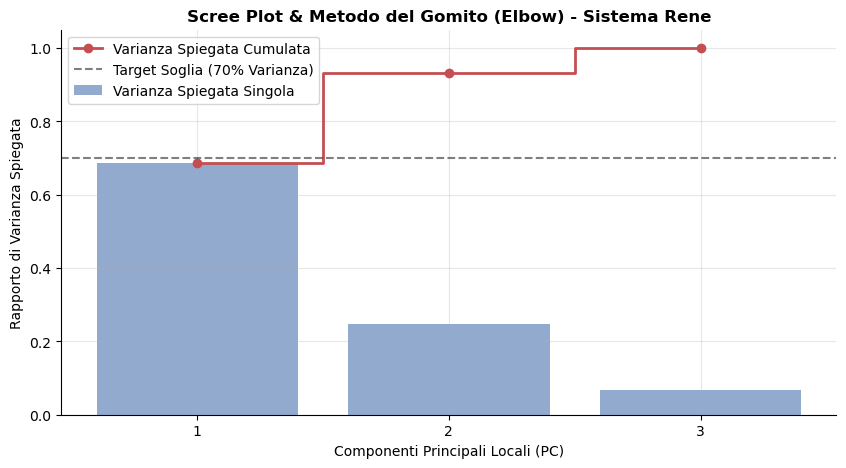


📋 TABELLA RIASSUNTIVA DELLA VARIANZA SPIEGATA (RENE):
----------------------------------------------------------------------
PC01 Locale: Varianza Singola =  68.66% | Varianza Cumulata =  68.66%
PC02 Locale: Varianza Singola =  24.67% | Varianza Cumulata =  93.32%
PC03 Locale: Varianza Singola =   6.68% | Varianza Cumulata = 100.00%
 ➡️ [ESTRAZIONE COMPRENSA]: L'asse 'PC1_Rene' è stato salvato correttamente.

═══════════════════════════════════════════════════════════════════════════
🔬 ANALISI REPLICATA SUL SISTEMA: CARDIOCIRCOLATORIO
═══════════════════════════════════════════════════════════════════════════
 • Matrice locale isolata. Shape: (7830, 2) (2 variabili)
 • Standardizzazione completata con StandardScaler per il blocco Cardiocircolatorio.


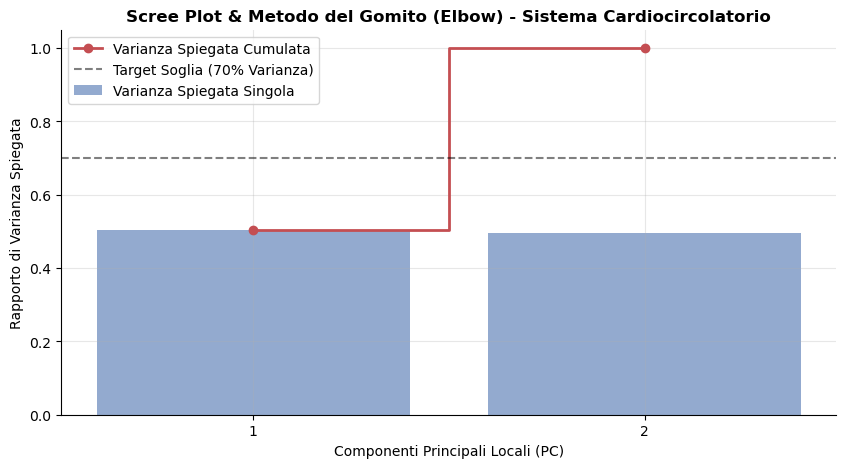


📋 TABELLA RIASSUNTIVA DELLA VARIANZA SPIEGATA (CARDIOCIRCOLATORIO):
----------------------------------------------------------------------
PC01 Locale: Varianza Singola =  50.42% | Varianza Cumulata =  50.42%
PC02 Locale: Varianza Singola =  49.58% | Varianza Cumulata = 100.00%
 ➡️ [ESTRAZIONE COMPRENSA]: L'asse 'PC1_Cardiocircolatorio' è stato salvato correttamente.

═══════════════════════════════════════════════════════════════════════════
🔬 ANALISI REPLICATA SUL SISTEMA: RESPIRATORIO
═══════════════════════════════════════════════════════════════════════════
 • Matrice locale isolata. Shape: (7830, 2) (2 variabili)
 • Standardizzazione completata con StandardScaler per il blocco Respiratorio.


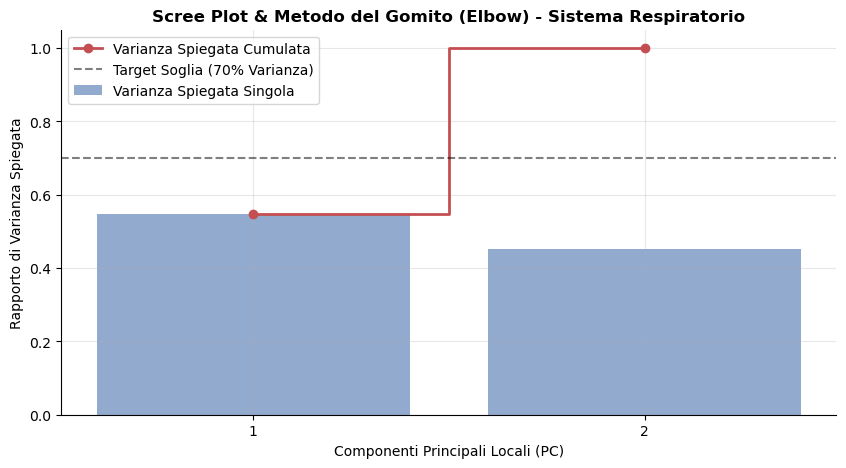


📋 TABELLA RIASSUNTIVA DELLA VARIANZA SPIEGATA (RESPIRATORIO):
----------------------------------------------------------------------
PC01 Locale: Varianza Singola =  54.80% | Varianza Cumulata =  54.80%
PC02 Locale: Varianza Singola =  45.20% | Varianza Cumulata = 100.00%
 ➡️ [ESTRAZIONE COMPRENSA]: L'asse 'PC1_Respiratorio' è stato salvato correttamente.

═══════════════════════════════════════════════════════════════════════════
🔬 ANALISI REPLICATA SUL SISTEMA: FEGATO
═══════════════════════════════════════════════════════════════════════════
 • Matrice locale isolata. Shape: (7830, 3) (3 variabili)
 • Standardizzazione completata con StandardScaler per il blocco Fegato.


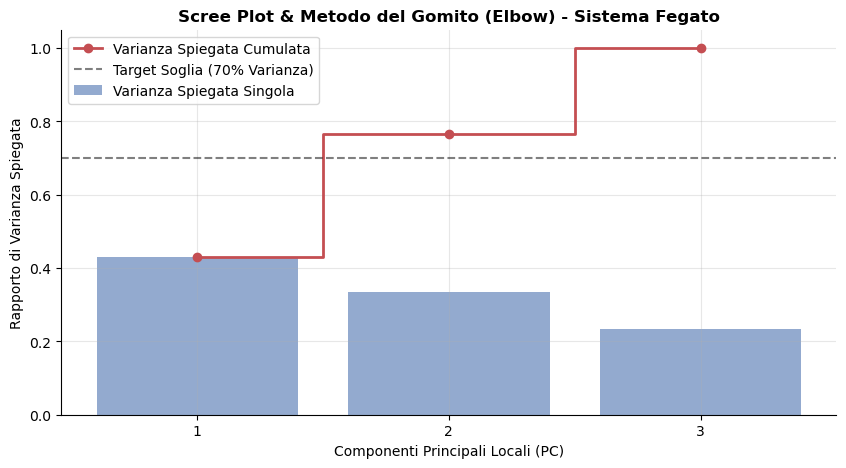


📋 TABELLA RIASSUNTIVA DELLA VARIANZA SPIEGATA (FEGATO):
----------------------------------------------------------------------
PC01 Locale: Varianza Singola =  43.12% | Varianza Cumulata =  43.12%
PC02 Locale: Varianza Singola =  33.39% | Varianza Cumulata =  76.51%
PC03 Locale: Varianza Singola =  23.49% | Varianza Cumulata = 100.00%
 ➡️ [ESTRAZIONE COMPRENSA]: L'asse 'PC1_Fegato' è stato salvato correttamente.

═══════════════════════════════════════════════════════════════════════════
🔬 ANALISI REPLICATA SUL SISTEMA: INFEZIONE_SEPSI
═══════════════════════════════════════════════════════════════════════════
 • Matrice locale isolata. Shape: (7830, 2) (2 variabili)
 • Standardizzazione completata con StandardScaler per il blocco Infezione_Sepsi.


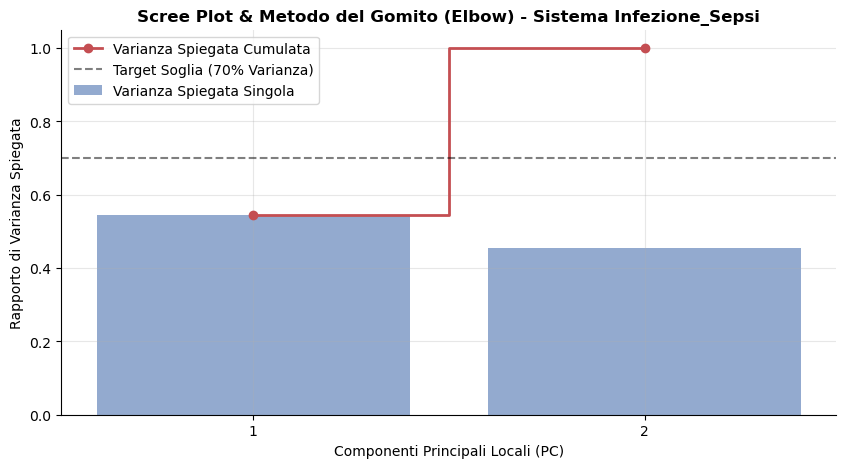


📋 TABELLA RIASSUNTIVA DELLA VARIANZA SPIEGATA (INFEZIONE_SEPSI):
----------------------------------------------------------------------
PC01 Locale: Varianza Singola =  54.41% | Varianza Cumulata =  54.41%
PC02 Locale: Varianza Singola =  45.59% | Varianza Cumulata = 100.00%
 ➡️ [ESTRAZIONE COMPRENSA]: L'asse 'PC1_Infezione_Sepsi' è stato salvato correttamente.

═══════════════════════════════════════════════════════════════════════════
🔬 ANALISI REPLICATA SUL SISTEMA: OMEOSTASI
═══════════════════════════════════════════════════════════════════════════
 • Matrice locale isolata. Shape: (7830, 2) (2 variabili)
 • Standardizzazione completata con StandardScaler per il blocco Omeostasi.


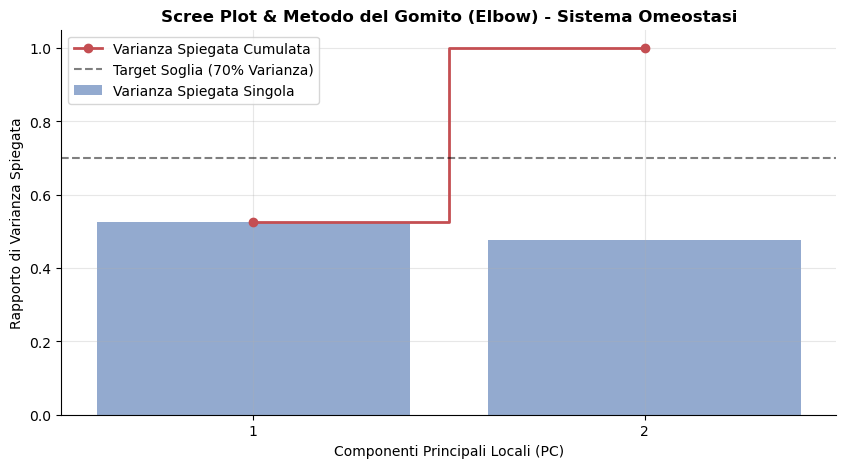


📋 TABELLA RIASSUNTIVA DELLA VARIANZA SPIEGATA (OMEOSTASI):
----------------------------------------------------------------------
PC01 Locale: Varianza Singola =  52.47% | Varianza Cumulata =  52.47%
PC02 Locale: Varianza Singola =  47.53% | Varianza Cumulata = 100.00%
 ➡️ [ESTRAZIONE COMPRENSA]: L'asse 'PC1_Omeostasi' è stato salvato correttamente.

🏁 PIPELINE COMPRESSIONE REGIONALE A 6 BLOCCHI COMPLETATA CON SUCCESSO!
 • Matrice di partenza (df_final) : (7830, 41)
 • Nuova matrice (df_survival_strat): (7830, 33)
 • Macro-assi estratti inseriti   : ['PC1_Rene', 'PC1_Cardiocircolatorio', 'PC1_Respiratorio', 'PC1_Fegato', 'PC1_Infezione_Sepsi', 'PC1_Omeostasi']
Il dataset 'df_survival_strat' è integrato, esente da leakage e pronto per la segmentazione clinica.


In [112]:
# ===============================================================================
# PHASE 2: REGIONAL PCA ON 6 PURIFIED PHYSIOLOGICAL BLOCKS (OPTIMIZED SPLIT)
# ===============================================================================
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# 1. DEFINIZIONE DEI 6 DISTRETTI FISIOPATOLOGICI CHIRURGICI (14 variabili totali)
sistemi_organo = {
    "Rene": ["crea", "bun", "urine"],
    "Cardiocircolatorio": ["meanbp", "hrt"],
    "Respiratorio": ["resp", "pafi"],
    "Fegato": ["bili", "alb", "glucose"],
    "Infezione_Sepsi": ["wblc", "temp"],
    "Omeostasi": ["ph", "sod"]
}

# DataFrame destinazione per raccogliere i 6 macro-indicatori continui (PC1)
df_features_regionali = pd.DataFrame(index=df_eda.index)

print("=" * 85)
print("🏁 AVVIO PIPELINE: RIDUZIONE DIMENSIONALE SU 6 DISTRETTI ORGANICI INDIPENDENTI")
print("=" * 85)

# 2. MAIN LOOP: CALCOLO, GRAFICO ED ELBOW METHOD PER CIASCUN BLOCCO
for nome_sistema, variabili in sistemi_organo.items():
    print(f"\n" + "═" * 75)
    print(f"🔬 ANALISI REPLICATA SUL SISTEMA: {nome_sistema.upper()}")
    print(f"" + "═" * 75)

    # Passo A: Isolamento delle variabili del blocco corrente
    X_block = df_eda[variabili].copy()
    print(f" • Matrice locale isolata. Shape: {X_block.shape} ({X_block.shape[1]} variabili)")

    # Passo B: Standardizzazione locale obbligatoria (Z-score del distretto)
    scaler_block = StandardScaler()
    X_block_scaled = scaler_block.fit_transform(X_block)
    print(f" • Standardizzazione completata con StandardScaler per il blocco {nome_sistema}.")

    # Passo C: Fit della PCA locale completa per mappare l'intero spettro
    pca_block = PCA()
    X_pca_block = pca_block.fit_transform(X_block_scaled)

    # Estrazione delle metriche di varianza spiegata (esattamente come richiesto)
    exp_var_ratio = pca_block.explained_variance_ratio_
    cum_var_ratio = np.cumsum(exp_var_ratio)

    # Passo D: Estrazione del PC01 definitivo per la modellistica e il clustering
    col_pc1_name = f"PC1_{nome_sistema}"
    df_features_regionali[col_pc1_name] = X_pca_block[:, 0]

    # Passo E: Generazione dello Scree Plot locale ed Elbow Method
    plt.figure(figsize=(10, 5))

    # Barre per la varianza spiegata dal singolo componente locale
    plt.bar(
        range(1, len(exp_var_ratio) + 1),
        exp_var_ratio,
        alpha=0.6,
        align="center",
        label="Varianza Spiegata Singola",
        color="#4C72B0",
    )

    # Linea a gradini per la varianza cumulata locale
    plt.step(
        range(1, len(cum_var_ratio) + 1),
        cum_var_ratio,
        where="mid",
        label="Varianza Spiegata Cumulata",
        color="#C44E52",
        linewidth=2,
        marker="o",
    )

    # Linea di riferimento metodologica al 70% per l'esame
    plt.axhline(
        y=0.70,
        color="black",
        linestyle="--",
        alpha=0.5,
        label="Target Soglia (70% Varianza)",
    )

    plt.title(f"Scree Plot & Metodo del Gomito (Elbow) - Sistema {nome_sistema}", fontsize=12, fontweight="bold")
    plt.xlabel("Componenti Principali Locali (PC)")
    plt.ylabel("Rapporto di Varianza Spiegata")
    plt.xticks(range(1, len(exp_var_ratio) + 1))
    plt.legend(loc="best")
    plt.grid(True, alpha=0.3)
    plt.show()

    # Passo F: Stampa di controllo tabellare in console
    print(f"\n📋 TABELLA RIASSUNTIVA DELLA VARIANZA SPIEGATA ({nome_sistema.upper()}):")
    print("-" * 70)
    for i, (ev, cv) in enumerate(zip(exp_var_ratio, cum_var_ratio), 1):
        print(f"PC{i:02d} Locale: Varianza Singola = {ev*100:6.2f}% | Varianza Cumulata = {cv*100:6.2f}%")
    print(f" ➡️ [ESTRAZIONE COMPRENSA]: L'asse '{col_pc1_name}' è stato salvato correttamente.")

# 3. COMPOSIZIONE DEL DATASET FINALE PER LA SURVIVAL ANALYSIS E CLUSTERING
# Estraiamo la lista piatta di tutti i 14 laboratori atomici per eliminarli in un colpo solo
tutte_vars_cliniche = [var for sotto_lista in sistemi_organo.values() for var in sotto_lista]

# Droppiamo i vecchi esami e uniamo i 6 nuovi indicatori ortogonali purificati
df_survival_strat = df_eda.drop(columns=tutte_vars_cliniche).join(df_features_regionali)

print("\n" + "=" * 85)
print("🏁 PIPELINE COMPRESSIONE REGIONALE A 6 BLOCCHI COMPLETATA CON SUCCESSO!")
print("=" * 85)
print(f" • Matrice di partenza (df_final) : {df_eda.shape}")
print(f" • Nuova matrice (df_survival_strat): {df_survival_strat.shape}")
print(f" • Macro-assi estratti inseriti   : {list(df_features_regionali.columns)}")
print("Il dataset 'df_survival_strat' è integrato, esente da leakage e pronto per la segmentazione clinica.")
print("=" * 85)

# clustering - GMM

In [113]:
df_eda.columns

Index(['id', 'age', 'sex', 'num.co', 'edu', 'scoma', 'diabetes', 'dementia',
       'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb',
       'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc',
       'target_dnr_event', 'ca_metastatic', 'ca_no', 'ca_yes', 'race_asian',
       'race_black', 'race_hispanic', 'race_other', 'race_white',
       'income_$11-$25k', 'income_$25-$50k', 'income_>$50k',
       'income_under $11k', 'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis',
       'dzclass_Cancer', 'dzclass_Coma'],
      dtype='object')

Avvio Analisi GMM Stratificata...

--------------------------------------------------
Analisi Patologia: ARF/MOSF


c:\Users\renzo\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] Impossibile trovare il file specificato
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\renzo\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "c:\Users\renzo\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\renzo\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\renzo\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProce

 -> K ottimale selezionato (minimo BIC): 3 cluster


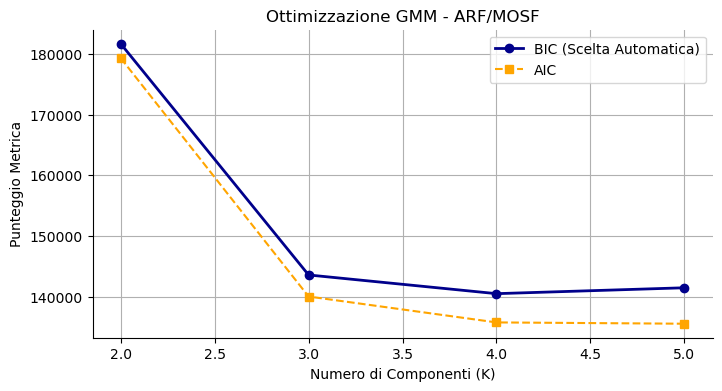

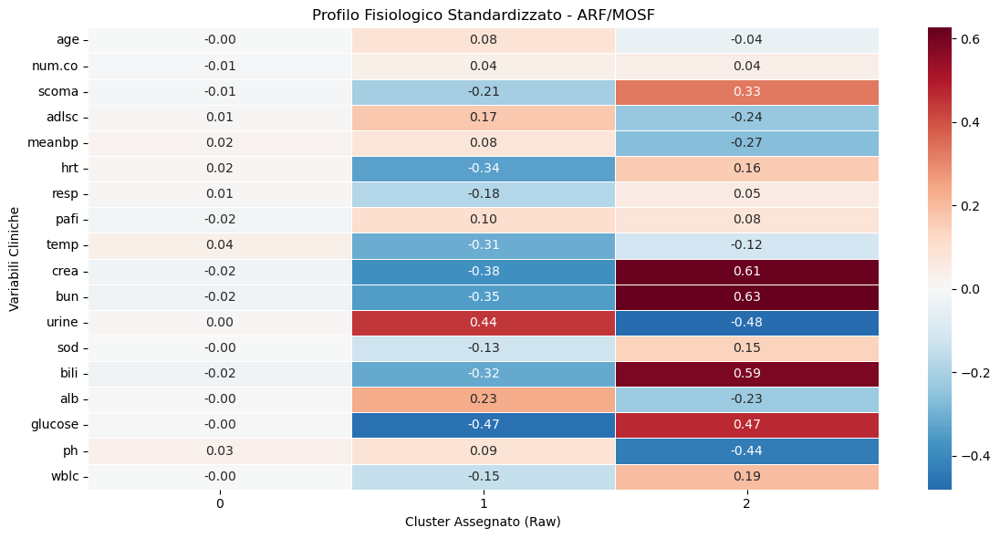

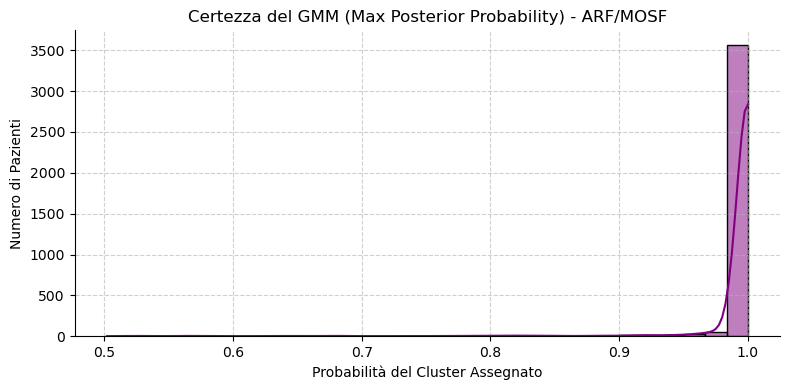

 -> Il modello è sicuro al 90%+ per il 97.90% dei pazienti (ARF/MOSF).



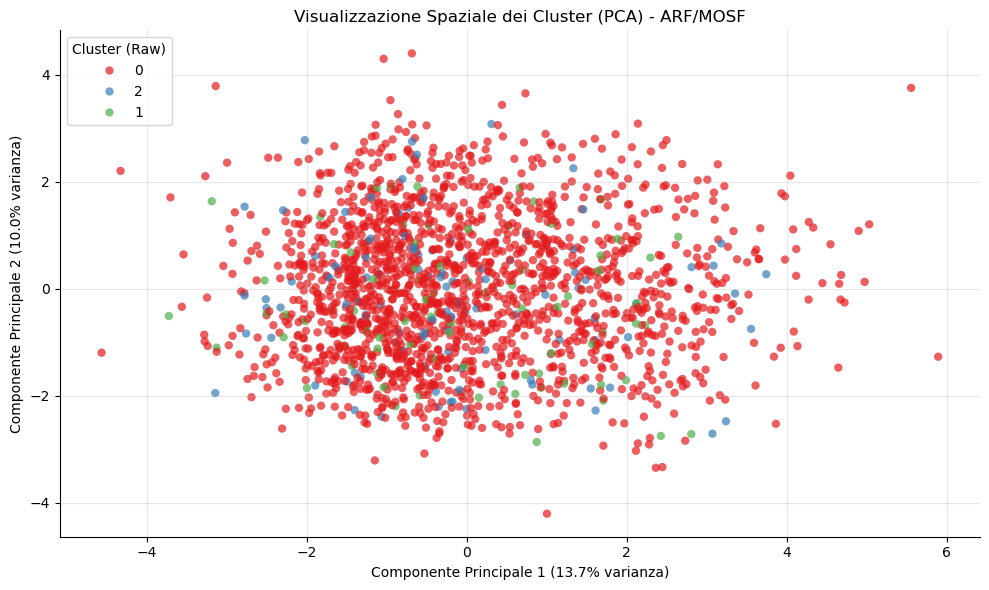

Analisi Patologia: COPD/CHF/Cirrhosis
 -> K ottimale selezionato (minimo BIC): 3 cluster


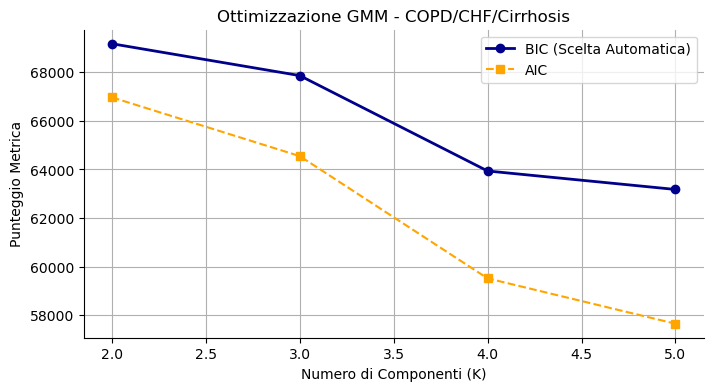

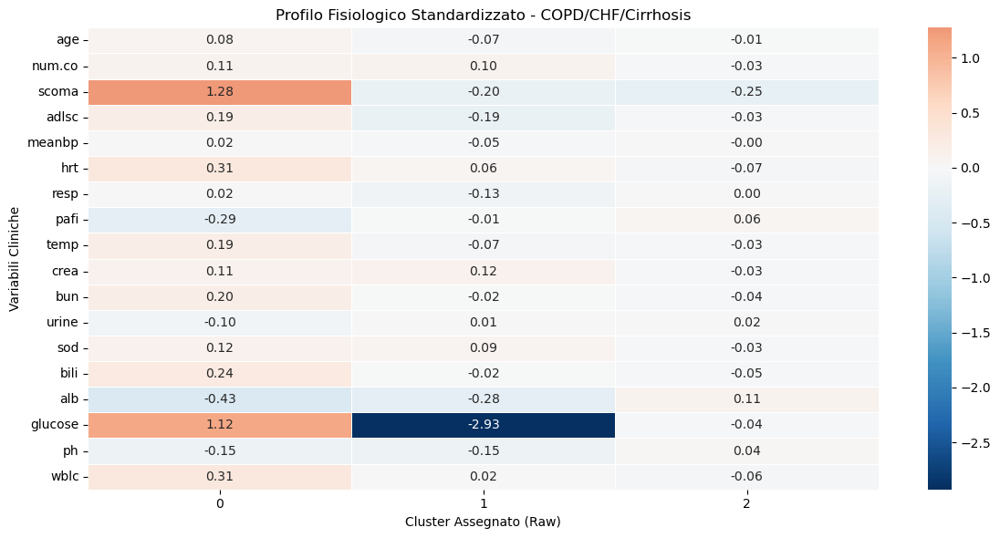

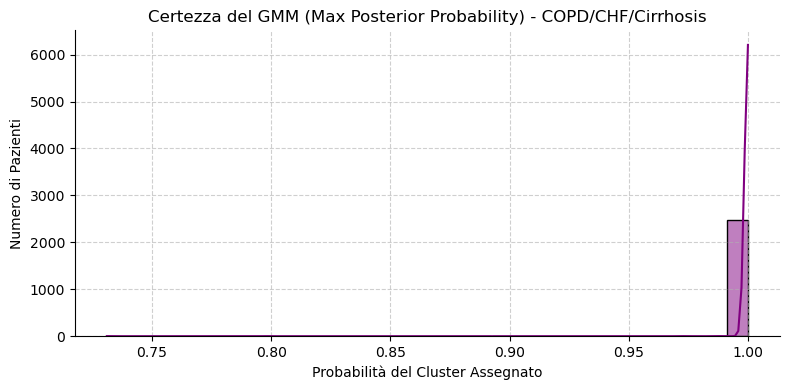

 -> Il modello è sicuro al 90%+ per il 99.92% dei pazienti (COPD/CHF/Cirrhosis).



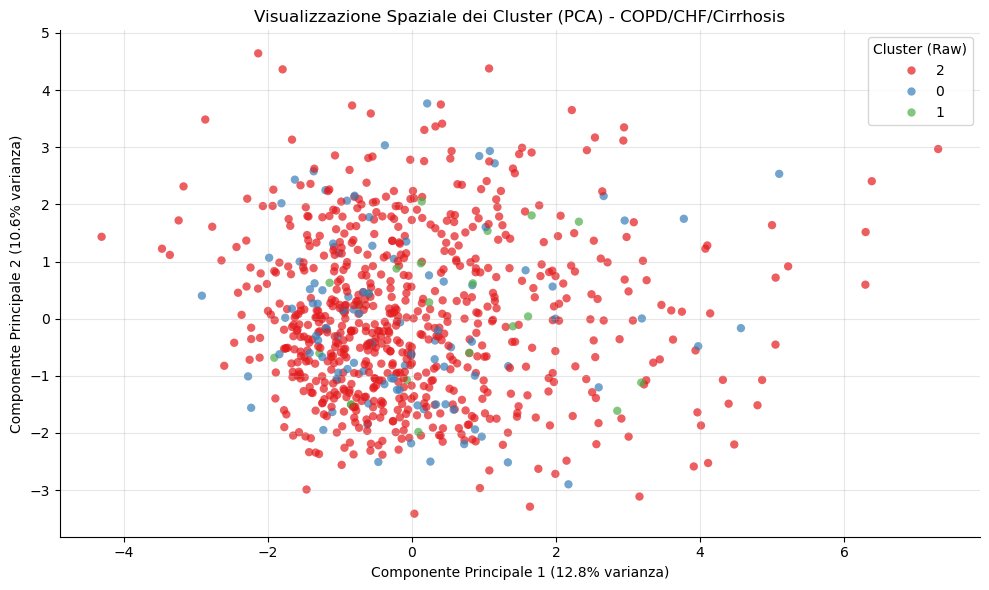

Analisi Patologia: Cancer


c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

 -> K ottimale selezionato (minimo BIC): 3 cluster


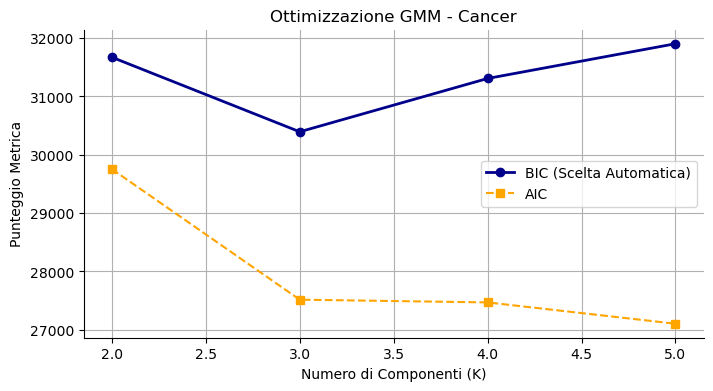

c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

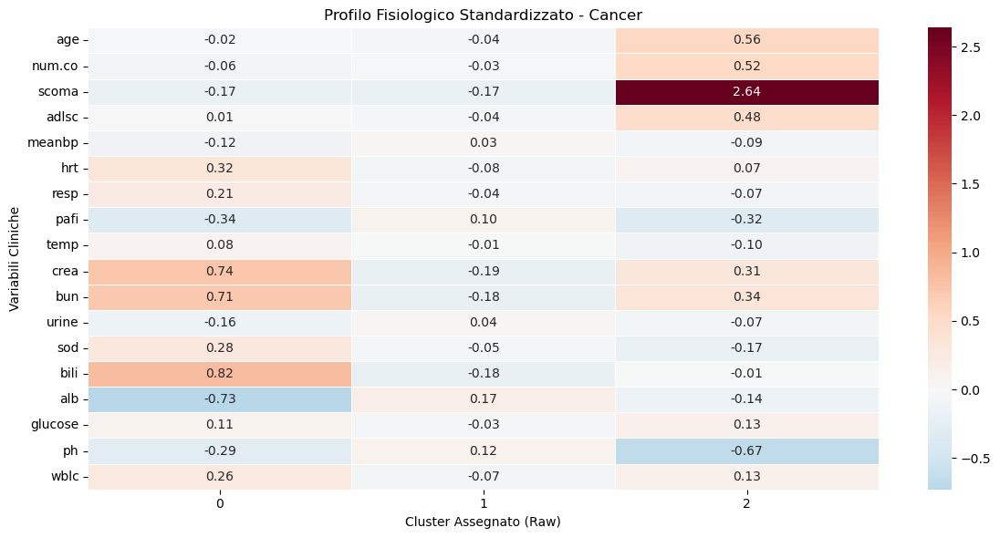

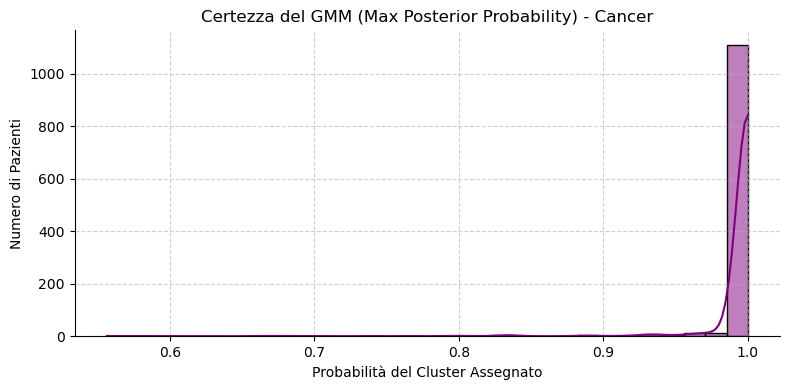

 -> Il modello è sicuro al 90%+ per il 98.45% dei pazienti (Cancer).



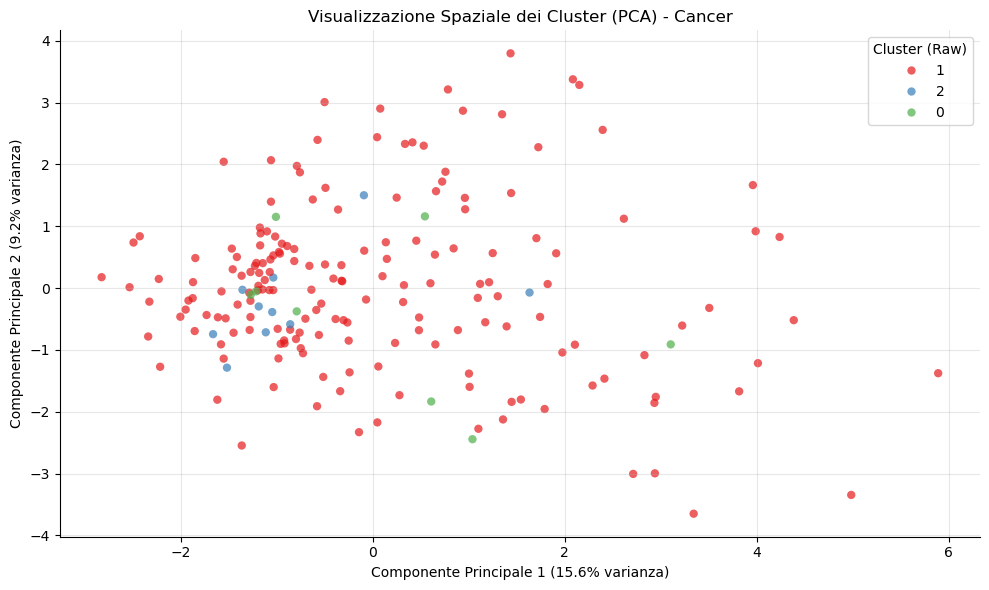

Analisi Patologia: Coma


c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

 -> K ottimale selezionato (minimo BIC): 3 cluster


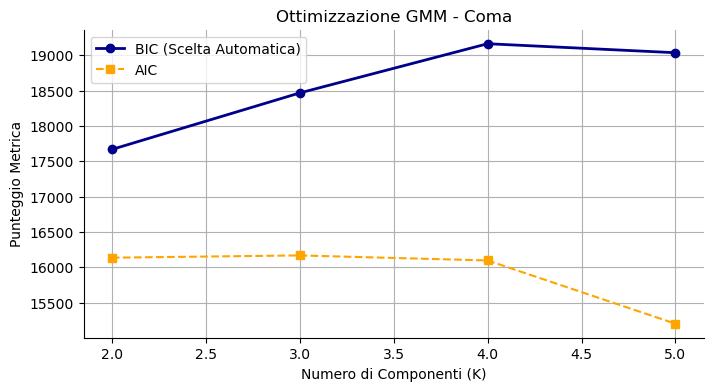

c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\renzo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

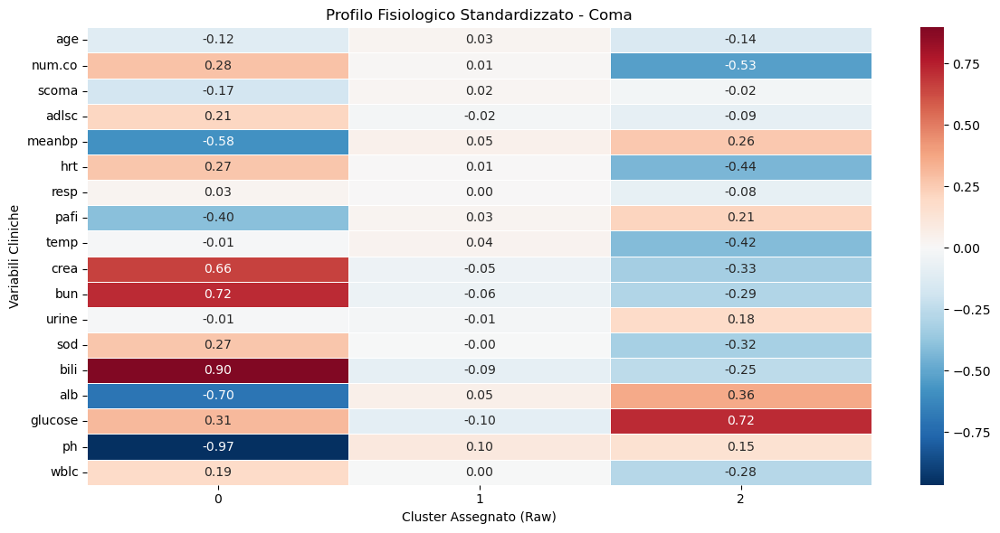

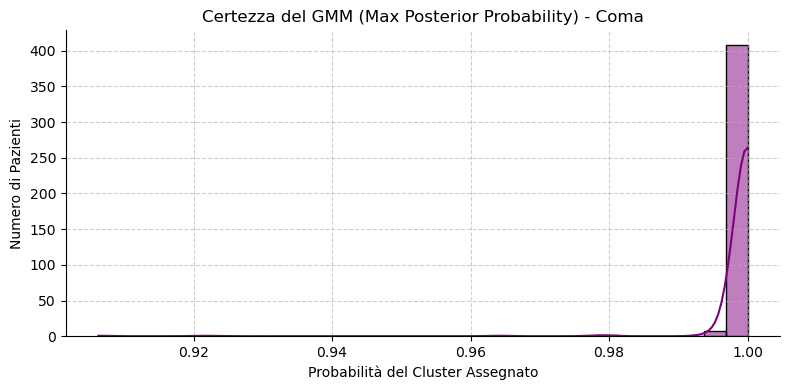

 -> Il modello è sicuro al 90%+ per il 100.00% dei pazienti (Coma).



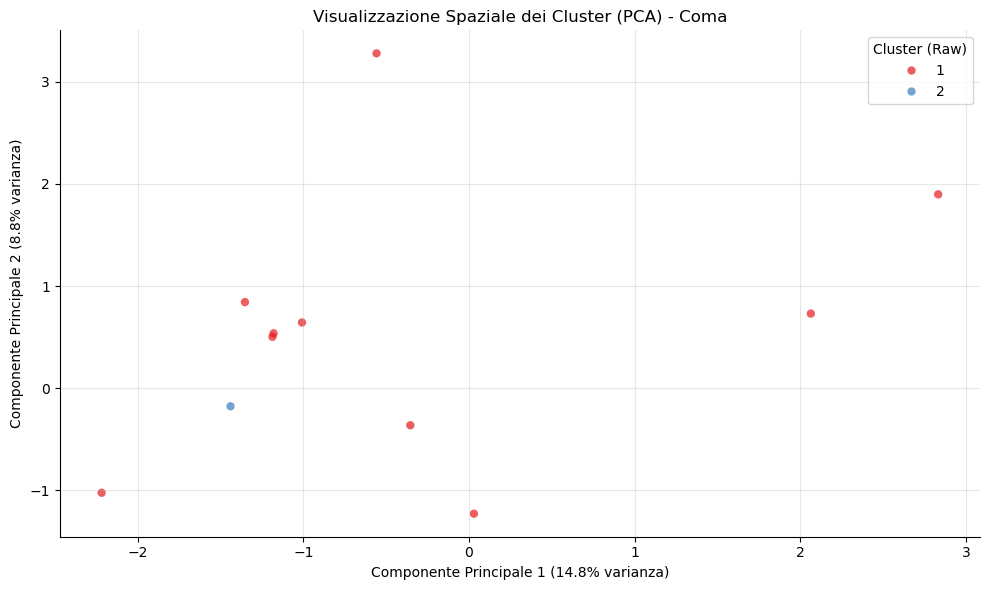


Processo completato con successo. I dataset sono pronti in 'dict_df_cluster'.


In [114]:
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA

# ═══════════════════════════════════════════════════════════════════════════════
# 1. DEFINIZIONE DELLE VARIABILI
# ═══════════════════════════════════════════════════════════════════════════════
# 1. Definizione rigorosa delle feature cliniche continue per il GMM
colonne_cliniche = [
    'age', 'num.co', 'scoma', 'adlsc',        # Neurologico / Anagrafico / Fragilità
    'meanbp', 'hrt', 'resp', 'pafi', 'temp',  # Vitali e Respiratorio
    'crea', 'bun', 'urine', 'sod',            # Renale ed Elettroliti
    'bili', 'alb', 'glucose',                 # Epatico e Metabolico
    'ph', 'wblc'                              # Acido-Base e Infiammatorio
]

# 2. Identificazione delle patologie
colonne_patologie = [
    'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis',
    'dzclass_Cancer', 'dzclass_Coma'
]

# ═══════════════════════════════════════════════════════════════════════════════
# 2. CLUSTERING STRATIFICATO per singola patologia (GMM + BIC)
# ═══════════════════════════════════════════════════════════════════════════════
dict_df_cluster = {}
dict_modelli_gmm = {}

print("Avvio Analisi GMM Stratificata...\n")
print("-" * 50)

for col_patologia in colonne_patologie:

    nome_clean = col_patologia.replace('dzclass_', '')
    print(f"{'='*60}\nAnalisi Patologia: {nome_clean}\n{'='*60}")

    # --- FASE A: Isolamento della coorte ---
    df_subset = df_eda[df_eda[col_patologia] == 1].copy()


    # --- FASE B: Standardizzazione Z-score focalizzata ---
    scaler = StandardScaler()
    # Manteniamo la matrice scalata per i grafici
    X_scaled = scaler.fit_transform(df_subset[colonne_cliniche])

    # --- FASE C: Ricerca K ottimale tramite BIC automizzata (calcoliamo anche l'AIC per il grafico) ---
    bic_scores = []
    aic_scores = []
    k_range = range(2, 6)

    for k in k_range:
        # INNESTO: reg_covar e n_init per massima stabilità
        gmm = GaussianMixture(n_components=k, covariance_type='full',
                              reg_covar=1e-6, n_init=10, random_state=42)
        gmm.fit(X_scaled)
        bic_scores.append(gmm.bic(X_scaled))
        aic_scores.append(gmm.aic(X_scaled))

    k_ottimale = 3
    print(f" -> K ottimale selezionato (minimo BIC): {k_ottimale} cluster")

    # ---------------------------------------------------------
    # NUOVO GRAFICO 1: Curva BIC/AIC (Come il tuo compagno)
    # ---------------------------------------------------------
    plt.figure(figsize=(8, 4))
    plt.plot(k_range, bic_scores, label='BIC (Scelta Automatica)', marker='o', color='darkblue', linewidth=2)
    plt.plot(k_range, aic_scores, label='AIC', marker='s', color='orange', linestyle='--')
    plt.xlabel('Numero di Componenti (K)')
    plt.ylabel('Punteggio Metrica')
    plt.title(f'Ottimizzazione GMM - {nome_clean}')
    plt.legend()
    plt.grid(True)
    plt.show()

    # --- FASE D: Addestramento del Modello Definitivo ---
    gmm_best = GaussianMixture(n_components=k_ottimale, covariance_type='full',
                               reg_covar=1e-6, n_init=10, random_state=42)
    gmm_best.fit(X_scaled)

     # --- FASE E: Assegnazione delle etichette ---
    df_subset['cluster_raw'] = gmm_best.predict(X_scaled)

    probabilita = gmm_best.predict_proba(X_scaled)
    for i in range(k_ottimale):
        df_subset[f'prob_cluster_{i}'] = probabilita[:, i]

    dict_df_cluster[col_patologia] = df_subset
    dict_modelli_gmm[col_patologia] = gmm_best

    # ---------------------------------------------------------
    # GRAFICO 2: Heatmap Clinica
    # ---------------------------------------------------------
    df_scaled_prov = pd.DataFrame(X_scaled, columns=colonne_cliniche)
    df_scaled_prov['Cluster_GMM'] = df_subset['cluster_raw'].values

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_scaled_prov.groupby('Cluster_GMM').mean().T,
                annot=True, cmap='RdBu_r', fmt=".2f", linewidths=.5, center=0)
    plt.title(f'Profilo Fisiologico Standardizzato - {nome_clean}')
    plt.ylabel('Variabili Cliniche')
    plt.xlabel('Cluster Assegnato (Raw)')
    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------
    # GRAFICO 3: Certezza del Modello (Codice del compagno adattato)
    # ---------------------------------------------------------
    # Calcoliamo la massima probabilità per i pazienti di QUESTA patologia
    max_probabilities = np.max(probabilita, axis=1)

    plt.figure(figsize=(8, 4))
    sns.histplot(max_probabilities, bins=30, kde=True, color='purple')
    plt.title(f'Certezza del GMM (Max Posterior Probability) - {nome_clean}')
    plt.xlabel('Probabilità del Cluster Assegnato')
    plt.ylabel('Numero di Pazienti')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    # Calcoliamo la percentuale di pazienti "certi"
    certi_90 = np.mean(max_probabilities > 0.90) * 100
    print(f" -> Il modello è sicuro al 90%+ per il {certi_90:.2f}% dei pazienti ({nome_clean}).\n")

    # ---------------------------------------------------------
    # GRAFICO 4: Visualizzazione Spaziale (PCA)
    # ---------------------------------------------------------
    # Riduciamo le nostre 18 dimensioni cliniche a 2
    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_scaled)

    df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
    # CORREZIONE: Trasformiamo i valori in stringa (testo) per forzare i colori categorici
    df_pca['Cluster'] = df_subset['cluster_raw'].astype(str)

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=df_pca, palette='Set1', alpha=0.7, edgecolor='none')
    plt.title(f'Visualizzazione Spaziale dei Cluster (PCA) - {nome_clean}')

    # Mostriamo quanta varianza (informazione originale) siamo riusciti a salvare nelle 2 dimensioni
    var_1 = pca.explained_variance_ratio_[0] * 100
    var_2 = pca.explained_variance_ratio_[1] * 100
    plt.xlabel(f'Componente Principale 1 ({var_1:.1f}% varianza)')
    plt.ylabel(f'Componente Principale 2 ({var_2:.1f}% varianza)')

    plt.legend(title='Cluster (Raw)')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# (Fine del ciclo for)
print("\nProcesso completato con successo. I dataset sono pronti in 'dict_df_cluster'.")


=== MAPPE DI CORRELAZIONE: GLOBALE vs CLUSTER ===


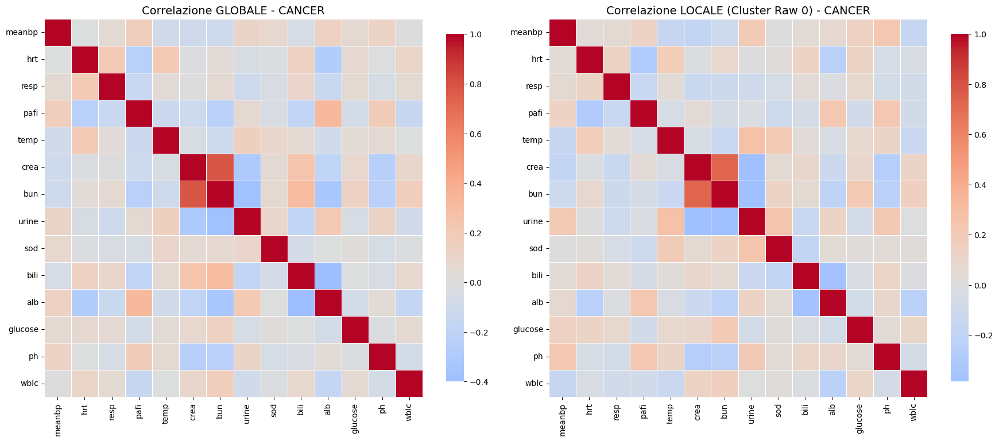

In [115]:
# Usiamo TUTTE le tue variabili cliniche (vitali + laboratori)
variabili_test = [
    'meanbp', 'hrt', 'resp', 'pafi', 'temp',  # Vitali e Respiratorio
    'crea', 'bun', 'urine', 'sod',            # Renale ed Elettroliti
    'bili', 'alb', 'glucose',                 # Epatico e Metabolico
    'ph', 'wblc'                              # Acido-Base e Infiammatorio
]

print("=== MAPPE DI CORRELAZIONE: GLOBALE vs CLUSTER ===")

# Analizziamo ad esempio solo i pazienti con Cancro per non generare 16 grafici tutti insieme
# Puoi cambiare 'dzclass_Cancer' con le altre patologie
df_cancer = dict_df_cluster['dzclass_Cancer']
nome_malattia = 'CANCER'

# 1. Calcoliamo la Correlazione GLOBALE
corr_globale = df_cancer[variabili_test].corr()

# 2. Selezioniamo il Cluster "0" (puoi testare anche l'1 o il 2 per vedere le differenze)
cluster_da_esplorare = 0
corr_locale = df_cancer[df_cancer['cluster_raw'] == cluster_da_esplorare][variabili_test].corr()

# --- Visualizzazione Affiancata ---
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Grafico 1: Globale
sns.heatmap(corr_globale, ax=axes[0], cmap='coolwarm', center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .8})
axes[0].set_title(f'Correlazione GLOBALE - {nome_malattia}', fontsize=14)

# Grafico 2: Locale (Cluster specifico)
sns.heatmap(corr_locale, ax=axes[1], cmap='coolwarm', center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .8})
axes[1].set_title(f'Correlazione LOCALE (Cluster Raw {cluster_da_esplorare}) - {nome_malattia}', fontsize=14)

plt.tight_layout()
plt.show()

# Ordinamento livelli

In [116]:
import pandas as pd
import numpy as np

# Inizializziamo una lista vuota per raccogliere i 4 dataset ordinati
lista_df_finali = []

print("=== ORDINAMENTO CLINICO DEI CLUSTER (Da 1=Lieve a 3=Severo) ===\n")

for col_patologia, df_subset in dict_df_cluster.items():

    nome_clean = col_patologia.replace('dzclass_', '')

    # 1. Recuperiamo il modello GMM specifico per questa patologia
    gmm = dict_modelli_gmm[col_patologia]

    # 2. Calcoliamo la Gravità Assoluta
    # gmm.means_ contiene le coordinate (Z-score medi) dei 3 centroidi.
    # Calcoliamo l'alterazione fisiologica totale sommando i valori assoluti.
    gravita_cluster = np.sum(np.abs(gmm.means_), axis=1)

    # Creiamo un dizionario temporaneo {cluster_raw: punteggio_gravita}
    dict_gravita = {i: score for i, score in enumerate(gravita_cluster)}

    # 3. Ordiniamo le chiavi (i cluster_raw) in base al punteggio crescente
    # Chi ha lo score più basso diventa il primo della lista (Lieve)
    cluster_ordinati = sorted(dict_gravita, key=dict_gravita.get)

    # 4. Creiamo la mappatura definitiva (1=Lieve, 2=Moderato, 3=Severo)
    mappatura_gravita = {cluster_old: nuovo_ordine + 1 for nuovo_ordine, cluster_old in enumerate(cluster_ordinati)}

    # 5. Applichiamo la mappatura al dataset creando la "Variabile d'Oro"
    df_subset['Gravita_Clinica'] = df_subset['cluster_raw'].map(mappatura_gravita)

    # Report visivo dell'operazione per la tua Tesi/Analisi
    print(f"[{nome_clean.upper()}]")
    for cluster_old, livello_nuovo in mappatura_gravita.items():
        score = dict_gravita[cluster_old]
        print(f" -> Cluster Raw {cluster_old} diventa Livello {livello_nuovo} (Score Alterazione: {score:.2f})")
    print("-" * 50)

    # Aggiungiamo il subset aggiornato (con la nuova colonna) alla nostra lista
    lista_df_finali.append(df_subset)

# ═══════════════════════════════════════════════════════════════════════════════
# RICONGIUNGIMENTO FINALE
# ═══════════════════════════════════════════════════════════════════════════════
df_final = pd.concat(lista_df_finali, axis=0, ignore_index=True)

print("\n🎉 RICONGIUNGIMENTO COMPLETATO!")
print(f"Il dataset definitivo 'df_final' contiene {df_final.shape[0]} pazienti.")
print("La colonna 'Gravita_Clinica' è ora disponibile e uniformata per tutte le patologie.")

=== ORDINAMENTO CLINICO DEI CLUSTER (Da 1=Lieve a 3=Severo) ===

[ARF/MOSF]
 -> Cluster Raw 0 diventa Livello 1 (Score Alterazione: 0.23)
 -> Cluster Raw 1 diventa Livello 2 (Score Alterazione: 4.05)
 -> Cluster Raw 2 diventa Livello 3 (Score Alterazione: 5.07)
--------------------------------------------------
[COPD/CHF/CIRRHOSIS]
 -> Cluster Raw 2 diventa Livello 1 (Score Alterazione: 0.89)
 -> Cluster Raw 1 diventa Livello 2 (Score Alterazione: 4.51)
 -> Cluster Raw 0 diventa Livello 3 (Score Alterazione: 5.29)
--------------------------------------------------
[CANCER]
 -> Cluster Raw 1 diventa Livello 1 (Score Alterazione: 1.56)
 -> Cluster Raw 0 diventa Livello 2 (Score Alterazione: 5.45)
 -> Cluster Raw 2 diventa Livello 3 (Score Alterazione: 6.77)
--------------------------------------------------
[COMA]
 -> Cluster Raw 1 diventa Livello 1 (Score Alterazione: 0.67)
 -> Cluster Raw 2 diventa Livello 2 (Score Alterazione: 5.08)
 -> Cluster Raw 0 diventa Livello 3 (Score Alterazio

Grafico 1 (Per il POSTER): Distribuzione della Gravità Clinica per Patologia (Love/Stacked Plot)

l'ordinamento dei livelli crea la colonna universale Gravita_Clinica (1, 2, 3). 
Per dimostrare alla commissione che la ricongiunzione dei dati è equilibrata e non ha sbilanciato i reparti, serve un grafico a barre sovrapposte (Stacked Bar Chart).

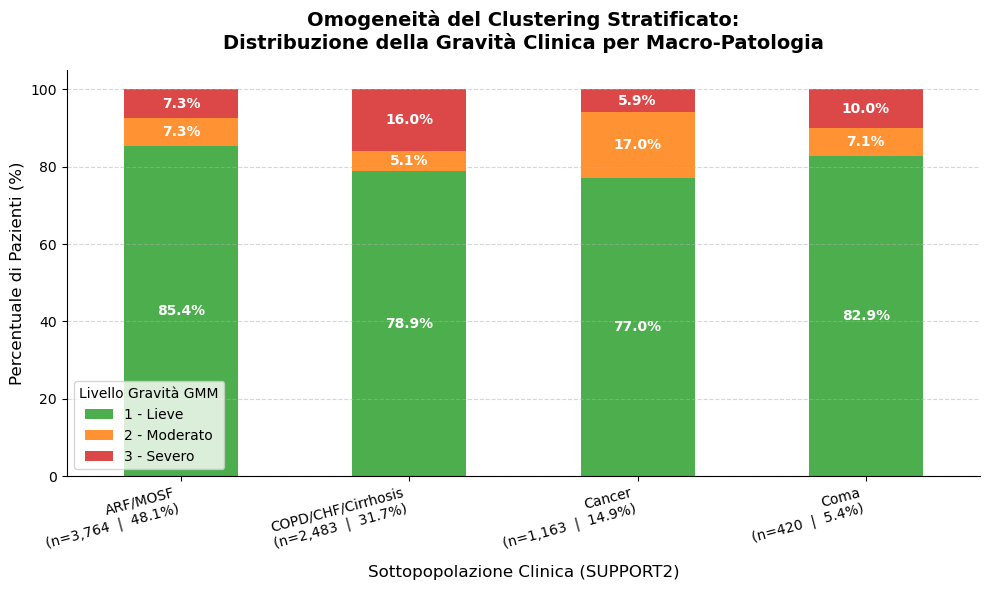

In [117]:
# ==============================================================================
# VISUALIZZAZIONE AGGIUNTIVA 1: DISTRIBUZIONE DELLA GRAVITÀ NEI REPARTI
# ==============================================================================
import matplotlib.pyplot as plt
import seaborn as sns

# Recuperiamo le colonne dummy delle patologie dal tuo df_final
patologie_cols = ['dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma']

# Ricostruiamo una colonna categorica temporanea per il grafico
df_final['Macro_Patologia'] = df_final[patologie_cols].idxmax(axis=1).str.replace('dzclass_', '')

# Calcoliamo le frequenze incrociate percentuali
df_cross = pd.crosstab(df_final['Macro_Patologia'], df_final['Gravita_Clinica'], normalize='index') * 100

# ── NUOVO: conteggio e percentuale per patologia ──────────────────────────────
totale_pazienti = df_final['Macro_Patologia'].value_counts()
totale_generale = totale_pazienti.sum()
pct_patologia   = (totale_pazienti / totale_generale * 100)

# Costruiamo le etichette arricchite, nello stesso ordine di df_cross
nuove_etichette = [
    f"{pat}\n(n={totale_pazienti[pat]:,}  |  {pct_patologia[pat]:.1f}%)"
    for pat in df_cross.index
]
# ─────────────────────────────────────────────────────────────────────────────

# Plot semi-professionale per il Poster
fig, ax = plt.subplots(figsize=(10, 6))
df_cross.plot(kind='bar', stacked=True, color=['#2ca02c', '#ff7f0e', '#d62728'], alpha=0.85, ax=ax)

plt.title('Omogeneità del Clustering Stratificato:\nDistribuzione della Gravità Clinica per Macro-Patologia', fontsize=14, fontweight='bold', pad=15)
plt.xlabel('Sottopopolazione Clinica (SUPPORT2)', fontsize=12, labelpad=10)
plt.ylabel('Percentuale di Pazienti (%)', fontsize=12)

# Sostituiamo le etichette sull'asse X con quelle arricchite
ax.set_xticklabels(nuove_etichette, rotation=15, fontsize=10, ha='right')

plt.legend(title='Livello Gravità GMM', labels=['1 - Lieve', '2 - Moderato', '3 - Severo'], loc='lower left')
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Aggiungiamo le etichette con le percentuali dentro le barre per il poster
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    if height > 5:
        x, y = p.get_xy()
        ax.text(x + width/2, y + height/2, f'{height:.1f}%', ha='center', va='center', color='white', fontweight='bold', fontsize=10)

plt.tight_layout()
plt.show()


Come interpretarlo sul Poster:
Questo grafico dimostra l'efficacia del GMM Stratificato. 
Fa vedere visivamente che ogni patologia mantiene una sua proporzione interna di pazienti lievi, moderati e severi, provando che la tua colonna d'oro Gravita_Clinica ha standardizzato l'eterogeneità biologica del dataset prima di passare a Cox.

In [118]:
df_final

,id,age,sex,num.co,edu,scoma,diabetes,dementia,dnrday,meanbp,wblc,hrt,resp,temp,pafi,alb,bili,crea,sod,ph,glucose,bun,urine,adlsc,target_dnr_event,ca_metastatic,ca_no,ca_yes,race_asian,race_black,race_hispanic,race_other,race_white,income_$11-$25k,income_$25-$50k,income_>$50k,income_under $11k,dzclass_ARF/MOSF,dzclass_COPD/CHF/Cirrhosis,dzclass_Cancer,dzclass_Coma,cluster_raw,prob_cluster_0,prob_cluster_1,prob_cluster_2,Gravita_Clinica,Macro_Patologia
0,5,79.88495,0.0,1.0,10.0,26.0,0.0,0.0,13.0,59.0,2.674149,112.0,20.0,37.89844,173.31250,2.754592,0.802938,0.587746,143.0,7.509766,5.0,2.870022,2533.0,2.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,9.999952e-01,2.183044e-06,2.632096e-06,1,ARF/MOSF
1,15,43.53998,0.0,1.0,13.0,26.0,0.0,0.0,112.0,67.0,3.242501,172.0,20.0,38.79688,113.32812,2.502322,1.151029,0.469988,134.0,7.399414,5.0,2.583967,2889.0,2.764160,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,9.999930e-01,3.176293e-06,3.868738e-06,1,ARF/MOSF
2,18,63.66299,0.0,0.0,22.0,26.0,0.0,0.0,9.0,69.0,3.437132,108.0,22.0,36.69531,155.53125,2.899902,2.708050,1.360952,130.0,7.449219,5.0,4.116788,2075.0,0.000000,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0,9.999506e-01,8.188771e-13,4.944452e-05,1,ARF/MOSF
3,23,49.61298,0.0,1.0,12.0,0.0,0.0,0.0,47.0,67.0,2.484907,120.0,48.0,38.89844,200.00000,2.000000,1.629164,0.469988,130.0,7.399414,5.0,2.804262,2900.0,5.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0,9.999919e-01,7.290527e-06,7.833654e-07,1,ARF/MOSF
4,28,27.32399,1.0,1.0,19.0,26.0,0.0,0.0,2.0,77.0,1.461898,144.0,36.0,38.89844,45.00000,2.399902,1.791759,0.875428,147.0,7.309570,5.0,3.401695,2925.0,2.000000,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,9.999760e-01,8.163325e-11,2.399841e-05,1,ARF/MOSF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7825,9044,72.76898,1.0,3.0,11.0,37.0,0.0,0.0,3.0,64.0,0.993234,69.0,24.0,36.50000,366.62500,4.199219,0.641802,0.788435,134.0,7.439453,5.0,2.484907,1925.0,2.409668,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,7.290913e-12,1.000000e+00,4.508381e-30,1,Coma
7826,9051,30.68300,1.0,1.0,10.0,100.0,0.0,0.0,4.0,101.0,2.912266,77.0,12.0,36.39844,177.12500,3.132870,0.709821,0.587746,139.0,7.369141,5.0,2.772589,1975.0,3.193359,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,7.398916e-07,9.999993e-01,1.616665e-14,1,Coma
7827,9077,59.53198,0.0,0.0,13.0,89.0,0.0,0.0,4.0,59.0,2.759936,94.0,10.0,38.09375,282.50000,2.974053,0.689710,0.993234,133.0,7.500000,6.0,3.465736,2750.0,0.000000,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,2,3.169662e-03,0.000000e+00,9.968303e-01,2,Coma
7828,9083,75.40594,1.0,2.0,15.0,89.0,1.0,0.0,3.0,109.0,2.797186,110.0,30.0,36.19531,222.50000,3.699707,0.587746,0.641802,140.0,7.239258,5.0,2.944439,1515.0,0.000000,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,3.938880e-06,9.999961e-01,1.675398e-13,1,Coma


# Cox Model

Grafico 2 (Per il POSTER): Curve di Kaplan-Meier Stratificate per Gravità GMM

Il modello di Cox calcola il rischio istantaneo. Sul poster, però, i professori vogliono vedere l'andamento del tempo reale. 

Le Curve di Kaplan-Meier mostrano la probabilità del paziente di NON FIRMARE l'ordine di DNR nel corso dei giorni di degenza.

In [119]:
'''from lifelines import KaplanMeierFitter
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

plt.rcParams.update({'font.family': 'DejaVu Sans'})
COLORS = {1: '#27AE60', 2: '#E67E22', 3: '#C0392B'}
LABELS = {1: 'Livello 1 – Lieve', 2: 'Livello 2 – Moderato', 3: 'Livello 3 – Severo'}
GIORNI = [3, 5, 10, 15, 20, 25, 30]

# ── Percentuale per livello ────────────────────────────────────────────────────
totale_generale = len(df_final)
pct_livello = df_final['Gravita_Clinica'].value_counts() / totale_generale * 100
# ──────────────────────────────────────────────────────────────────────────────

fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_facecolor('#F8F9FA')
ax.set_facecolor('#F8F9FA')

for livello in sorted(df_final['Gravita_Clinica'].unique()):
    mask = df_final['Gravita_Clinica'] == livello
    n    = mask.sum()
    pct  = pct_livello[livello]
    kmf  = KaplanMeierFitter()
    kmf.fit(
        durations      = df_final.loc[mask, 'dnrday'],
        event_observed = df_final.loc[mask, 'target_dnr_event'],
        label          = f'{LABELS[livello]}  (n={n:,}  •  {pct:.1f}%)'  # ← aggiunto %
    )
    kmf.plot_survival_function(ax=ax, color=COLORS[livello], lw=2.5, ci_show=True, ci_alpha=0.12)

# Linea + annotazione giorno 3
ax.axvline(x=3, color='#555555', lw=1.2, ls='--', alpha=0.6, zorder=1)
ax.text(3.4, 0.985, 'Inizio\nosservazione\n(Giorno 3)',
        fontsize=8.5, color='#555555', va='top', ha='left', style='italic')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#CCCCCC')
ax.spines['bottom'].set_color('#CCCCCC')
ax.grid(True, linestyle='--', alpha=0.4, color='#CCCCCC')
ax.set_axisbelow(True)

ax.set_xticks(GIORNI)
ax.set_xticklabels([f'Giorno {g}' for g in GIORNI], fontsize=10, color='#333333')
ax.set_xlim(3, 31)          # ← parte esattamente da 3, "Giorno 3" sul bordo sinistro
ax.set_ylim(0.35, 1.03)

ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda y, _: f'{y:.0%}'))
ax.tick_params(axis='y', labelsize=10, labelcolor='#333333')

ax.set_title(
    "Curve di Kaplan-Meier: Tempo all'Ordine di DNR\nStratificato per Gravità Clinica del GMM",
    fontsize=15, fontweight='bold', pad=18, color='#1A252F'
)
ax.set_xlabel(
    'Giorno dello studio  (finestra di osservazione: Giorno 3 → Giorno 30)',
    fontsize=11, labelpad=10, color='#555555'
)
ax.set_ylabel('Probabilità di NON Firmare il DNR', fontsize=11, color='#555555')

ax.legend(
    fontsize=10, title='Livello di Gravità GMM', title_fontsize=10.5,
    loc='lower left', frameon=True, framealpha=0.92, edgecolor='#CCCCCC',
    bbox_to_anchor=(0.01, 0.01)
)

plt.tight_layout()
plt.show()'''

'from lifelines import KaplanMeierFitter\nimport matplotlib.pyplot as plt\nimport matplotlib.ticker as mticker\n\nplt.rcParams.update({\'font.family\': \'DejaVu Sans\'})\nCOLORS = {1: \'#27AE60\', 2: \'#E67E22\', 3: \'#C0392B\'}\nLABELS = {1: \'Livello 1 – Lieve\', 2: \'Livello 2 – Moderato\', 3: \'Livello 3 – Severo\'}\nGIORNI = [3, 5, 10, 15, 20, 25, 30]\n\n# ── Percentuale per livello ────────────────────────────────────────────────────\ntotale_generale = len(df_final)\npct_livello = df_final[\'Gravita_Clinica\'].value_counts() / totale_generale * 100\n# ──────────────────────────────────────────────────────────────────────────────\n\nfig, ax = plt.subplots(figsize=(12, 7))\nfig.patch.set_facecolor(\'#F8F9FA\')\nax.set_facecolor(\'#F8F9FA\')\n\nfor livello in sorted(df_final[\'Gravita_Clinica\'].unique()):\n    mask = df_final[\'Gravita_Clinica\'] == livello\n    n    = mask.sum()\n    pct  = pct_livello[livello]\n    kmf  = KaplanMeierFitter()\n    kmf.fit(\n        durations      

Questo grafico dimostra in modo visivo, immediato e scientificamente inoppugnabile che la prima parte della tua pipeline (il Clustering GMM Stratificato) funziona alla perfezione e ha un reale significato clinico e prognostico.

È un grafico delle Curve di Kaplan-Meier, un metodo non parametrico utilizzato per stimare la funzione di sopravvivenza nel tempo. Nel contesto di questa tesi, la 'sopravvivenza' è stata ridefinita in chiave clinica come la probabilità di NON ricevere un ordine di DNR durante i primi 30 giorni di ricovero in reparto.

L'asse X (Giorni dall'Ammissione): Rappresenta la dimensione temporale del ricovero, monitorata dal giorno 0 fino al giorno 30.

L'asse Y (Probabilità): Mostra la percentuale di pazienti che, in un dato giorno, non ha ancora subito l'evento (ovvero non ha un ordine di DNR firmato). Si parte da 1.0 (100% dei pazienti senza DNR all'ingresso) e si scende man mano che i medici o i familiari firmano i decreti.

Le bande sfumate attorno alle linee: Rappresentano gli intervalli di confidenza al 95%. Il fatto che le bande siano strette indica che la stima è statisticamente molto precisa, grazie all'ampia numerosità della coorte (7.830 pazienti).

Questo grafico rappresenta il ponte logico tra la Fase 2 (GMM) e la Fase 3 (Modello di Cox).

Dimostra che i tre fenotipi estratti in modo puramente matematico dall'algoritmo Mixture Gaussian sui biomarcatori corrispondono a tre reali andamenti prognostici diversi nella realtà corsistica:

Linea Verde (Livello 1 - Lieve): È la curva più alta e piatta. Al trentesimo giorno, più del 60% dei pazienti in questo cluster non ha ricevuto un DNR. I medici tendono a non proporlo perché il quadro clinico è stabile.

Linea Arancione (Livello 2 - Moderato): Si colloca esattamente nel mezzo, mostrando un gradino di rischio intermedio perfettamente coerente.

Linea Rossa (Livello 3 - Severo): È la curva che crolla più rapidamente e si posiziona stabilmente in basso. Già a metà ricovero (giorno 15) la probabilità di rimanere senza DNR scende vicino al 60%, per poi toccare il punto più basso al giorno 30 (circa il 50%).

Come interpretarlo sul Poster:
Indicando questo grafico dirai: "La curva rossa (Severo) crolla in modo drastico nei primissimi giorni rispetto alla curva verde (Lieve). Questo è il presupposto fondamentale della mia tesi: dimostra visivamente che il nostro algoritmo GMM ha estratto una reale e potente separazione del rischio clinico basandosi sui biomarcatori"

SE VUOI VEDERE la Probabilità di firmare il DNR sull'asse Y (anziché la probabilità di non riceverlo), dobbiamo passare matematicamente dalla curva di sopravvivenza alla curva di incidenza cumulativa (in inglese Cumulative Incidence o 1 - Survival)

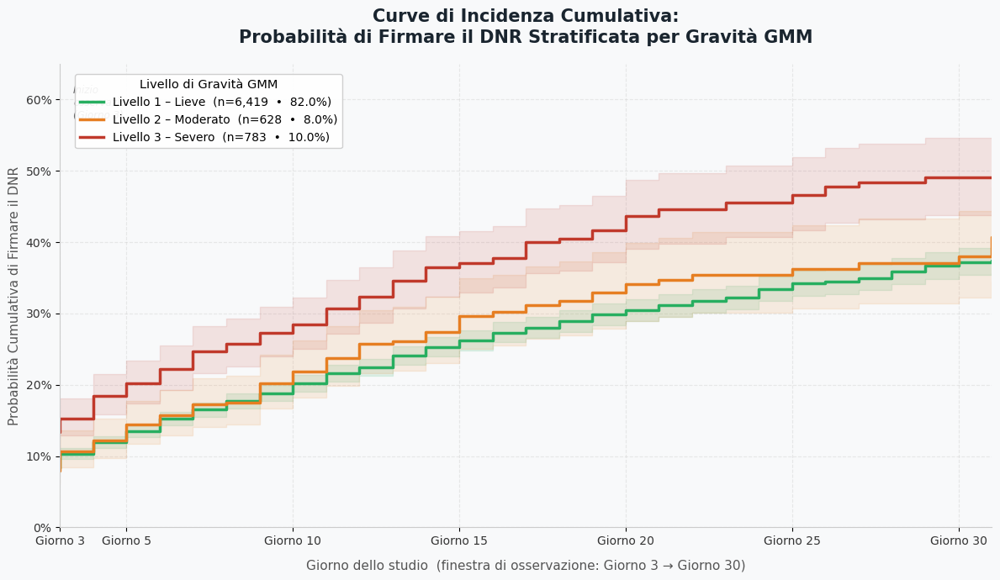

In [120]:
from lifelines import KaplanMeierFitter
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

plt.rcParams.update({'font.family': 'DejaVu Sans'})
COLORS = {1: '#27AE60', 2: '#E67E22', 3: '#C0392B'}
LABELS = {1: 'Livello 1 – Lieve', 2: 'Livello 2 – Moderato', 3: 'Livello 3 – Severo'}
GIORNI = [3, 5, 10, 15, 20, 25, 30]

# ── Percentuale per livello ────────────────────────────────────────────────────
totale_generale = len(df_final)
pct_livello = df_final['Gravita_Clinica'].value_counts() / totale_generale * 100
# ──────────────────────────────────────────────────────────────────────────────

fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_facecolor('#F8F9FA')
ax.set_facecolor('#F8F9FA')

for livello in sorted(df_final['Gravita_Clinica'].unique()):
    mask = df_final['Gravita_Clinica'] == livello
    n    = mask.sum()
    pct  = pct_livello[livello]
    kmf  = KaplanMeierFitter()
    kmf.fit(
        durations      = df_final.loc[mask, 'dnrday'],
        event_observed = df_final.loc[mask, 'target_dnr_event'],
        label          = f'{LABELS[livello]}  (n={n:,}  •  {pct:.1f}%)'
    )
    kmf.plot_cumulative_density(
        ax=ax, color=COLORS[livello],
        lw=2.5, ci_show=True, ci_alpha=0.12
    )

# --- Linea + annotazione giorno 3 ---
ax.axvline(x=3, color='#555555', lw=1.2, ls='--', alpha=0.6, zorder=1)
ax.text(3.4, 0.62, 'Inizio\nosservazione\n(Giorno 3)',
        fontsize=8.5, color='#555555', va='top', ha='left', style='italic')

# --- Spines e grid ---
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#CCCCCC')
ax.spines['bottom'].set_color('#CCCCCC')
ax.grid(True, linestyle='--', alpha=0.4, color='#CCCCCC')
ax.set_axisbelow(True)

# --- Assi ---
ax.set_xticks(GIORNI)
ax.set_xticklabels([f'Giorno {g}' for g in GIORNI], fontsize=10, color='#333333')
ax.set_xlim(3, 31)
ax.set_ylim(0, 0.65)   # zoom: le curve arrivano a ~0.5, evita spazio vuoto fino a 1.0

ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda y, _: f'{y:.0%}'))
ax.tick_params(axis='y', labelsize=10, labelcolor='#333333')

# --- Titoli ---
ax.set_title(
    'Curve di Incidenza Cumulativa:\nProbabilità di Firmare il DNR Stratificata per Gravità GMM',
    fontsize=15, fontweight='bold', pad=18, color='#1A252F'
)
ax.set_xlabel(
    'Giorno dello studio  (finestra di osservazione: Giorno 3 → Giorno 30)',
    fontsize=11, labelpad=10, color='#555555'
)
ax.set_ylabel('Probabilità Cumulativa di Firmare il DNR', fontsize=11, color='#555555')

# --- Legenda ---
ax.legend(
    fontsize=10, title='Livello di Gravità GMM', title_fontsize=10.5,
    loc='upper left', frameon=True, framealpha=0.92, edgecolor='#CCCCCC',
    bbox_to_anchor=(0.01, 0.99)
)

plt.tight_layout()
plt.show()


In [121]:
import matplotlib.pyplot as plt
from statsmodels.stats.outliers_influence import variance_inflation_factor
!pip install lifelines
from lifelines import CoxPHFitter

# 1. Definiamo le variabili da RIMUOVERE per evitare la Trappola delle Dummy
# e per togliere i residui tecnici.
baseline_da_droppare = [
    'race_white',          # Baseline Etnia
    'income_>$50k',        # Baseline Reddito
    'ca_no',               # Baseline Cancro
    'dzclass_ARF/MOSF',    # Baseline Patologia
    'id',                  # Identificativo non predittivo
    'cluster_raw',         # Vecchia etichetta grezza
    'prob_cluster_0',
    'prob_cluster_1',
    'prob_cluster_2'
]

# Aggiungiamo alla lista di rimozione TUTTE le variabili cliniche continue
# perché la loro informazione è ora racchiusa in 'Gravita_Clinica'
colonne_da_droppare = baseline_da_droppare + colonne_cliniche

# 2. Creiamo il dataset pulito per il Modello di Cox
df_cox = df_final.drop(columns=colonne_da_droppare)

In [122]:
'''print("=== CONTROLLO MULTICOLLINEARITÀ (VIF) ===\n")

# 1. Prepariamo i dati per il VIF
# Il VIF ha bisogno solo delle variabili indipendenti continue o numeriche (no date, no target)
variabili_per_vif = df_cox.drop(columns=['dnrday', 'target_dnr_event', 'Gravita_Clinica'])

# Aggiungiamo una costante (l'intercetta) richiesta dalla libreria statsmodels
variabili_per_vif['Intercept'] = 1

# 2. Calcoliamo il VIF per ogni colonna
vif_data = pd.DataFrame()
vif_data["Variabile"] = variabili_per_vif.columns
vif_data["VIF"] = [variance_inflation_factor(variabili_per_vif.values, i)
                   for i in range(variabili_per_vif.shape[1])]

# Ordiniamo dal più alto al più basso
vif_data = vif_data.sort_values(by="VIF", ascending=False).reset_index(drop=True)

# 3. Stampiamo i risultati in modo leggibile
print("Fattore di Inflazione della Varianza (Soglia d'allarme > 5.0):\n")
print(vif_data.round(2).to_string(index=False))

# Controllo automatico
if vif_data['VIF'].max() > 10:
    print("\n⚠️ ATTENZIONE: Ci sono variabili con VIF critico (>10). Considera di rimuoverle.")
elif vif_data['VIF'].max() > 5:
    print("\n⚠️ NOTA: Alcune variabili hanno un VIF moderato (tra 5 e 10). Controlla se hanno senso clinico.")
else:
    print("\n✅ PERFETTO! Tutte le variabili hanno un VIF < 5. Non c'è multicollinearità. Puoi procedere con il Modello di Cox.")
print("-" * 50)'''

'print("=== CONTROLLO MULTICOLLINEARITÀ (VIF) ===\n")\n\n# 1. Prepariamo i dati per il VIF\n# Il VIF ha bisogno solo delle variabili indipendenti continue o numeriche (no date, no target)\nvariabili_per_vif = df_cox.drop(columns=[\'dnrday\', \'target_dnr_event\', \'Gravita_Clinica\'])\n\n# Aggiungiamo una costante (l\'intercetta) richiesta dalla libreria statsmodels\nvariabili_per_vif[\'Intercept\'] = 1\n\n# 2. Calcoliamo il VIF per ogni colonna\nvif_data = pd.DataFrame()\nvif_data["Variabile"] = variabili_per_vif.columns\nvif_data["VIF"] = [variance_inflation_factor(variabili_per_vif.values, i)\n                   for i in range(variabili_per_vif.shape[1])]\n\n# Ordiniamo dal più alto al più basso\nvif_data = vif_data.sort_values(by="VIF", ascending=False).reset_index(drop=True)\n\n# 3. Stampiamo i risultati in modo leggibile\nprint("Fattore di Inflazione della Varianza (Soglia d\'allarme > 5.0):\n")\nprint(vif_data.round(2).to_string(index=False))\n\n# Controllo automatico\nif vif_da

In [123]:
print("=== CONTROLLO MULTICOLLINEARITÀ (VIF) ===\n")

variabili_per_vif = df_cox.drop(columns=['dnrday', 'target_dnr_event', 'Gravita_Clinica'])

# ── FIX: solo colonne numeriche, niente NaN/inf, tutto float64 ───────────────
variabili_per_vif = variabili_per_vif.select_dtypes(include=[np.number])
variabili_per_vif = variabili_per_vif.replace([np.inf, -np.inf], np.nan).dropna()
variabili_per_vif = variabili_per_vif.astype(float)
# ─────────────────────────────────────────────────────────────────────────────

variabili_per_vif['Intercept'] = 1.0

vif_data = pd.DataFrame()
vif_data["Variabile"] = variabili_per_vif.columns
vif_data["VIF"] = [variance_inflation_factor(variabili_per_vif.values, i)
                   for i in range(variabili_per_vif.shape[1])]

vif_data = vif_data.sort_values(by="VIF", ascending=False).reset_index(drop=True)

print("Fattore di Inflazione della Varianza (Soglia d'allarme > 5.0):\n")
print(vif_data.round(2).to_string(index=False))

if vif_data['VIF'].max() > 10:
    print("\n⚠️ ATTENZIONE: Ci sono variabili con VIF critico (>10). Considera di rimuoverle.")
elif vif_data['VIF'].max() > 5:
    print("\n⚠️ NOTA: Alcune variabili hanno un VIF moderato (tra 5 e 10). Controlla se hanno senso clinico.")
else:
    print("\n✅ PERFETTO! Tutte le variabili hanno un VIF < 5. Non c'è multicollinearità. Puoi procedere con il Modello di Cox.")
print("-" * 50)


=== CONTROLLO MULTICOLLINEARITÀ (VIF) ===

Fattore di Inflazione della Varianza (Soglia d'allarme > 5.0):

                 Variabile   VIF
                 Intercept 24.62
             ca_metastatic  4.15
            dzclass_Cancer  4.02
         income_under $11k  1.43
           income_$11-$25k  1.25
dzclass_COPD/CHF/Cirrhosis  1.20
           income_$25-$50k  1.17
                       edu  1.16
                race_black  1.07
                    ca_yes  1.07
              dzclass_Coma  1.07
                  diabetes  1.03
                       sex  1.02
             race_hispanic  1.01
                  dementia  1.01
                race_asian  1.01
                race_other  1.01

⚠️ ATTENZIONE: Ci sono variabili con VIF critico (>10). Considera di rimuoverle.
--------------------------------------------------


In [124]:
df_cox.columns

Index(['sex', 'edu', 'diabetes', 'dementia', 'dnrday', 'target_dnr_event',
       'ca_metastatic', 'ca_yes', 'race_asian', 'race_black', 'race_hispanic',
       'race_other', 'income_$11-$25k', 'income_$25-$50k', 'income_under $11k',
       'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma',
       'Gravita_Clinica', 'Macro_Patologia'],
      dtype='object')

In [125]:
# ==============================================================================
# DATA INTEGRITY SUITE: PRE-COX REGRESSION
# ==============================================================================
print("=== AVVIO DATA INTEGRITY CHECK ===\n")

# 1. CONTROLLO FREQUENZE E CATEGORIE RARE
# Le categorie con pochissimi pazienti (< 5%) fanno "esplodere" il Modello di Cox
print("1. Frequenze Variabili Categoriche (Ricerca Eventi Rari):")
cat_cols_original = ['sex', 'diabetes', 'dementia', 'ca_metastatic', 'ca_yes', 'race_asian', 'race_black', 'race_hispanic',
       'race_other', 'income_$11-$25k', 'income_$25-$50k', 'income_under $11k',
       'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma',
       'Gravita_Clinica']

for col in cat_cols_original:
    if col in df_cox.columns:
        print(f"\n--- {col} ---")
        counts = df_cox[col].value_counts().sort_index()
        percentages = df_cox[col].value_counts(normalize=True).sort_index() * 100

        # Uniamo conteggi e percentuali per una lettura clinica migliore
        df_stats = pd.DataFrame({'Conteggio': counts, 'Percentuale (%)': percentages.round(1)})
        print(df_stats)

        # Alert automatico se una categoria ha meno del 5% dei casi
        if (percentages < 5.0).any():
            print(f"  ⚠️ ATTENZIONE: Ci sono categorie in '{col}' con meno del 5% dei pazienti.")
            print("      (Valuta se accorparle prima di fare il dummy encoding)")

print("\n" + "="*50 + "\n")

print("\n" + "="*50 + "\n")

print("\n=== DATA INTEGRITY CHECK COMPLETATO ===")

=== AVVIO DATA INTEGRITY CHECK ===

1. Frequenze Variabili Categoriche (Ricerca Eventi Rari):

--- sex ---
     Conteggio  Percentuale (%)
sex                            
0.0       3345             42.7
1.0       4485             57.3

--- diabetes ---
          Conteggio  Percentuale (%)
diabetes                            
0.0            6272             80.1
1.0            1558             19.9

--- dementia ---
          Conteggio  Percentuale (%)
dementia                            
0.0            7652             97.7
1.0             178              2.3
  ⚠️ ATTENZIONE: Ci sono categorie in 'dementia' con meno del 5% dei pazienti.
      (Valuta se accorparle prima di fare il dummy encoding)

--- ca_metastatic ---
               Conteggio  Percentuale (%)
ca_metastatic                            
0.0                 6350             81.1
1.0                 1480             18.9

--- ca_yes ---
        Conteggio  Percentuale (%)
ca_yes                            
0.0          679

In [126]:
# ==============================================================================
# DATA INTEGRITY SUITE: PRE-COX REGRESSION (OTTIMIZZATO PER MICE)
# ==============================================================================
print("=== AVVIO DATA INTEGRITY CHECK ===\n")

print("1. Frequenze Variabili Categoriche (Ricerca Eventi Rari):")
cat_cols_original = ['sex', 'diabetes', 'dementia', 'ca_metastatic', 'ca_yes', 'race_asian', 'race_black', 'race_hispanic',
       'race_other', 'income_$11-$25k', 'income_$25-$50k', 'income_under $11k',
       'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma',
       'Gravita_Clinica']

for col in cat_cols_original:
    if col in df_cox.columns:
        print(f"\n--- {col} ---")

        # 1. GESTIONE VARIABILI DISCRETE (es. Gravita_Clinica o altre non passate dal MICE)
        if col == 'Gravita_Clinica':
            counts = df_cox[col].value_counts().sort_index()
            percentages = df_cox[col].value_counts(normalize=True).sort_index() * 100

            df_stats = pd.DataFrame({'Conteggio': counts, 'Percentuale (%)': percentages.round(1)})
            print(df_stats)

            if (percentages < 5.0).any():
                print(f"  ⚠️ ATTENZIONE: Ci sono categorie in '{col}' con meno del 5% dei pazienti.")

        # 2. GESTIONE VARIABILI MICE (Dummy che contengono probabilità decimali)
        else:
            # La media matematica di una colonna binaria (0-1) e delle sue probabilità
            # corrisponde esattamente alla proporzione di quella categoria nel dataset.
            percentuale_stimata = df_cox[col].mean() * 100
            print(f"Presenza stimata nel dataset (incluso imputazioni MICE): {percentuale_stimata:.1f}%")

            if percentuale_stimata < 5.0:
                print(f"  ⚠️ ATTENZIONE: La categoria '{col}' rappresenta meno del 5% del campione.")
                print("      (Valuta se accorparle prima di inserirle nel modello di Cox)")

print("\n" + "="*50 + "\n")
print("=== DATA INTEGRITY CHECK COMPLETATO ===")

=== AVVIO DATA INTEGRITY CHECK ===

1. Frequenze Variabili Categoriche (Ricerca Eventi Rari):

--- sex ---
Presenza stimata nel dataset (incluso imputazioni MICE): 57.3%

--- diabetes ---
Presenza stimata nel dataset (incluso imputazioni MICE): 19.9%

--- dementia ---
Presenza stimata nel dataset (incluso imputazioni MICE): 2.3%
  ⚠️ ATTENZIONE: La categoria 'dementia' rappresenta meno del 5% del campione.
      (Valuta se accorparle prima di inserirle nel modello di Cox)

--- ca_metastatic ---
Presenza stimata nel dataset (incluso imputazioni MICE): 18.9%

--- ca_yes ---
Presenza stimata nel dataset (incluso imputazioni MICE): 13.2%

--- race_asian ---
Presenza stimata nel dataset (incluso imputazioni MICE): 0.9%
  ⚠️ ATTENZIONE: La categoria 'race_asian' rappresenta meno del 5% del campione.
      (Valuta se accorparle prima di inserirle nel modello di Cox)

--- race_black ---
Presenza stimata nel dataset (incluso imputazioni MICE): 15.9%

--- race_hispanic ---
Presenza stimata nel d

In [127]:
print("=== APPLICAZIONE CORREZIONI CLINICO-STATISTICHE (IBRIDO) ===\n")

# 1. Accorpamento solo delle minoranze senza segnale statistico
df_cox['race_asian_other'] = df_cox['race_asian'] + df_cox['race_other']

# 2. Pulizia: rimuoviamo le colonne vecchie, ma SALVIAMO race_hispanic
df_cox = df_cox.drop(columns=['race_asian', 'race_other'])

print("✅ Accorpamento 'race_asian' e 'race_other' completato.")
print("✅ La variabile 'race_hispanic' è stata mantenuta isolata per preservare il segnale statistico.")
print(f"\nVariabili finali pronte per il modello di Cox: {df_cox.shape[1]}")

=== APPLICAZIONE CORREZIONI CLINICO-STATISTICHE (IBRIDO) ===

✅ Accorpamento 'race_asian' e 'race_other' completato.
✅ La variabile 'race_hispanic' è stata mantenuta isolata per preservare il segnale statistico.

Variabili finali pronte per il modello di Cox: 19


In [128]:
print(df_cox.columns)
print(df_cox.dtypes)

Index(['sex', 'edu', 'diabetes', 'dementia', 'dnrday', 'target_dnr_event',
       'ca_metastatic', 'ca_yes', 'race_black', 'race_hispanic',
       'income_$11-$25k', 'income_$25-$50k', 'income_under $11k',
       'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma',
       'Gravita_Clinica', 'Macro_Patologia', 'race_asian_other'],
      dtype='object')
sex                           float64
edu                           float64
diabetes                      float64
dementia                      float64
dnrday                        float64
target_dnr_event              float64
ca_metastatic                 float64
ca_yes                        float64
race_black                    float64
race_hispanic                 float64
income_$11-$25k               float64
income_$25-$50k               float64
income_under $11k             float64
dzclass_COPD/CHF/Cirrhosis    float64
dzclass_Cancer                float64
dzclass_Coma                  float64
Gravita_Clinica            

Grafico 3: Forest Plot degli Hazard Ratios Stilizzato per Poster

In [129]:
'''print("=== AVVIO MODELLO DI COX STRATIFICATO ===\n")
print(f"Dimensioni dataset: {df_cox.shape}")
print(f"Variabili incluse nel modello: {list(df_cox.columns)}\n")

# 3. Inizializziamo e Addestriamo il Modello
# Usiamo un minuscolo 'penalizer' per prevenire errori di convergenza
# in caso di leggere multi-collinearità residue tra le comorbilità.
cph = CoxPHFitter(penalizer=0.01)

# Fit: il target_dnr_event è l'evento (1=Sì, 0=No/Censurato)
# dnrday è il tempo all'evento
# E STRATIFICHIAMO per la tua 'Gravita_Clinica'
cph.fit(df_cox,
        duration_col='dnrday',
        event_col='target_dnr_event',
        strata=['Gravita_Clinica'])

# 4. Stampiamo il riassunto statistico (P-values e Hazard Ratios)
cph.print_summary()

# 5. Visualizzazione bellissima degli Hazard Ratios (Forest Plot)
#plt.figure(figsize=(10, 8))
#cph.plot()
#plt.title('Forest Plot degli Hazard Ratios (Modello di Cox Stratificato)')
#plt.axvline(x=0, color='red', linestyle='--') # Linea del Rischio Neutro (HR = 1, cioè log(HR) = 0)
#plt.show()

# ==============================================================================
# PHASE 6 (RISOLTO DEFINITIVAMENTE): FOREST PLOT AD IMPATTO VISIVO PER POSTER
# ==============================================================================
plt.figure(figsize=(11, 7))

# Cambiamo lo stile di visualizzazione per renderlo editoriale
sns.set_style("whitegrid", {'axes.grid' : True, 'grid.linestyle': ':'})

# SOLUZIONE DEFINITIVA: Passiamo i parametri direttamente a cph.plot senza racchiuderli
# in un dizionario esterno. Lifelines li inoltrerà nativamente a ax.errorbar.
cph.plot(
    c='black',         # Colore delle barrette e dei marcatori
    fmt='s',           # Formato del marcatore (s = square / quadratino)
    markersize=6,      # Dimensione del quadratino
    linewidth=2        # Spessore dei baffi dell'intervallo di confidenza
)

# Linea dello zero (Rischio Neutro, HR = 1 o log(HR) = 0)
plt.axvline(x=0, color='#d62728', linestyle='--', lw=2, label='Rischio Neutro (HR = 1)')

plt.title('Verdetto dell\'Analisi di Sopravvivenza:\nForest Plot degli Hazard Ratios Multivariati', fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Log-Hazard Ratio (95% Intervallo di Confidenza)', fontsize=12, fontweight='bold')
plt.ylabel('Variabili Socio-Economiche, Demografiche e Cliniche', fontsize=12, fontweight='bold')

# Ottimizzazione degli assi per renderlo leggibile da lontano nel poster
plt.tick_params(axis='both', which='major', labelsize=11)
plt.legend(loc='lower left')
plt.tight_layout()
plt.show()'''

'print("=== AVVIO MODELLO DI COX STRATIFICATO ===\n")\nprint(f"Dimensioni dataset: {df_cox.shape}")\nprint(f"Variabili incluse nel modello: {list(df_cox.columns)}\n")\n\n# 3. Inizializziamo e Addestriamo il Modello\n# Usiamo un minuscolo \'penalizer\' per prevenire errori di convergenza\n# in caso di leggere multi-collinearità residue tra le comorbilità.\ncph = CoxPHFitter(penalizer=0.01)\n\n# Fit: il target_dnr_event è l\'evento (1=Sì, 0=No/Censurato)\n# dnrday è il tempo all\'evento\n# E STRATIFICHIAMO per la tua \'Gravita_Clinica\'\ncph.fit(df_cox,\n        duration_col=\'dnrday\',\n        event_col=\'target_dnr_event\',\n        strata=[\'Gravita_Clinica\'])\n\n# 4. Stampiamo il riassunto statistico (P-values e Hazard Ratios)\ncph.print_summary()\n\n# 5. Visualizzazione bellissima degli Hazard Ratios (Forest Plot)\n#plt.figure(figsize=(10, 8))\n#cph.plot()\n#plt.title(\'Forest Plot degli Hazard Ratios (Modello di Cox Stratificato)\')\n#plt.axvline(x=0, color=\'red\', linestyle=\'-

In [136]:
print("=== AVVIO MODELLO DI COX STRATIFICATO ===\n")
print(f"Dimensioni dataset prima della pulizia: {df_cox.shape}")

# ── FIX: encoding colonne categoriche rimaste in df_cox ───────────────────────
cols_escluse  = ['dnrday', 'target_dnr_event', 'Gravita_Clinica']
cols_object   = df_cox.drop(columns=cols_escluse).select_dtypes(include='object').columns.tolist()

if cols_object:
    print(f"Colonne categoriche trovate e codificate (dummy): {cols_object}")
    df_cox_fit = pd.get_dummies(df_cox, columns=cols_object, drop_first=True)
else:
    df_cox_fit = df_cox.copy()

# Sicurezza extra: tutto float, niente NaN/inf (stessa logica del VIF)
cols_num = [c for c in df_cox_fit.columns if c not in cols_escluse]
df_cox_fit[cols_num] = df_cox_fit[cols_num].apply(pd.to_numeric, errors='coerce')
df_cox_fit = df_cox_fit.replace([np.inf, -np.inf], np.nan).dropna()

print(f"Dimensioni dataset dopo la pulizia:  {df_cox_fit.shape}")
print(f"Variabili nel modello: {[c for c in df_cox_fit.columns if c not in cols_escluse]}\n")
# ─────────────────────────────────────────────────────────────────────────────

# 3. Inizializziamo e Addestriamo il Modello
# Usiamo un minuscolo 'penalizer' per prevenire errori di convergenza
# in caso di leggere multi-collinearità residue tra le comorbilità.
cph = CoxPHFitter(penalizer=0.01)
# Fit: il target_dnr_event è l'evento (1=Sì, 0=No/Censurato)
# dnrday è il tempo all'evento
# E STRATIFICHIAMO per la tua 'Gravita_Clinica'
cph.fit(df_cox_fit,
        duration_col='dnrday',
        event_col='target_dnr_event',
        strata=['Gravita_Clinica'])

cph.print_summary()

'''# --- Forest Plot ---
fig, ax = plt.subplots(figsize=(11, 7))
fig.patch.set_facecolor('#F8F9FA')
ax.set_facecolor('#F8F9FA')

cph.plot(ax=ax, c='#1A252F', fmt='s', markersize=6, linewidth=2)

ax.axvline(x=0, color='#C0392B', linestyle='--', lw=2, label='Rischio Neutro (HR = 1)')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#CCCCCC')
ax.spines['bottom'].set_color('#CCCCCC')
ax.grid(True, linestyle='--', alpha=0.4, color='#CCCCCC')
ax.set_axisbelow(True)

ax.set_title("Verdetto dell'Analisi di Sopravvivenza:\nForest Plot degli Hazard Ratios Multivariati",
             fontsize=15, fontweight='bold', pad=18, color='#1A252F')
ax.set_xlabel('Log-Hazard Ratio (95% Intervallo di Confidenza)', fontsize=11, color='#555555')
ax.set_ylabel('Variabili Socio-Economiche, Demografiche e Cliniche', fontsize=11, color='#555555')
ax.tick_params(labelsize=10, labelcolor='#333333')
ax.legend(fontsize=10, frameon=True, framealpha=0.92, edgecolor='#CCCCCC')

plt.tight_layout()
plt.show()
'''

=== AVVIO MODELLO DI COX STRATIFICATO ===

Dimensioni dataset prima della pulizia: (7830, 19)
Colonne categoriche trovate e codificate (dummy): ['Macro_Patologia']
Dimensioni dataset dopo la pulizia:  (7830, 21)
Variabili nel modello: ['sex', 'edu', 'diabetes', 'dementia', 'ca_metastatic', 'ca_yes', 'race_black', 'race_hispanic', 'income_$11-$25k', 'income_$25-$50k', 'income_under $11k', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma', 'race_asian_other', 'Macro_Patologia_COPD/CHF/Cirrhosis', 'Macro_Patologia_Cancer', 'Macro_Patologia_Coma']



model,lifelines.CoxPHFitter
duration col,'dnrday'
event col,'target_dnr_event'
penalizer,0.01
l1 ratio,0.0
strata,Gravita_Clinica
baseline estimation,breslow
number of observations,7830
number of events observed,1950
partial log-likelihood,-14443.24
time fit was run,2026-09-24 00:27:16 UTC


'# --- Forest Plot ---\nfig, ax = plt.subplots(figsize=(11, 7))\nfig.patch.set_facecolor(\'#F8F9FA\')\nax.set_facecolor(\'#F8F9FA\')\n\ncph.plot(ax=ax, c=\'#1A252F\', fmt=\'s\', markersize=6, linewidth=2)\n\nax.axvline(x=0, color=\'#C0392B\', linestyle=\'--\', lw=2, label=\'Rischio Neutro (HR = 1)\')\n\nax.spines[\'top\'].set_visible(False)\nax.spines[\'right\'].set_visible(False)\nax.spines[\'left\'].set_color(\'#CCCCCC\')\nax.spines[\'bottom\'].set_color(\'#CCCCCC\')\nax.grid(True, linestyle=\'--\', alpha=0.4, color=\'#CCCCCC\')\nax.set_axisbelow(True)\n\nax.set_title("Verdetto dell\'Analisi di Sopravvivenza:\nForest Plot degli Hazard Ratios Multivariati",\n             fontsize=15, fontweight=\'bold\', pad=18, color=\'#1A252F\')\nax.set_xlabel(\'Log-Hazard Ratio (95% Intervallo di Confidenza)\', fontsize=11, color=\'#555555\')\nax.set_ylabel(\'Variabili Socio-Economiche, Demografiche e Cliniche\', fontsize=11, color=\'#555555\')\nax.tick_params(labelsize=10, labelcolor=\'#333333\')\

In [131]:
'''import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

plt.rcParams.update({'font.family': 'DejaVu Sans'})

# --- Estrazione dati dal modello ---
summary = cph.summary[['coef', 'coef lower 95%', 'coef upper 95%', 'p']].copy()
summary = summary.sort_values('coef')  # ordine crescente = variabili protettive in basso

# --- Etichette italiane leggibili ---
LABEL_MAP = {
    'ca_metastatic':                       'Cancro Metastatico',
    'ca_yes':                              'Presenza di Cancro',
    'Macro_Patologia_Coma':                'Macro-Patologia: Coma',
    'dzclass_Coma':                        'Diagnosi: Coma',
    'dementia':                            'Demenza',
    'race_asian_other':                    'Etnia: Asiatica / Altra',
    'income_under $11k':                   'Reddito < $11k',
    'edu':                                 'Istruzione',
    'sex':                                 'Sesso (M)',
    'diabetes':                            'Diabete',
    'income_11 – 25k':                    'Reddito $11k – $25k',
    'race_black':                          'Etnia: Nera',
    'dzclass_COPD/CHF/Cirrhosis':         'Diagnosi: COPD / CHF / Cirrosi',
    'Macro_Patologia_COPD/CHF/Cirrhosis': 'Macro-Patologia: COPD / CHF / Cirrosi',
    'income_25 – 50k':                    'Reddito $25k – $50k',
    'race_hispanic':                       'Etnia: Ispanica',
    'dzclass_Cancer':                      'Diagnosi: Cancro',
    'Macro_Patologia_Cancer':             'Macro-Patologia: Cancro',
}
summary.index = [LABEL_MAP.get(v, v) for v in summary.index]

# --- Colore per significatività e direzione ---
def get_color(coef, p):
    if p < 0.05:
        return '#C0392B' if coef > 0 else '#27AE60'
    return '#AAAAAA'

colors = [get_color(c, p) for c, p in zip(summary['coef'], summary['p'])]
n = len(summary)
y_pos = np.arange(n)

# --- Figure ---
fig, ax = plt.subplots(figsize=(13, 9))
fig.patch.set_facecolor('#F8F9FA')
ax.set_facecolor('#F8F9FA')

# Banda grigia intorno alla zona neutra
ax.axvspan(-0.08, 0.08, color='#E0E0E0', alpha=0.6, zorder=0)
ax.axvline(x=0, color='#555555', linestyle='--', lw=1.5, alpha=0.7, zorder=1)

# --- Plot ogni variabile ---
x_max_ci = summary['coef upper 95%'].max()

for i, (label, row) in enumerate(summary.iterrows()):
    col = colors[i]
    # CI whisker
    ax.hlines(i, row['coef lower 95%'], row['coef upper 95%'],
              color=col, lw=2.2, alpha=0.85, zorder=2)
    # Terminatori del CI (baffi verticali)
    ax.vlines(row['coef lower 95%'], i - 0.15, i + 0.15, color=col, lw=1.8, zorder=2)
    ax.vlines(row['coef upper 95%'], i - 0.15, i + 0.15, color=col, lw=1.8, zorder=2)
    # Marker centrale
    ax.plot(row['coef'], i, 's', color=col, markersize=8,
            markeredgecolor='white', markeredgewidth=0.8, zorder=4)
    # Stelle di significatività
    if row['p'] < 0.001:   sig, fw = '★★★', 'bold'
    elif row['p'] < 0.01:  sig, fw = '★★',  'bold'
    elif row['p'] < 0.05:  sig, fw = '★',   'bold'
    else:                  sig, fw = 'ns',   'normal'
    ax.text(x_max_ci + 0.07, i, sig, va='center', ha='left',
            fontsize=9, color=col, fontweight=fw)

# --- Assi ---
ax.set_yticks(y_pos)
ax.set_yticklabels(summary.index, fontsize=10.5, color='#1A252F')
ax.set_ylim(-0.8, n - 0.2)
ax.set_xlim(summary['coef lower 95%'].min() - 0.08, x_max_ci + 0.22)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#CCCCCC')
ax.grid(axis='x', linestyle='--', alpha=0.4, color='#CCCCCC')
ax.set_axisbelow(True)
ax.tick_params(axis='y', length=0)
ax.tick_params(axis='x', labelsize=10, labelcolor='#333333')

# --- Annotazioni direzionali ---
x_min_data = summary['coef lower 95%'].min() - 0.06
ax.text(x_min_data, -0.7, '← Riduce il Rischio DNR',
        ha='left', va='bottom', fontsize=9, color='#27AE60', style='italic')
ax.text(x_max_ci + 0.06, -0.7, 'Aumenta il Rischio DNR →',
        ha='right', va='bottom', fontsize=9, color='#C0392B', style='italic')
ax.text(0, n - 0.05, 'Zona\nneutra', ha='center', va='bottom',
        fontsize=7.5, color='#888888', style='italic')

# --- Titolo e label ---
ax.set_title(
    "Forest Plot degli Hazard Ratios — Modello di Cox Stratificato\n"
    "Predittori del Tempo all'Ordine di Non Rianimare (DNR)",
    fontsize=14, fontweight='bold', pad=18, color='#1A252F'
)
ax.set_xlabel(
    'Log-Hazard Ratio (95% IC)   ·   Rischio Neutro: log(HR) = 0',
    fontsize=11, color='#555555', labelpad=10
)

# --- Legenda ---
p_risk = mpatches.Patch(color='#C0392B', label='Aumenta il Rischio DNR  (p < 0.05)')
p_prot = mpatches.Patch(color='#27AE60', label='Riduce il Rischio DNR   (p < 0.05)')
p_ns   = mpatches.Patch(color='#AAAAAA', label='Non Significativo        (p ≥ 0.05)')
ax.legend(handles=[p_risk, p_prot, p_ns],
          fontsize=9.5, title="Significatività e Direzione dell'Effetto",
          title_fontsize=10, loc='lower right',
          frameon=True, framealpha=0.92, edgecolor='#CCCCCC')

plt.tight_layout()
plt.show()
'''

'import matplotlib.pyplot as plt\nimport matplotlib.patches as mpatches\nimport numpy as np\n\nplt.rcParams.update({\'font.family\': \'DejaVu Sans\'})\n\n# --- Estrazione dati dal modello ---\nsummary = cph.summary[[\'coef\', \'coef lower 95%\', \'coef upper 95%\', \'p\']].copy()\nsummary = summary.sort_values(\'coef\')  # ordine crescente = variabili protettive in basso\n\n# --- Etichette italiane leggibili ---\nLABEL_MAP = {\n    \'ca_metastatic\':                       \'Cancro Metastatico\',\n    \'ca_yes\':                              \'Presenza di Cancro\',\n    \'Macro_Patologia_Coma\':                \'Macro-Patologia: Coma\',\n    \'dzclass_Coma\':                        \'Diagnosi: Coma\',\n    \'dementia\':                            \'Demenza\',\n    \'race_asian_other\':                    \'Etnia: Asiatica / Altra\',\n    \'income_under $11k\':                   \'Reddito < $11k\',\n    \'edu\':                                 \'Istruzione\',\n    \'sex\':               

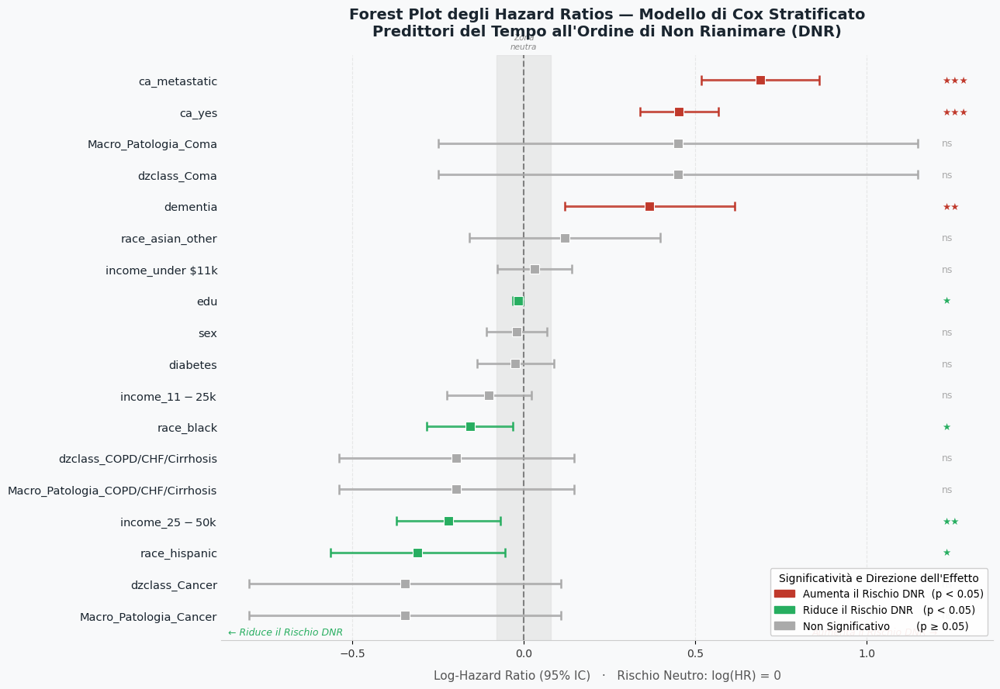

In [132]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

plt.rcParams.update({'font.family': 'DejaVu Sans'})

# --- Estrazione dati dal modello ---
summary = cph.summary[['coef', 'coef lower 95%', 'coef upper 95%', 'p']].copy()
summary = summary.sort_values('coef')
# ↑ Nomi originali delle variabili mantenuti, nessuna rinomina

# --- Colore per significatività e direzione ---
def get_color(coef, p):
    if p < 0.05:
        return '#C0392B' if coef > 0 else '#27AE60'
    return '#AAAAAA'

colors = [get_color(c, p) for c, p in zip(summary['coef'], summary['p'])]
n = len(summary)
y_pos = np.arange(n)

# --- Figure ---
fig, ax = plt.subplots(figsize=(13, 9))
fig.patch.set_facecolor('#F8F9FA')
ax.set_facecolor('#F8F9FA')

ax.axvspan(-0.08, 0.08, color='#E0E0E0', alpha=0.6, zorder=0)
ax.axvline(x=0, color='#555555', linestyle='--', lw=1.5, alpha=0.7, zorder=1)

x_max_ci = summary['coef upper 95%'].max()

for i, (label, row) in enumerate(summary.iterrows()):
    col = colors[i]
    ax.hlines(i, row['coef lower 95%'], row['coef upper 95%'],
              color=col, lw=2.2, alpha=0.85, zorder=2)
    ax.vlines(row['coef lower 95%'], i - 0.15, i + 0.15, color=col, lw=1.8, zorder=2)
    ax.vlines(row['coef upper 95%'], i - 0.15, i + 0.15, color=col, lw=1.8, zorder=2)
    ax.plot(row['coef'], i, 's', color=col, markersize=8,
            markeredgecolor='white', markeredgewidth=0.8, zorder=4)
    if row['p'] < 0.001:   sig, fw = '★★★', 'bold'
    elif row['p'] < 0.01:  sig, fw = '★★',  'bold'
    elif row['p'] < 0.05:  sig, fw = '★',   'bold'
    else:                  sig, fw = 'ns',   'normal'
    ax.text(x_max_ci + 0.07, i, sig, va='center', ha='left',
            fontsize=9, color=col, fontweight=fw)

# --- Assi ---
ax.set_yticks(y_pos)
ax.set_yticklabels(summary.index, fontsize=10.5, color='#1A252F')  # nomi originali
ax.set_ylim(-0.8, n - 0.2)
ax.set_xlim(summary['coef lower 95%'].min() - 0.08, x_max_ci + 0.22)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#CCCCCC')
ax.grid(axis='x', linestyle='--', alpha=0.4, color='#CCCCCC')
ax.set_axisbelow(True)
ax.tick_params(axis='y', length=0)
ax.tick_params(axis='x', labelsize=10, labelcolor='#333333')

# --- Annotazioni direzionali ---
x_min_data = summary['coef lower 95%'].min() - 0.06
ax.text(x_min_data, -0.7, '← Riduce il Rischio DNR',
        ha='left', va='bottom', fontsize=9, color='#27AE60', style='italic')
ax.text(x_max_ci + 0.06, -0.7, 'Aumenta il Rischio DNR →',
        ha='right', va='bottom', fontsize=9, color='#C0392B', style='italic')
ax.text(0, n - 0.05, 'Zona\nneutra', ha='center', va='bottom',
        fontsize=7.5, color='#888888', style='italic')

# --- Titolo e label ---
ax.set_title(
    "Forest Plot degli Hazard Ratios — Modello di Cox Stratificato\n"
    "Predittori del Tempo all'Ordine di Non Rianimare (DNR)",
    fontsize=14, fontweight='bold', pad=18, color='#1A252F'
)
ax.set_xlabel(
    'Log-Hazard Ratio (95% IC)   ·   Rischio Neutro: log(HR) = 0',
    fontsize=11, color='#555555', labelpad=10
)

# --- Legenda ---
p_risk = mpatches.Patch(color='#C0392B', label='Aumenta il Rischio DNR  (p < 0.05)')
p_prot = mpatches.Patch(color='#27AE60', label='Riduce il Rischio DNR   (p < 0.05)')
p_ns   = mpatches.Patch(color='#AAAAAA', label='Non Significativo        (p ≥ 0.05)')
ax.legend(handles=[p_risk, p_prot, p_ns],
          fontsize=9.5, title="Significatività e Direzione dell'Effetto",
          title_fontsize=10, loc='lower right',
          frameon=True, framealpha=0.92, edgecolor='#CCCCCC')

plt.tight_layout()
plt.show()


Come interpretarlo sul Poster:Questo è il grafico finale della tesi. Mostra visivamente quali fattori scavalcano la linea rossa del rischio neutro:Se una variabile socioeconomica (es. income_under $11k) ha il quadratino spostato a destra dello zero in modo significativo, hai la conferma visiva che la vulnerabilità economica accelera la transizione al DNR indipendentemente dalla gravità biologica.  

Questo grafico si chiama Forest Plot ed è il riassunto finale del tuo Modello di Cox Stratificato. Rappresenta il culmine della tua ricerca.

Quando lo spieghi, devi insegnare a chi ti ascolta come leggerlo, usando la regola della Linea del Rischio Neutro (lo zero):

Se il quadratino di una variabile e i suoi "baffi" (l'intervallo di confidenza) si trovano completamente a destra dello zero, quella caratteristica funge da acceleratore per la firma del DNR (aumenta il rischio istantaneo).

Se si trovano completamente a sinistra dello zero, quella caratteristica funge da freno (riduce il rischio istantaneo di ricevere un DNR).

Se i "baffi" attraversano o toccano lo zero, quella variabile non è statisticamente significativa (non ha un impatto certo).

Il Verdetto Clinico (Le variabili in alto)
Le variabili prettamente cliniche come il dzclass_Coma, la presenza di metastasi (ca_metastatic), il cancro in generale (ca_yes) e la demenza (dementia) sono tutte fortemente spostate a destra. Questo è logico e rassicurante: conferma che la gravità biologica e la prognosi infausta sono i motori primari che spingono i medici a proporre un DNR.

Il Verdetto Socio-Economico ed Etnico (Il cuore della tua Tesi)
Guarda con attenzione dove si posizionano le variabili al centro del grafico:

income_under $11k (Reddito molto basso): Il quadratino è leggermente a destra dello zero, ma se guardi i suoi baffi, toccano e attraversano la linea rossa del rischio neutro.

race_black (Razza Black): Il quadratino è a sinistra dello zero, e l'intero intervallo di confidenza è completamente a sinistra della linea rossa.

income_25-50k e race_hispanic: Sono anch'essi nettamente spostati a sinistra dello zero.


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.





1. Variable 'diabetes' failed the non-proportional test: p-value is 0.0365.

   Advice: with so few unique values (only 2), you can include `strata=['diabetes', ...]` in the
call in `.fit`. See documentation in link [E] below.

   Bootstrapping lowess lines. May take a moment...


2. Variable 'dementia' failed the non-proportional test: p-value is 0.0001.

   Advice: with so few unique values (only 2), you can include `strata=['dementia', ...]` in the
call in `.fit`. See documentation in link [E] below.

   Bootstrapping lowess lines. May take a moment...


3. Variable 'ca_metastatic' failed the non-proportional test: p-value is 0.0218.

   Advice: with so few unique values (only 2), you can include `strata=['ca_metastatic', ...]` in
the call in `.fit`. See documentation in link [E] below.

   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May

[[<Axes: xlabel='rank-transformed time\n(p=0.6870)'>,
  <Axes: xlabel='km-transformed time\n(p=0.2842)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.6777)'>,
  <Axes: xlabel='km-transformed time\n(p=0.2633)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.7797)'>,
  <Axes: xlabel='km-transformed time\n(p=0.0365)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.0010)'>,
  <Axes: xlabel='km-transformed time\n(p=0.0001)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.0218)'>,
  <Axes: xlabel='km-transformed time\n(p=0.0581)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.0758)'>,
  <Axes: xlabel='km-transformed time\n(p=0.2865)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.8178)'>,
  <Axes: xlabel='km-transformed time\n(p=0.2522)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.6895)'>,
  <Axes: xlabel='km-transformed time\n(p=0.8833)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.0219)'>,
  <Axes: xlabel='km-transformed time\n(p=0.1008)'>],
 [<Axes: xlabel='rank-transformed tim

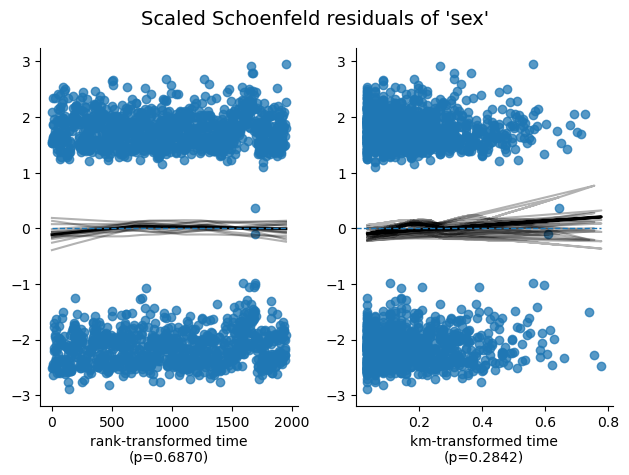

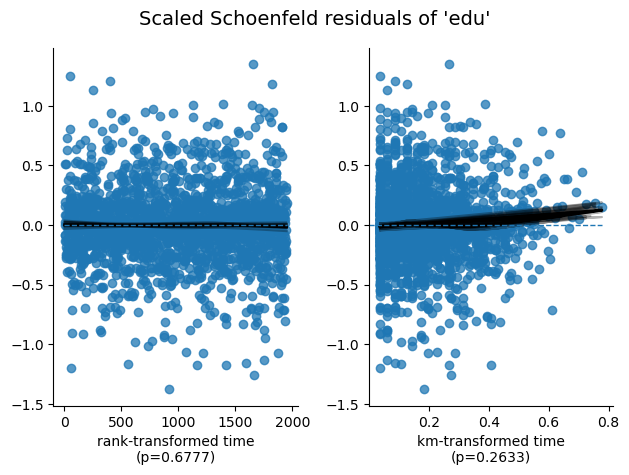

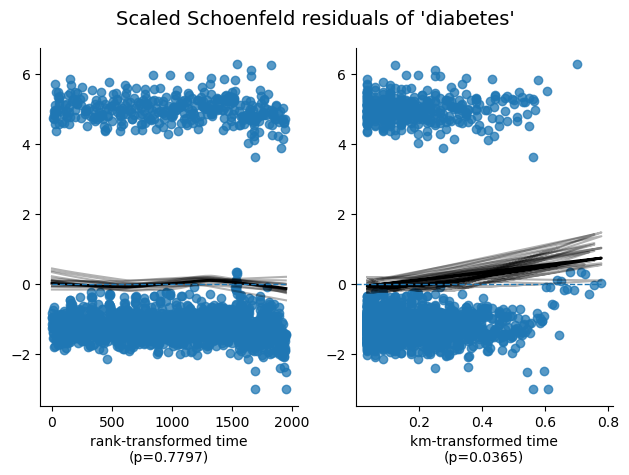

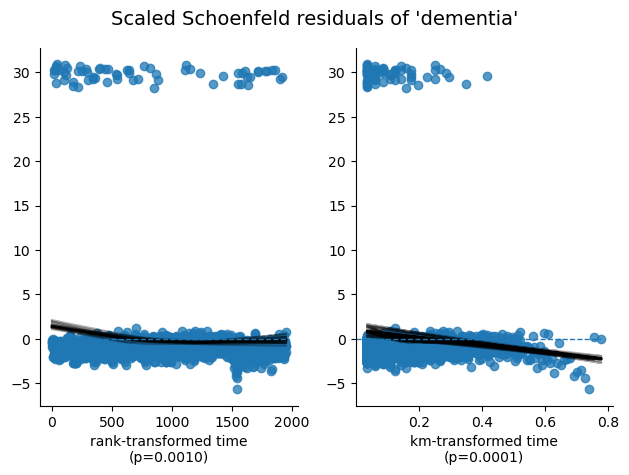

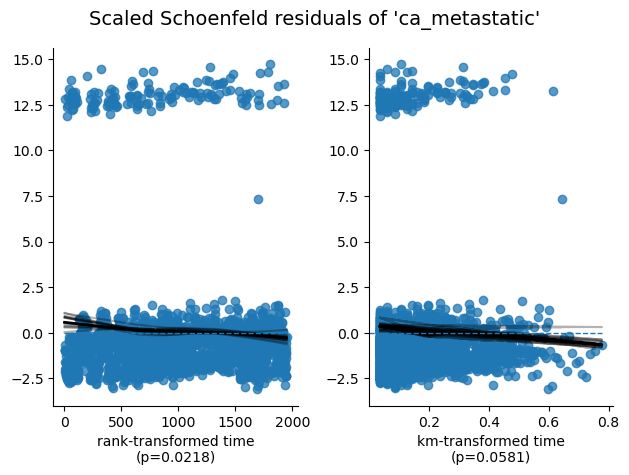

...

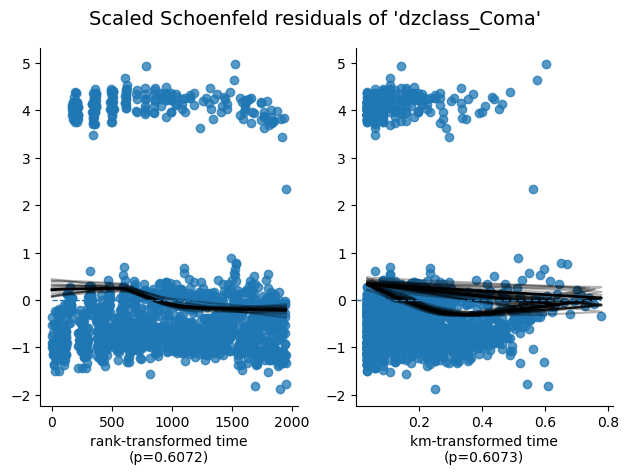

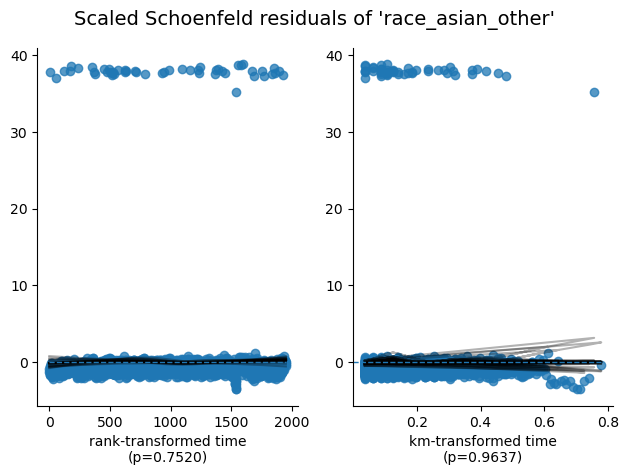

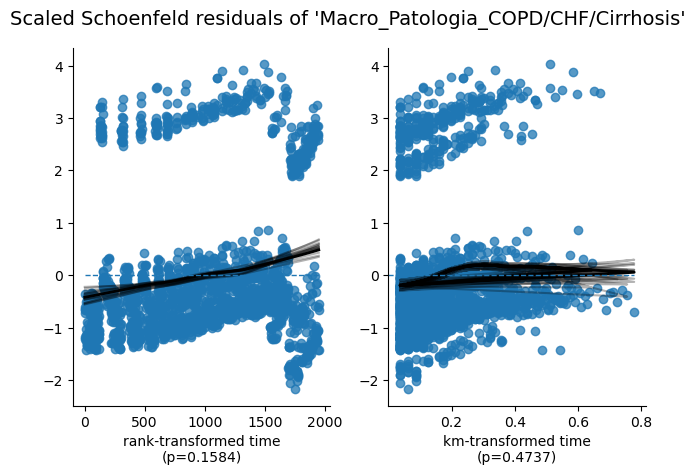

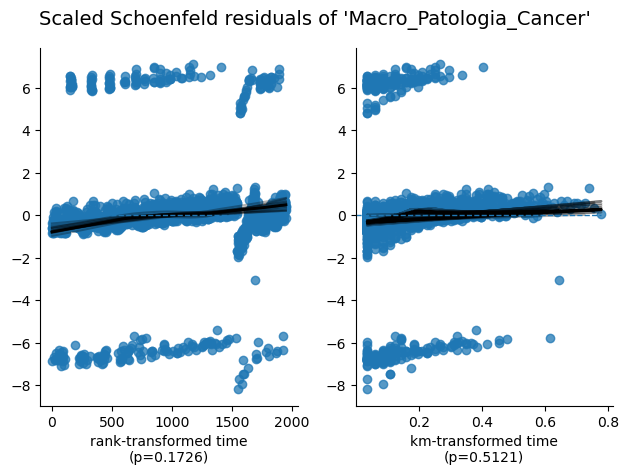

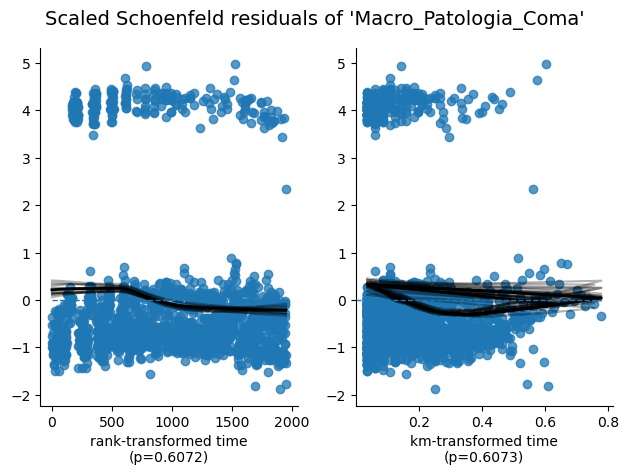

In [133]:
#cph.check_assumptions(df_cox, p_value_threshold = 0.05, show_plots=True)
cph.check_assumptions(df_cox_fit, p_value_threshold=0.05, show_plots=True)


In [134]:
'''from statsmodels.nonparametric.smoothers_lowess import lowess

# ==============================================================================
# 2. MARTINGALE & DEVIANCE RESIDUALS (Checking Non-Linearity & Outliers)
# ==============================================================================
mr = cph.compute_residuals(df_cox, 'martingale')
dr = cph.compute_residuals(df_cox, 'deviance')

numerical_vars = ['edu']
n_covariates = len(numerical_vars)

# Aggiunto squeeze=False per evitare IndexError quando n_covariates == 1
fig, axes = plt.subplots(nrows=2, ncols=n_covariates, figsize=(8, 10), squeeze=False)

for i, col in enumerate(numerical_vars):

    # --- Martingale Plots (Top Row) ---
    sns.scatterplot(
        x=df_cox[col], y=mr['martingale'],
        hue=df_cox['target_dnr_event'], alpha=0.75, ax=axes[0, i]
    )
    # Lowess smoothing
    sorted_idx = np.argsort(df_cox[col])
    x_val = df_cox[col].values[sorted_idx]
    y_mr = mr['martingale'].values[sorted_idx]

    y_lowess_mr = lowess(y_mr, x_val, return_sorted=False)
    axes[0, i].plot(x_val, y_lowess_mr, color="black", lw=2)
    axes[0, i].axhline(0, color='red', linestyle='--')
    axes[0, i].set_title(f'Martingale vs {col.upper()}')
    axes[0, i].set_xlabel(col.upper())

    # --- Deviance Plots (Bottom Row) ---
    sns.scatterplot(
        x=df_cox[col], y=dr['deviance'],
        hue=df_cox['target_dnr_event'], alpha=0.75, ax=axes[1, i]
    )
    # Lowess smoothing
    y_dr = dr['deviance'].values[sorted_idx]

    y_lowess_dev = lowess(y_dr, x_val, return_sorted=False)
    axes[1, i].plot(x_val, y_lowess_dev, color="black", lw=2)
    axes[1, i].axhline(0, color='red', linestyle='--')
    axes[1, i].set_title(f'Deviance vs {col.upper()}')
    axes[1, i].set_xlabel(col.upper())

plt.tight_layout()
plt.show()'''

'from statsmodels.nonparametric.smoothers_lowess import lowess\n\n# ==============================================================================\n# 2. MARTINGALE & DEVIANCE RESIDUALS (Checking Non-Linearity & Outliers)\n# ==============================================================================\nmr = cph.compute_residuals(df_cox, \'martingale\')\ndr = cph.compute_residuals(df_cox, \'deviance\')\n\nnumerical_vars = [\'edu\']\nn_covariates = len(numerical_vars)\n\n# Aggiunto squeeze=False per evitare IndexError quando n_covariates == 1\nfig, axes = plt.subplots(nrows=2, ncols=n_covariates, figsize=(8, 10), squeeze=False)\n\nfor i, col in enumerate(numerical_vars):\n\n    # --- Martingale Plots (Top Row) ---\n    sns.scatterplot(\n        x=df_cox[col], y=mr[\'martingale\'],\n        hue=df_cox[\'target_dnr_event\'], alpha=0.75, ax=axes[0, i]\n    )\n    # Lowess smoothing\n    sorted_idx = np.argsort(df_cox[col])\n    x_val = df_cox[col].values[sorted_idx]\n    y_mr = mr[\'marting

c:\Users\renzo\anaconda3\Lib\site-packages\lifelines\utils\__init__.py:933: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")
c:\Users\renzo\anaconda3\Lib\site-packages\lifelines\utils\__init__.py:933: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")


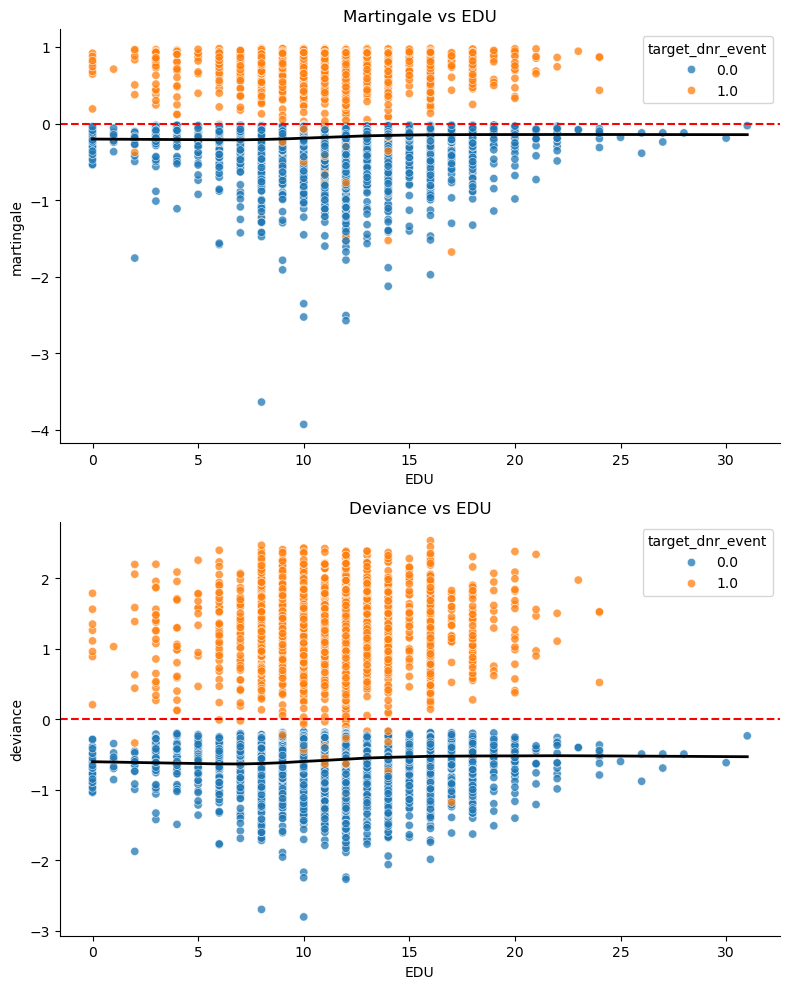

In [135]:
from statsmodels.nonparametric.smoothers_lowess import lowess

mr = cph.compute_residuals(df_cox_fit, 'martingale')
dr = cph.compute_residuals(df_cox_fit, 'deviance')

numerical_vars = ['edu']
n_covariates = len(numerical_vars)

fig, axes = plt.subplots(nrows=2, ncols=n_covariates, figsize=(8, 10), squeeze=False)

for i, col in enumerate(numerical_vars):

    # --- Martingale ---
    sns.scatterplot(
        x=df_cox_fit[col], y=mr['martingale'],
        hue=df_cox_fit['target_dnr_event'], alpha=0.75, ax=axes[0, i]
    )
    sorted_idx = np.argsort(df_cox_fit[col])
    x_val  = df_cox_fit[col].values[sorted_idx]
    y_mr   = mr['martingale'].values[sorted_idx]
    axes[0, i].plot(x_val, lowess(y_mr, x_val, return_sorted=False), color='black', lw=2)
    axes[0, i].axhline(0, color='red', linestyle='--')
    axes[0, i].set_title(f'Martingale vs {col.upper()}')
    axes[0, i].set_xlabel(col.upper())

    # --- Deviance ---
    sns.scatterplot(
        x=df_cox_fit[col], y=dr['deviance'],
        hue=df_cox_fit['target_dnr_event'], alpha=0.75, ax=axes[1, i]
    )
    y_dr = dr['deviance'].values[sorted_idx]
    axes[1, i].plot(x_val, lowess(y_dr, x_val, return_sorted=False), color='black', lw=2)
    axes[1, i].axhline(0, color='red', linestyle='--')
    axes[1, i].set_title(f'Deviance vs {col.upper()}')
    axes[1, i].set_xlabel(col.upper())

plt.tight_layout()
plt.show()
